<a href="https://colab.research.google.com/github/ZulfiqarAlee-code/Menu/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [14]:
df = pd.read_csv("/content/Dataset.csv")


In [15]:
df.head()

,Flow ID,Source IP,Source Port,Destination IP,Destination Port,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,192.168.10.3-192.168.10.8-53-50958-17,192.168.10.8,50958,192.168.10.3,53,17,30613,2,2,94,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,172.16.0.1-192.168.10.50-46952-22-6,172.16.0.1,46952,192.168.10.50,22,6,79,1,1,0,...,32,0.0,0.0,0,0,0.0,0.0,0,0,SSH-Patator
2,172.16.0.1-192.168.10.50-64441-80-6,172.16.0.1,64441,192.168.10.50,80,6,1351997,4,0,24,...,20,0.0,0.0,0,0,0.0,0.0,0,0,DDoS
3,172.16.0.1-192.168.10.50-38998-80-6,172.16.0.1,38998,192.168.10.50,80,6,63133461,7,0,0,...,40,7006178.0,0.0,7006178,7006178,18700000.0,12200000.0,32100000,8015946,DoS Slowhttptest
4,172.16.0.1-192.168.10.50-50606-80-6,172.16.0.1,50606,192.168.10.50,80,6,63131320,7,0,0,...,40,7011599.0,0.0,7011599,7011599,18700000.0,12200000.0,32100000,8023924,DoS Slowhttptest


In [16]:
df.columns

Index(['Flow ID', ' Source IP', ' Source Port', ' Destination IP',
       ' Destination Port', ' Protocol', ' Flow Duration',
       ' Total Fwd Packets', ' Total Backward Packets',
       'Total Length of Fwd Packets', ' Total Length of Bwd Packets',
       ' Fwd Packet Length Max', ' Fwd Packet Length Min',
       ' Fwd Packet Length Mean', ' Fwd Packet Length Std',
       'Bwd Packet Length Max', ' Bwd Packet Length Min',
       ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s',
       ' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max',
       ' Flow IAT Min', 'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std',
       ' Fwd IAT Max', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean',
       ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags',
       ' Bwd PSH Flags', ' Fwd URG Flags', ' Bwd URG Flags',
       ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s',
       ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length',


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79400 entries, 0 to 79399
Data columns (total 84 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Flow ID                       79400 non-null  object 
 1    Source IP                    79400 non-null  object 
 2    Source Port                  79400 non-null  int64  
 3    Destination IP               79400 non-null  object 
 4    Destination Port             79400 non-null  int64  
 5    Protocol                     79400 non-null  int64  
 6    Flow Duration                79400 non-null  int64  
 7    Total Fwd Packets            79400 non-null  int64  
 8    Total Backward Packets       79400 non-null  int64  
 9   Total Length of Fwd Packets   79400 non-null  int64  
 10   Total Length of Bwd Packets  79400 non-null  int64  
 11   Fwd Packet Length Max        79400 non-null  int64  
 12   Fwd Packet Length Min        79400 non-null  int64  
 13   

In [18]:
df.columns

Index(['Flow ID', ' Source IP', ' Source Port', ' Destination IP',
       ' Destination Port', ' Protocol', ' Flow Duration',
       ' Total Fwd Packets', ' Total Backward Packets',
       'Total Length of Fwd Packets', ' Total Length of Bwd Packets',
       ' Fwd Packet Length Max', ' Fwd Packet Length Min',
       ' Fwd Packet Length Mean', ' Fwd Packet Length Std',
       'Bwd Packet Length Max', ' Bwd Packet Length Min',
       ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s',
       ' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max',
       ' Flow IAT Min', 'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std',
       ' Fwd IAT Max', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean',
       ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags',
       ' Bwd PSH Flags', ' Fwd URG Flags', ' Bwd URG Flags',
       ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s',
       ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length',


# **Find missing value**

In [19]:
#find missing values
df.isnull().sum().sum()

23

In [20]:
# Remove rows with any missing values
df.dropna(inplace=True)


In [21]:
#find missing values
df.isnull().sum().sum()

0

# **Find the infintite value in dataset**

In [22]:
# Identify the infinite values (both np.inf and -np.inf)
infinite_values = df.isin([np.inf, -np.inf])

# Show the specific feature(s) and their values that are infinite
for column in df.columns:
    # Get the rows where the value is infinite for the current column
    inf_rows = df[column][infinite_values[column]]

    if not inf_rows.empty:
        print(f"Column: {column}")
        print(f"Rows with infinite values:\n{inf_rows}\n")
# Count the number of infinite values
num_infinite_values = infinite_values.sum().sum()

print(f"Number of infinite values in the DataFrame: {num_infinite_values}")

Column: Flow Bytes/s
Rows with infinite values:
13123    inf
15490    inf
16123    inf
21739    inf
28348    inf
30336    inf
32556    inf
41517    inf
41759    inf
42792    inf
47280    inf
50166    inf
52275    inf
52618    inf
53507    inf
54280    inf
59748    inf
60096    inf
61220    inf
61964    inf
63843    inf
65981    inf
69341    inf
72479    inf
76469    inf
Name: Flow Bytes/s, dtype: float64

Column:  Flow Packets/s
Rows with infinite values:
13123    inf
15490    inf
16123    inf
21739    inf
28348    inf
30336    inf
32556    inf
41517    inf
41759    inf
42792    inf
47280    inf
50166    inf
52275    inf
52618    inf
53507    inf
54280    inf
59748    inf
60096    inf
61220    inf
61964    inf
63843    inf
65981    inf
69341    inf
72479    inf
76469    inf
Name:  Flow Packets/s, dtype: float64

Number of infinite values in the DataFrame: 50


**Create new dataframe for infinite value**

In [28]:
# Find rows with infinite value

# Find rows with infinite values
infinite_mask = df.select_dtypes(include=np.number).isin([np.inf, -np.inf]).any(axis=1)

# Create a DataFrame of rows containing infinite values
infinite_df = df[infinite_mask]

# Display the result
print("Rows with Infinite Values:")
#print(infinite_df)

# Save to a CSV file if needed
infinite_df.to_csv('infinite_values.csv', index=False)
# Get a mask for rows with any infinite values
infinite_mask = infinite_values.any(axis=1)


# Create a DataFrame of rows containing infinite values
infinite_df = df[infinite_mask]

# Display the result
print("Rows with Infinite Values:")
#infinite_df

# Save to a CSV file if needed
infinite_df.to_csv('infinite_values.csv', index=False)
infinite_df.shape

Rows with Infinite Values:
Rows with Infinite Values:


(25, 84)

**Remove the Infinite values**

In [ ]:
# Replace infinite values with NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with NaN values (which were previously infinite)
df.dropna(inplace=True)

# Verify that there are no more infinite or NaN values
print(f"Number of infinite values after removal: {df.isin([np.inf, -np.inf]).sum().sum()}")
print(f"Number of NaN values after removal: {df.isnull().sum().sum()}")

Number of infinite values after removal: 0
Number of NaN values after removal: 0


# **Visualize Data Distributions**

1) Use histograms and boxplots for numeric features.

2) Use bar charts or countplots for categorical features.


In [ ]:
# prompt: write a code that list the feature name that are  number and give total number of numeric features

numeric_features = []
for col in df.columns:
    if pd.api.types.is_numeric_dtype(df[col]):
        numeric_features.append(col)

print("Numeric Features:",numeric_features)
print("\nTotal number of numeric features:", len(numeric_features))

Numeric Features: [' Source Port', ' Destination Port', ' Protocol', ' Flow Duration', ' Total Fwd Packets', ' Total Backward Packets', 'Total Length of Fwd Packets', ' Total Length of Bwd Packets', ' Fwd Packet Length Max', ' Fwd Packet Length Min', ' Fwd Packet Length Mean', ' Fwd Packet Length Std', 'Bwd Packet Length Max', ' Bwd Packet Length Min', ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min', 'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Bwd PSH Flags', ' Fwd URG Flags', ' Bwd URG Flags', ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length', ' Packet Length Mean', ' Packet Length Std', ' Packet Length Variance', 'FIN Flag Count', ' SYN Flag Count', ' RST Flag Count', ' 

In [ ]:
# Assuming df is your DataFrame and it's already loaded and preprocessed as in your code.
non_numeric_features = []
for col in df.columns:
    if not pd.api.types.is_numeric_dtype(df[col]):
        non_numeric_features.append(col)

print(non_numeric_features)
print("Total no of Non numerical Feature :",len(non_numeric_features))

['Flow ID', ' Source IP', ' Destination IP', ' Label']
Total no of Non numerical Feature : 4


In [ ]:
# Unique values in non numeric feature
# Assuming df is your DataFrame and it's already loaded and preprocessed as in your code.
non_numeric_features = []
for col in df.columns:
    if not pd.api.types.is_numeric_dtype(df[col]):
        non_numeric_features.append(col)

# Create an empty list to store the results
table_data = []

# Iterate through non-numeric features
for feature in non_numeric_features:
    total_values = len(df[feature])  # Total number of values in the feature
    unique_values = len(df[feature].unique())  # Number of unique values in the feature
    table_data.append([feature, total_values, unique_values])

# Create a DataFrame from the collected data
table_df = pd.DataFrame(table_data, columns=['Feature', 'Total Values', 'Unique Values'])

# Display the table
table_df

,Feature,Total Values,Unique Values
0,Flow ID,79352,48760
1,Source IP,79352,1612
2,Destination IP,79352,2880
3,Label,79352,11


**Plot Bar Chart to object datatype**

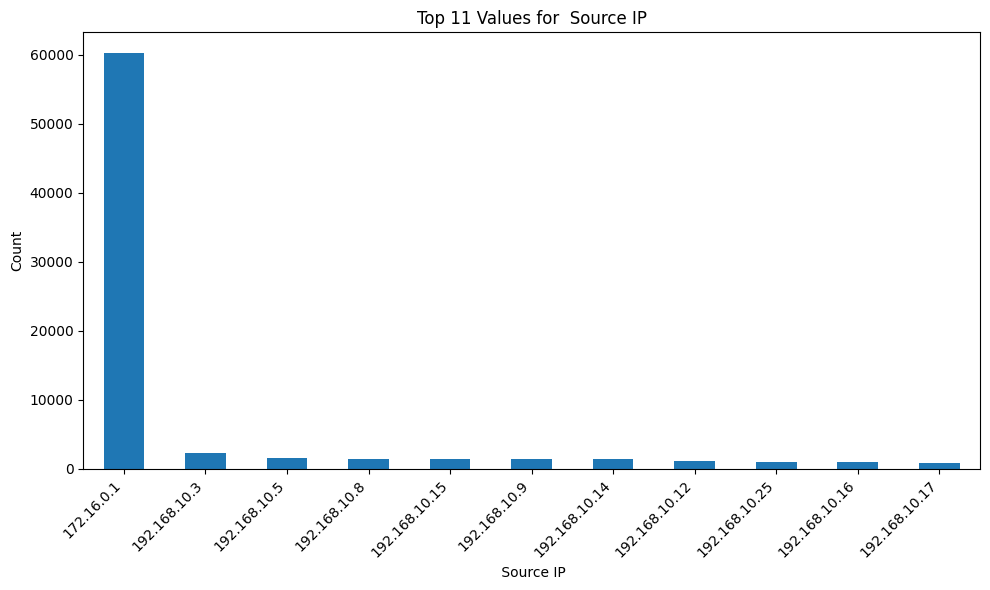

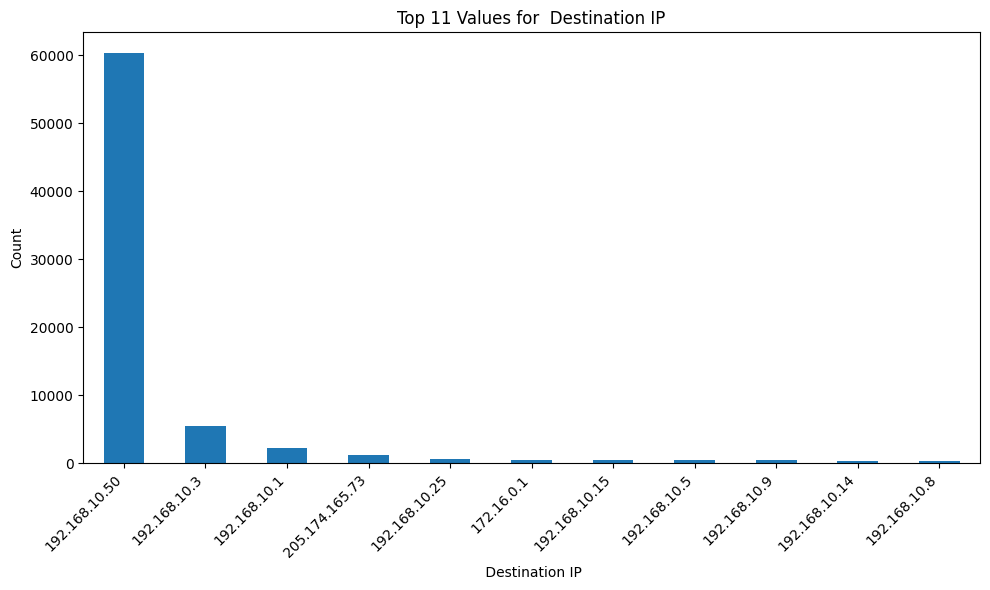

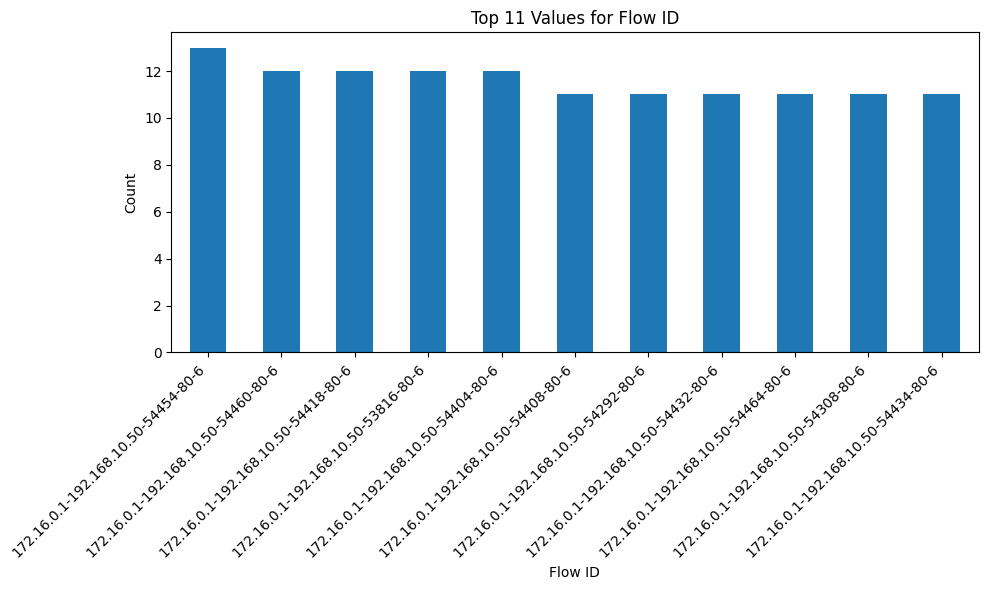

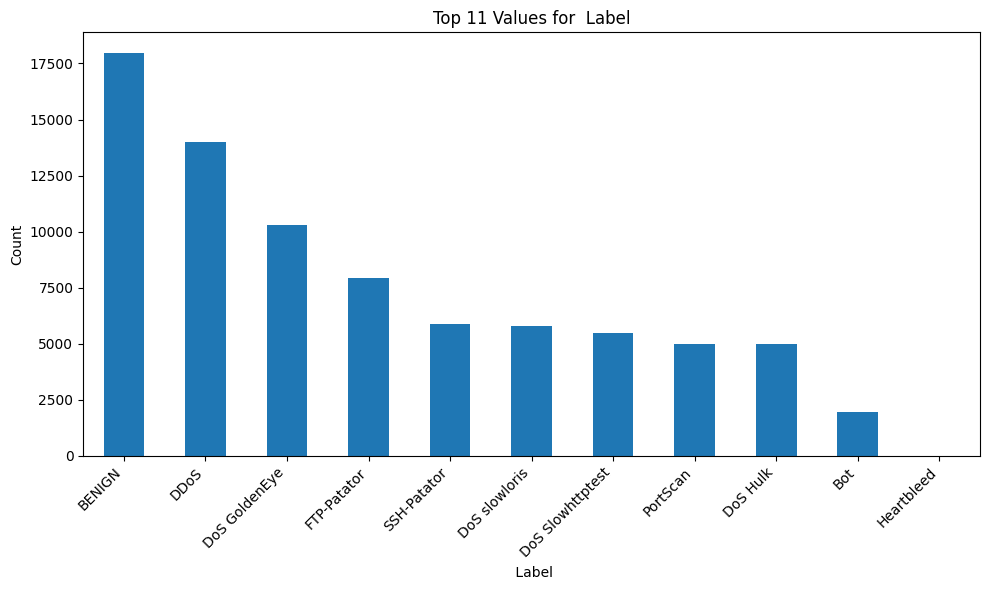

In [ ]:
# prompt: write a function that plot the bar chart of top 10 values of 'Flow ID', ' Source IP', ' Destination IP', ' Label'

import matplotlib.pyplot as plt

def plot_top_10_bar_charts(df):
    """Plots bar charts for the top 10 values of specified columns."""

    cols_to_plot = [ ' Source IP', ' Destination IP','Flow ID', ' Label']

    for col in cols_to_plot:
        top_10 = df[col].value_counts().nlargest(11)
        plt.figure(figsize=(10, 6))
        top_10.plot(kind='bar')
        plt.title(f'Top 11 Values for {col}')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
        plt.tight_layout() #Adjust layout to prevent labels from overlapping
        plt.show()

plot_top_10_bar_charts(df)

# **Plot Histogram for numeric Feature**

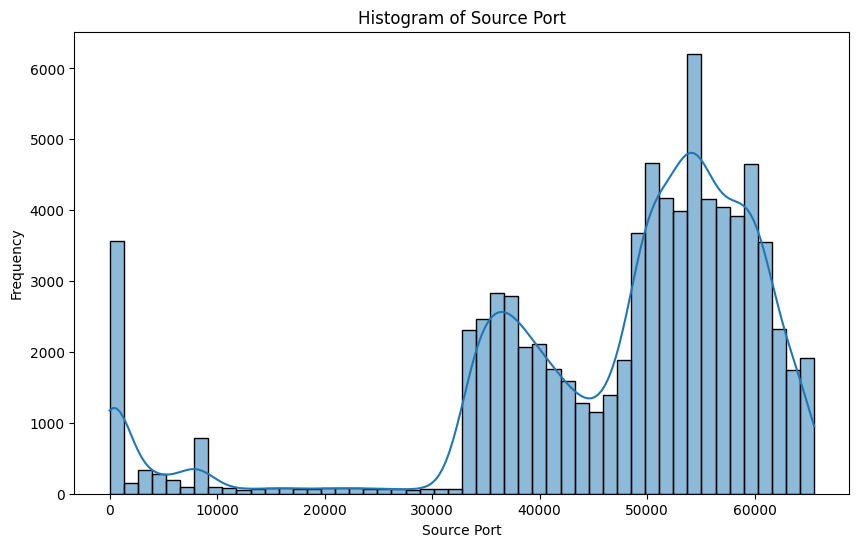

In [ ]:
# prompt: generate the histogram of source port feature

plt.figure(figsize=(10, 6))
sns.histplot(df[' Source Port'], bins=50, kde=True)  # Increased bins for better detail
plt.title('Histogram of Source Port')
plt.xlabel('Source Port')
plt.ylabel('Frequency')
plt.show()

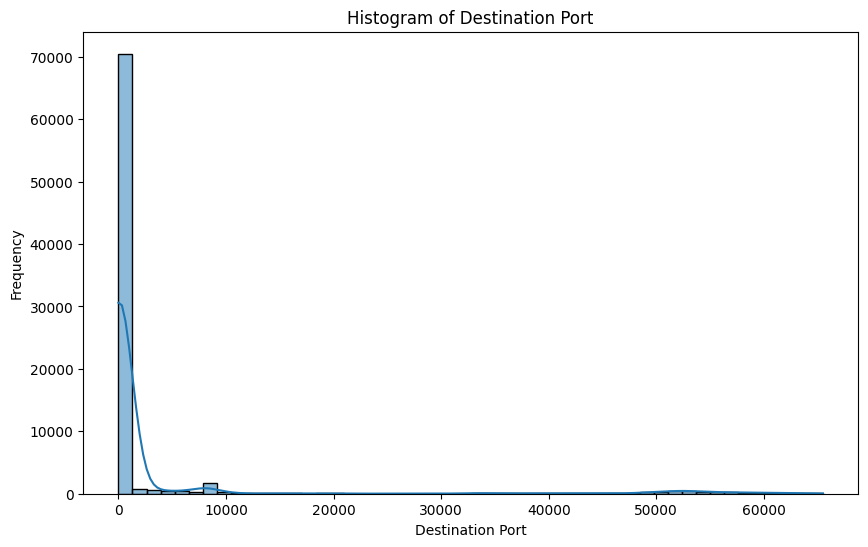

In [ ]:

# prompt: generate the histogram of destination port

plt.figure(figsize=(10, 6))
sns.histplot(df[' Destination Port'], bins=50, kde=True)  # Increased bins for better detail
plt.title('Histogram of Destination Port')
plt.xlabel('Destination Port')
plt.ylabel('Frequency')
plt.show()

In [ ]:
df.columns

Index(['Flow ID', ' Source IP', ' Source Port', ' Destination IP',
       ' Destination Port', ' Protocol', ' Flow Duration',
       ' Total Fwd Packets', ' Total Backward Packets',
       'Total Length of Fwd Packets', ' Total Length of Bwd Packets',
       ' Fwd Packet Length Max', ' Fwd Packet Length Min',
       ' Fwd Packet Length Mean', ' Fwd Packet Length Std',
       'Bwd Packet Length Max', ' Bwd Packet Length Min',
       ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s',
       ' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max',
       ' Flow IAT Min', 'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std',
       ' Fwd IAT Max', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean',
       ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags',
       ' Bwd PSH Flags', ' Fwd URG Flags', ' Bwd URG Flags',
       ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s',
       ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length',


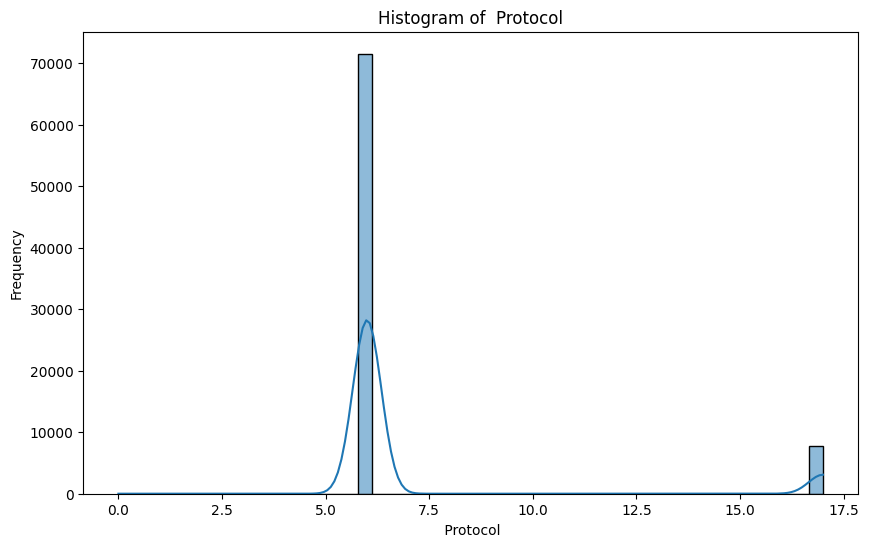

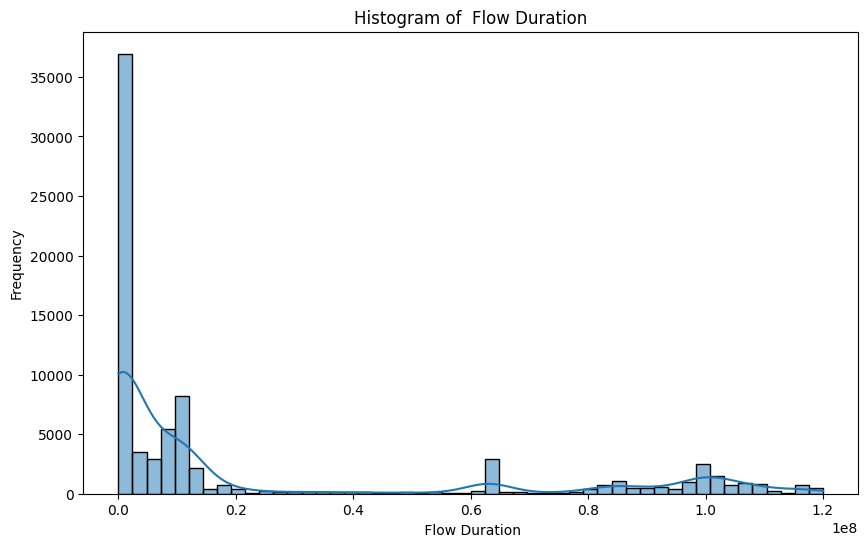

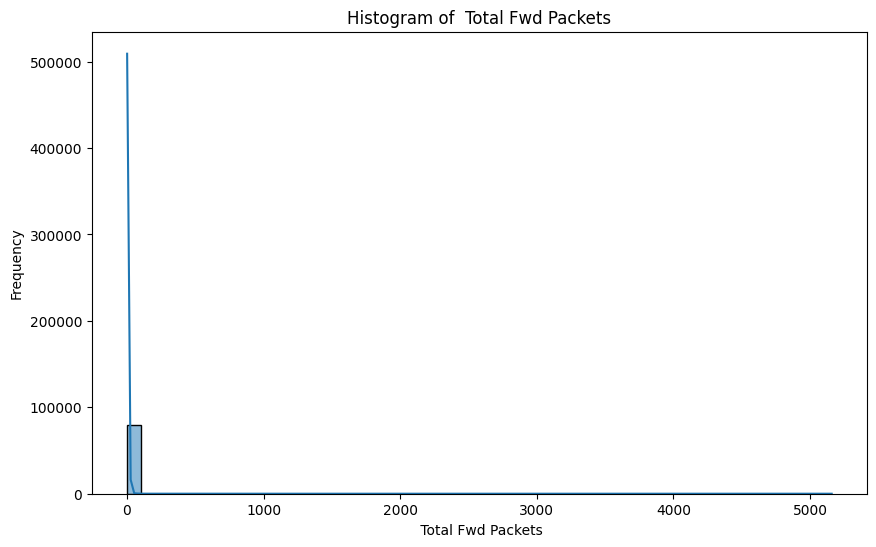

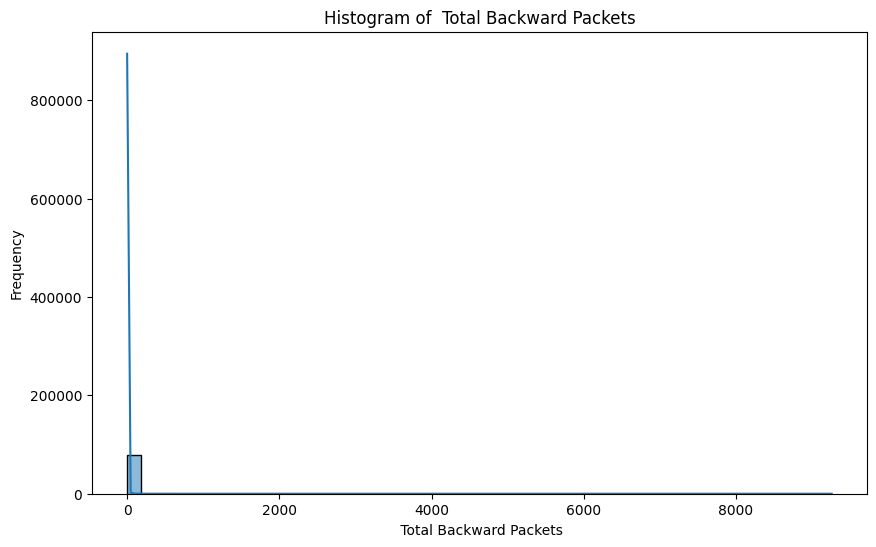

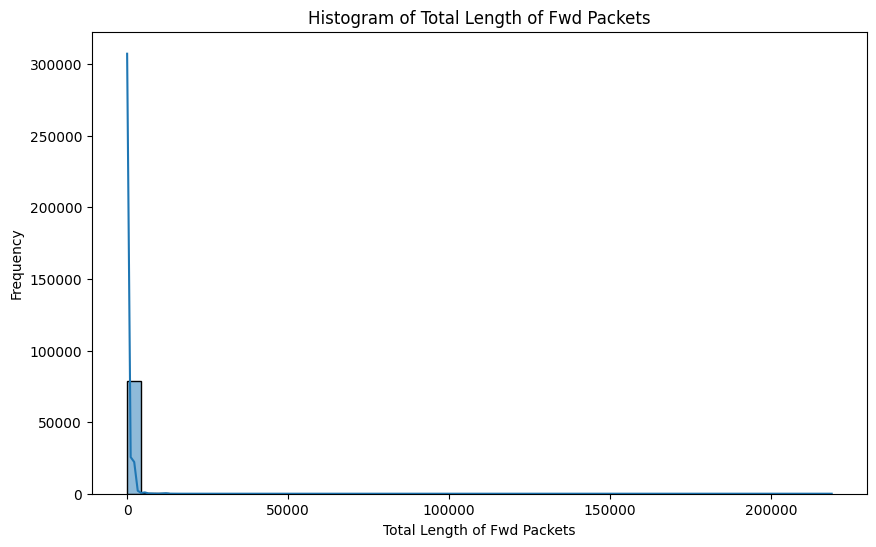

...

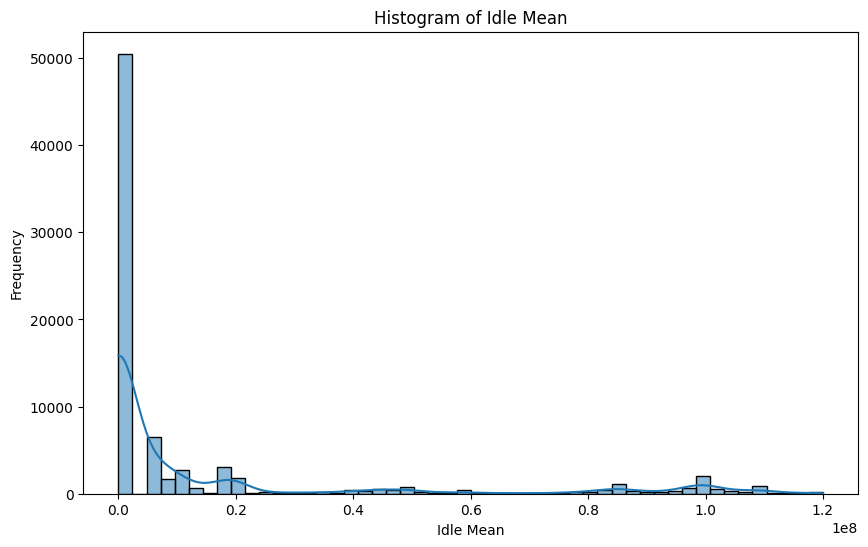

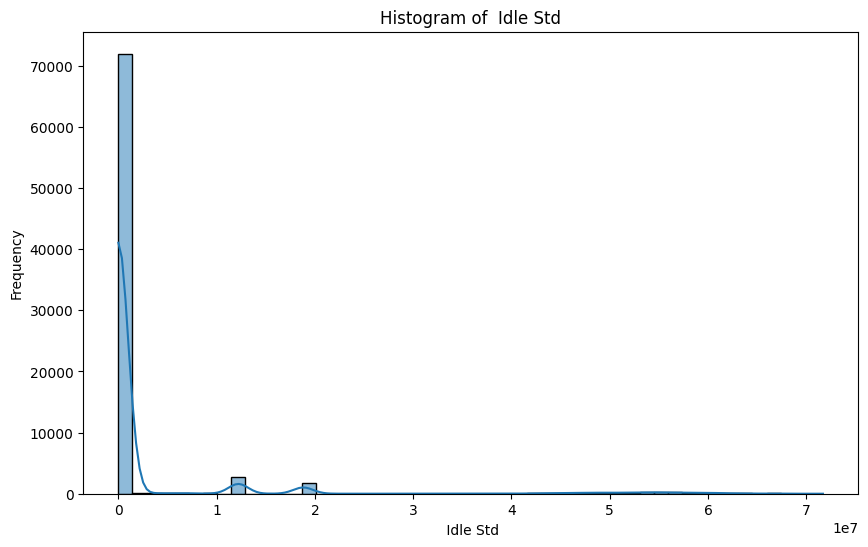

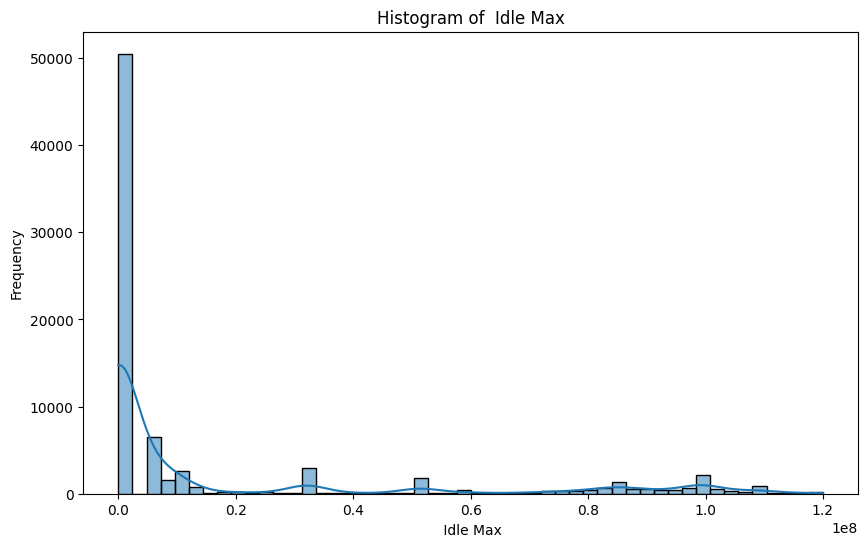

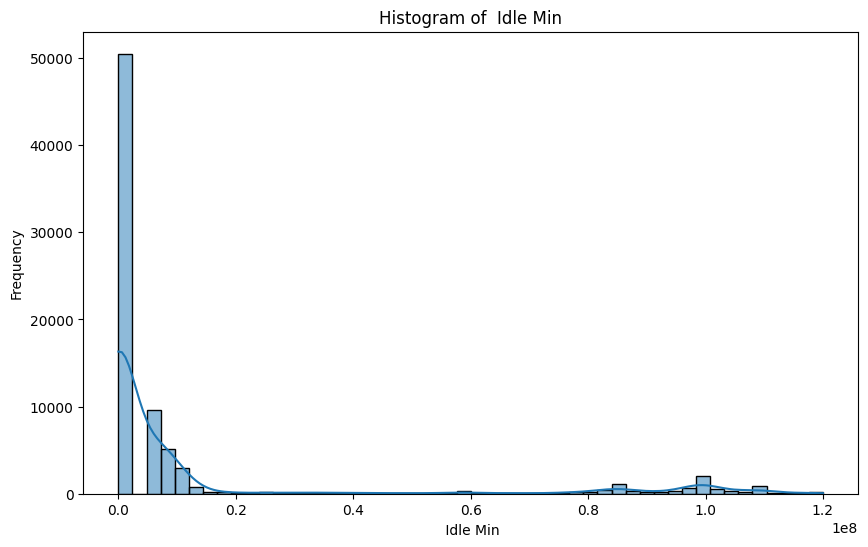

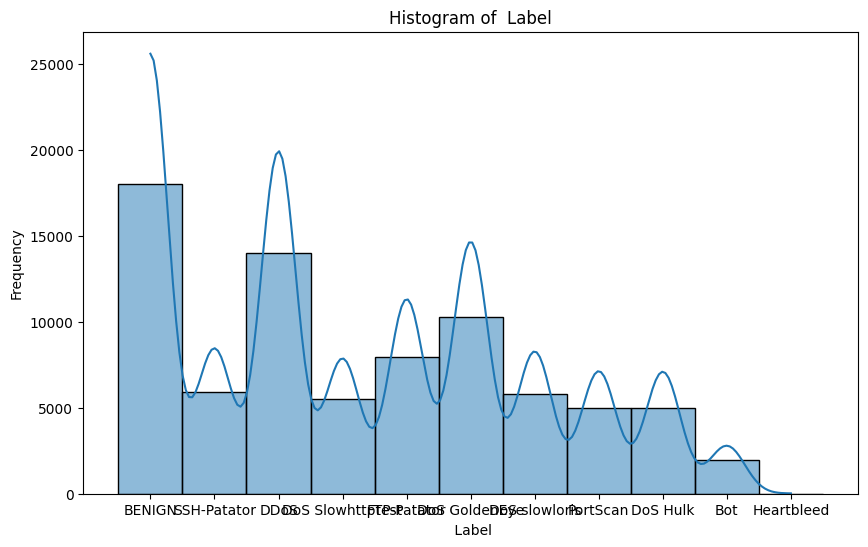

In [ ]:
# prompt: generate the histogram of all features other than source port and destination port

# Assuming df is your DataFrame and it has already been cleaned as in the previous code.

features_to_plot = [col for col in df.columns if col not in [' Source IP', ' Source Port', ' Destination IP', ' Destination Port','Flow ID',' Label' ]]

for feature in features_to_plot:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[feature], bins=50, kde=True)
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
df.columns



Index(['Flow ID', ' Source IP', ' Source Port', ' Destination IP',
       ' Destination Port', ' Protocol', ' Flow Duration',
       ' Total Fwd Packets', ' Total Backward Packets',
       'Total Length of Fwd Packets', ' Total Length of Bwd Packets',
       ' Fwd Packet Length Max', ' Fwd Packet Length Min',
       ' Fwd Packet Length Mean', ' Fwd Packet Length Std',
       'Bwd Packet Length Max', ' Bwd Packet Length Min',
       ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s',
       ' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max',
       ' Flow IAT Min', 'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std',
       ' Fwd IAT Max', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean',
       ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags',
       ' Bwd PSH Flags', ' Fwd URG Flags', ' Bwd URG Flags',
       ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s',
       ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length',


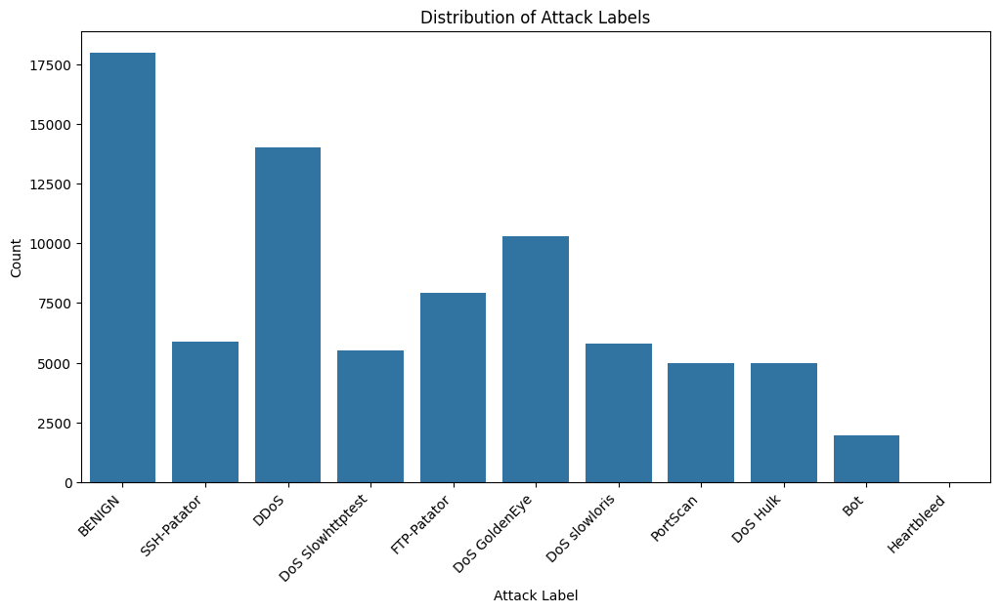

In [ ]:
# prompt: generate the histrogram of ' Label' feature in such way that the attacks on x axis is tilted in such that can be readable

plt.figure(figsize=(12, 6))
sns.countplot(x=' Label', data=df)
plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability
plt.title('Distribution of Attack Labels')
plt.xlabel('Attack Label')
plt.ylabel('Count')
plt.show()

 Table for Number sample per attack

In [11]:
# prompt: write function that generate the table of label feature  that show number of sample of each unique value

def generate_label_feature_table(df):
    """Generates a table of label feature with counts."""

    # Assuming 'Label' is the column you want to analyze.
    # If your label column has a different name, replace 'Label' below.
    label_column = ' Label'

    if label_column not in df.columns:
        print(f"Error: Column '{label_column}' not found in the DataFrame.")
        return None

    # Calculate value counts
    label_counts = df[label_column].value_counts().reset_index()
    label_counts.columns = [label_column, 'Count']  # Rename columns for clarity

    return label_counts

# Example usage (assuming 'df' is your DataFrame):
label_table = generate_label_feature_table(df)
if label_table is not None:
  print(label_table)

               Label  Count
0             BENIGN  18000
1               DDoS  14000
2      DoS GoldenEye  10293
3        FTP-Patator   7938
4        SSH-Patator   5897
5      DoS slowloris   5796
6   DoS Slowhttptest   5499
7           PortScan   5000
8           DoS Hulk   5000
9                Bot   1966
10        Heartbleed     11


**Perform PDF to Numeric values**

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


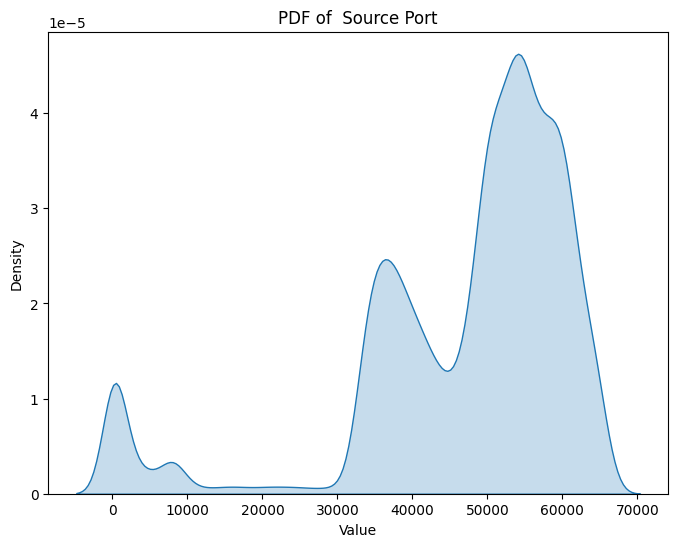

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


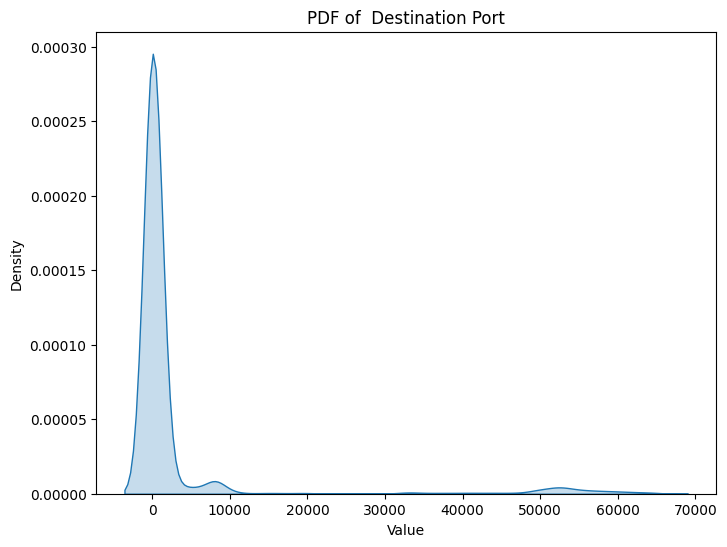

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


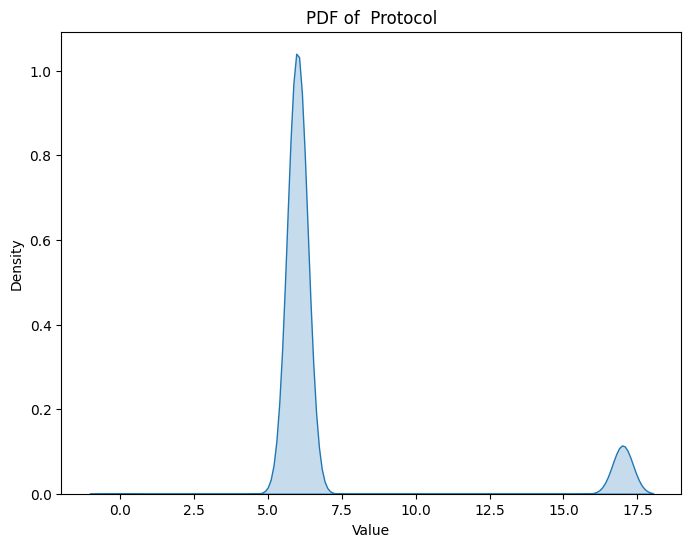

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


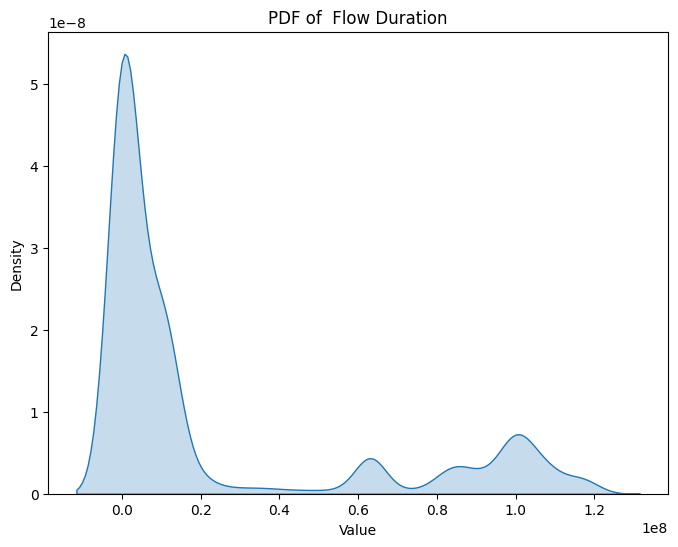

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


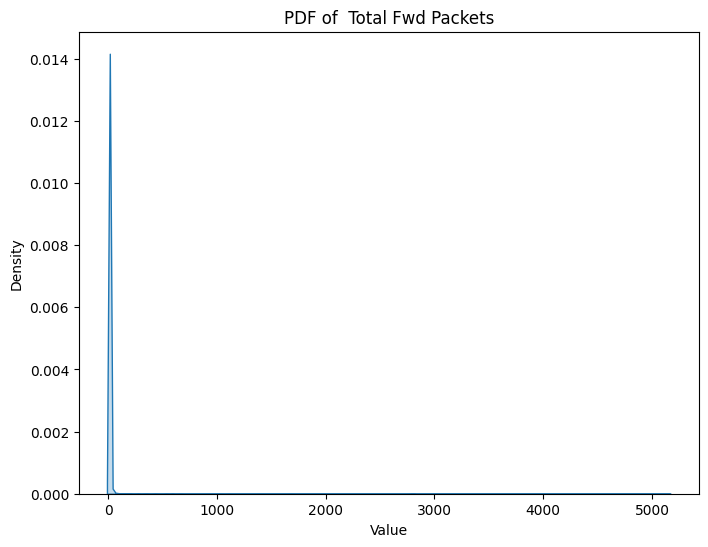

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


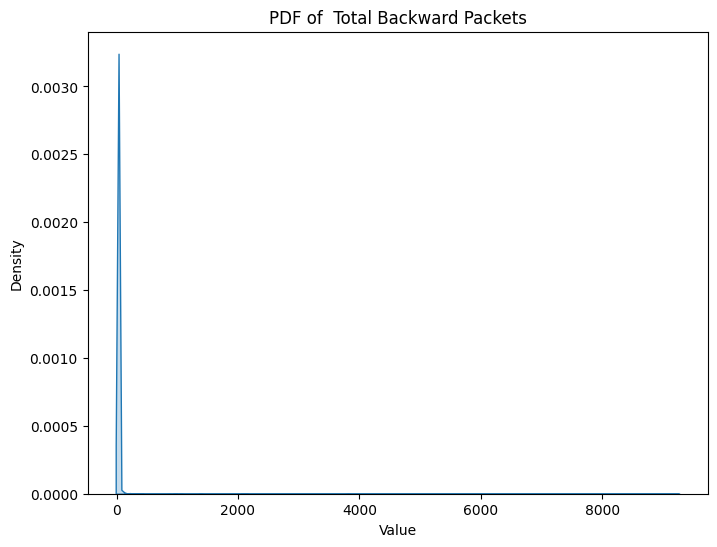

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


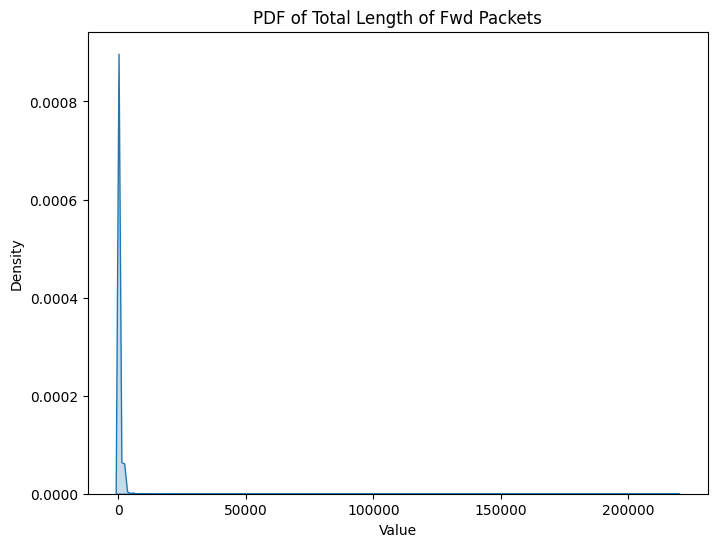

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


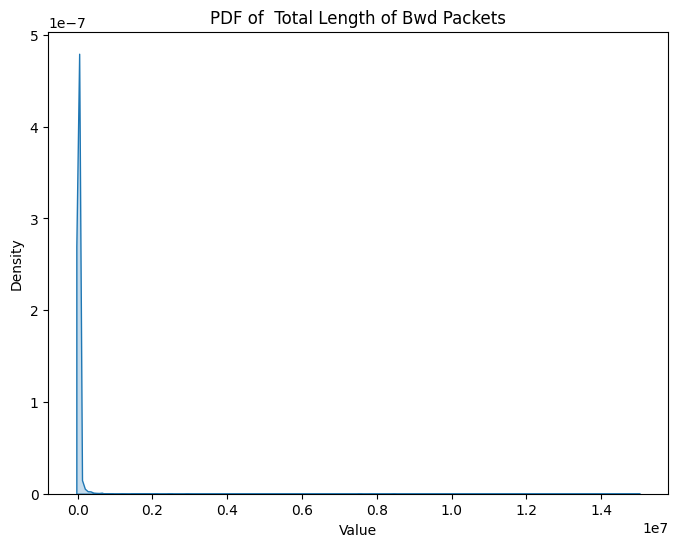

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


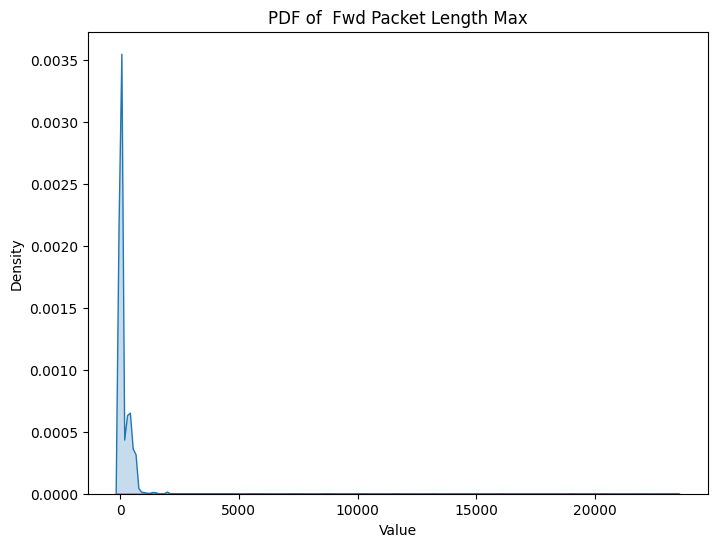

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


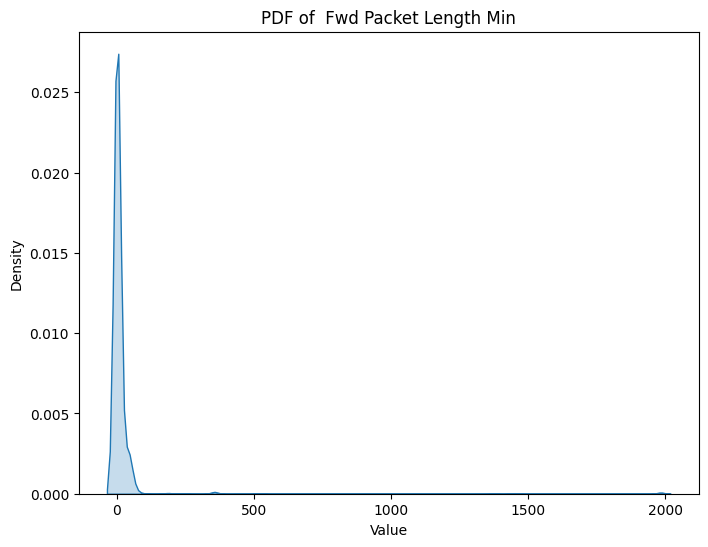

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


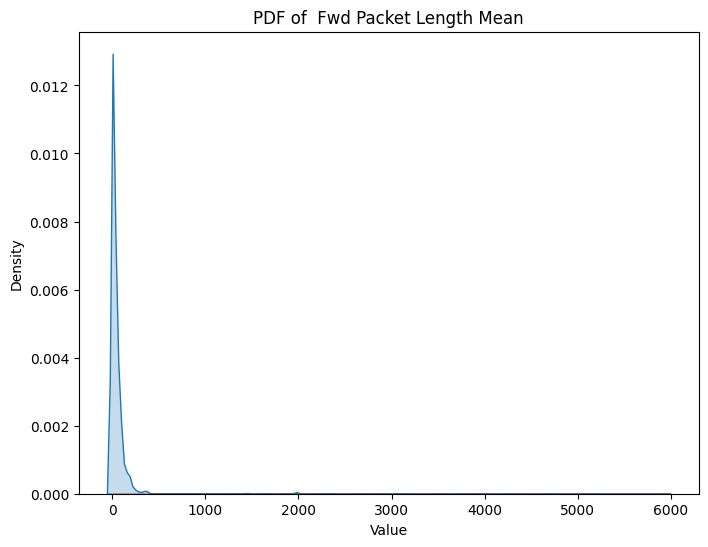

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


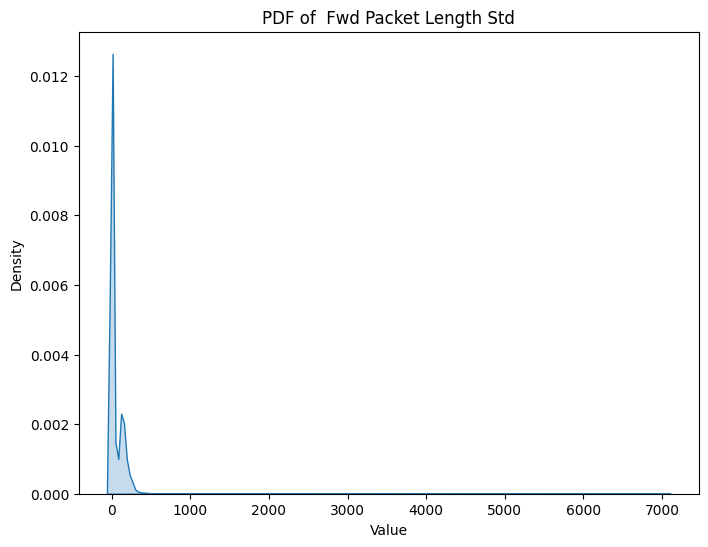

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


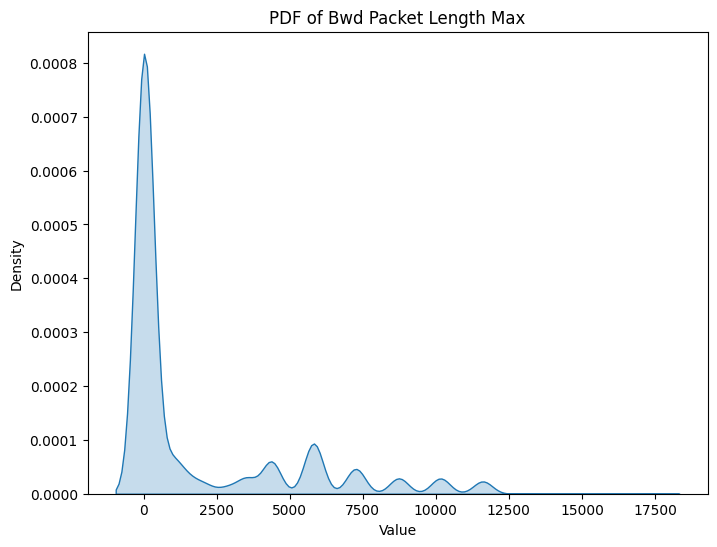

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


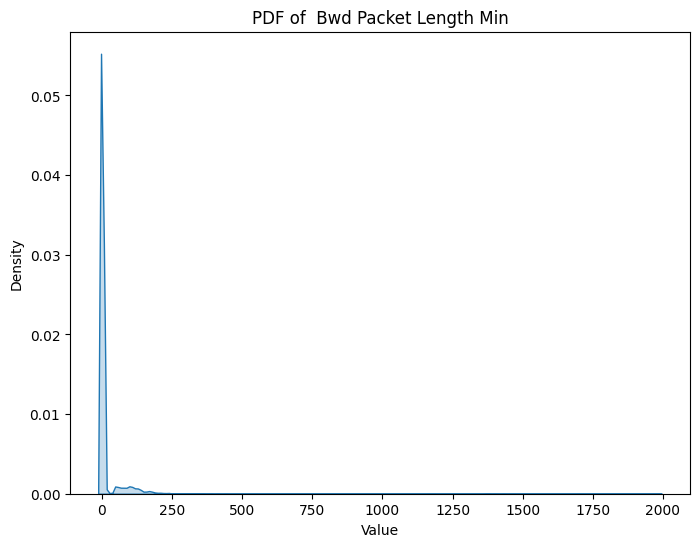

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


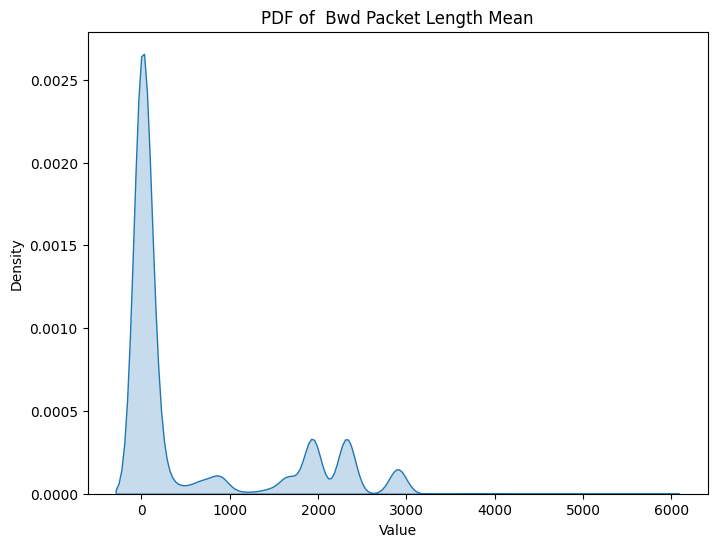

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


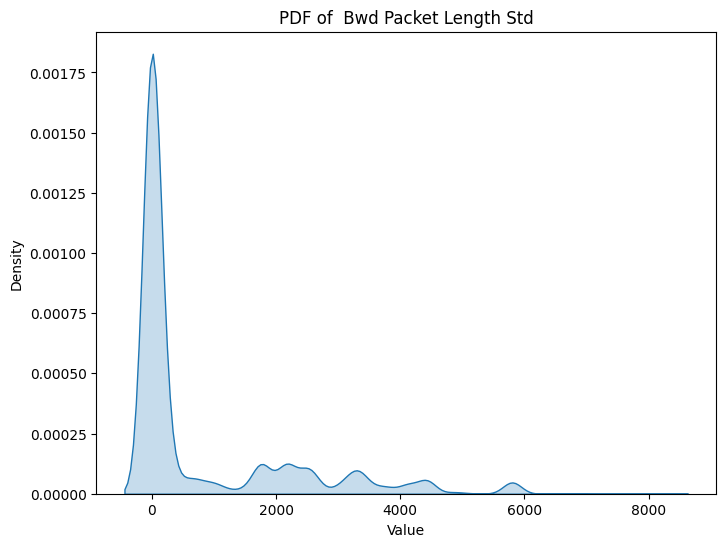

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


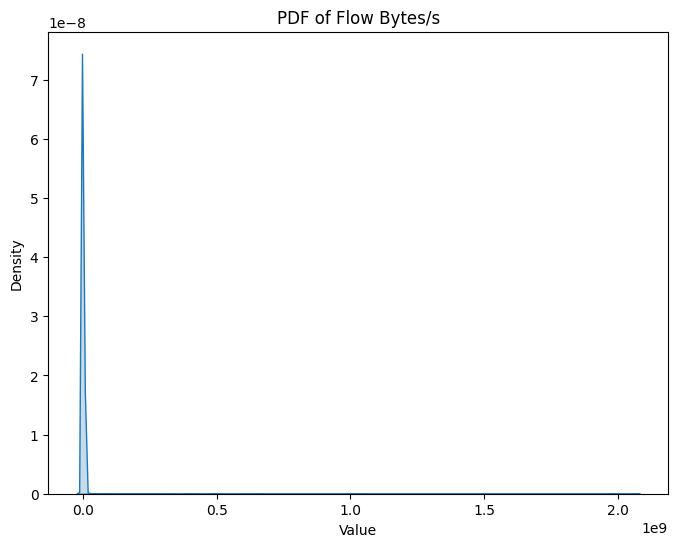

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


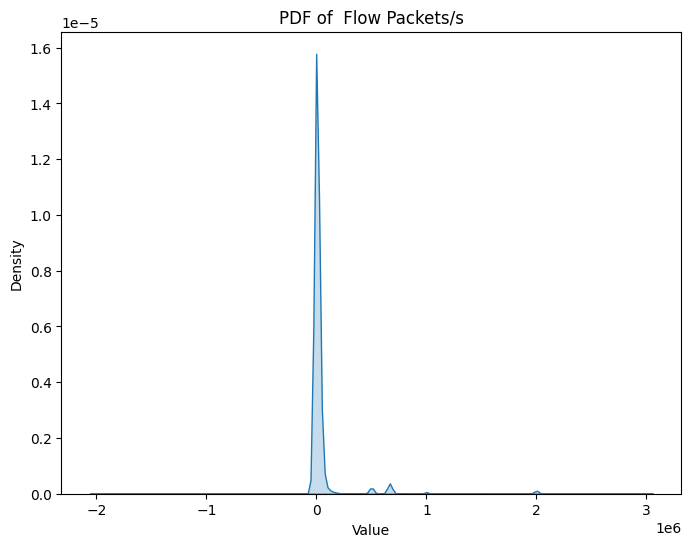

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


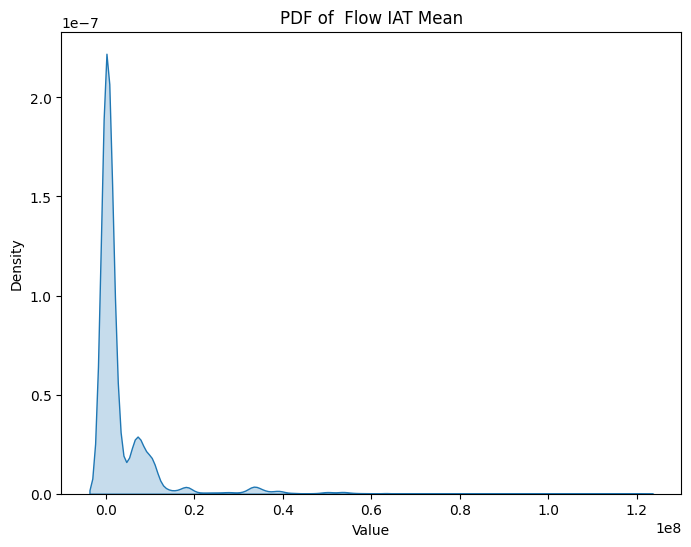

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


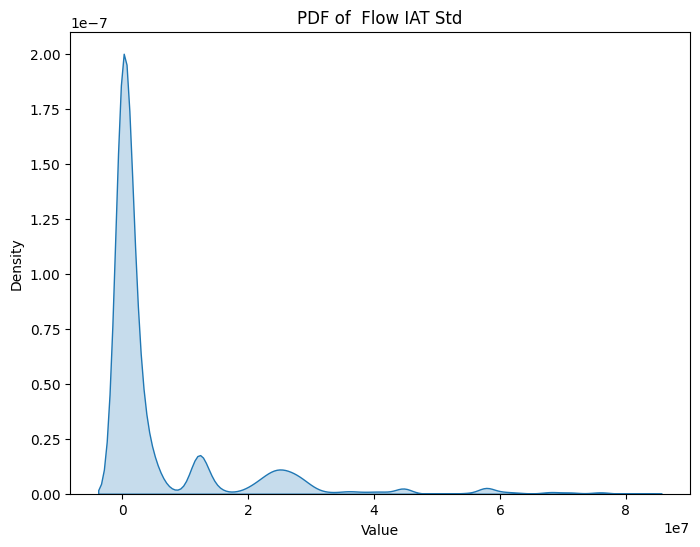

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


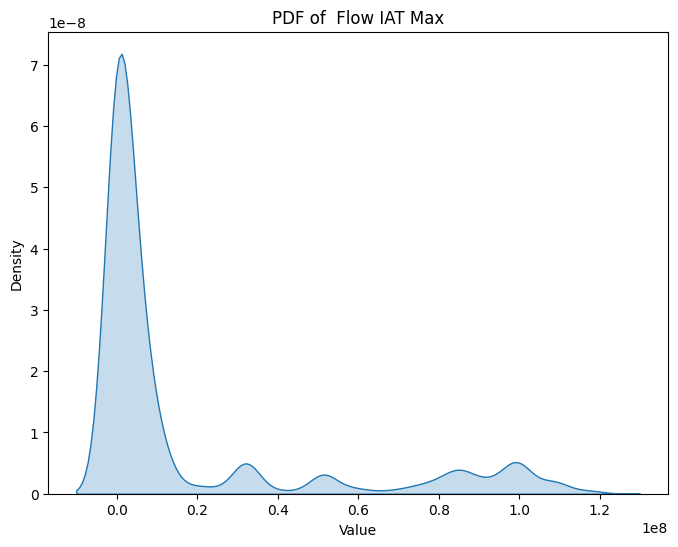

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


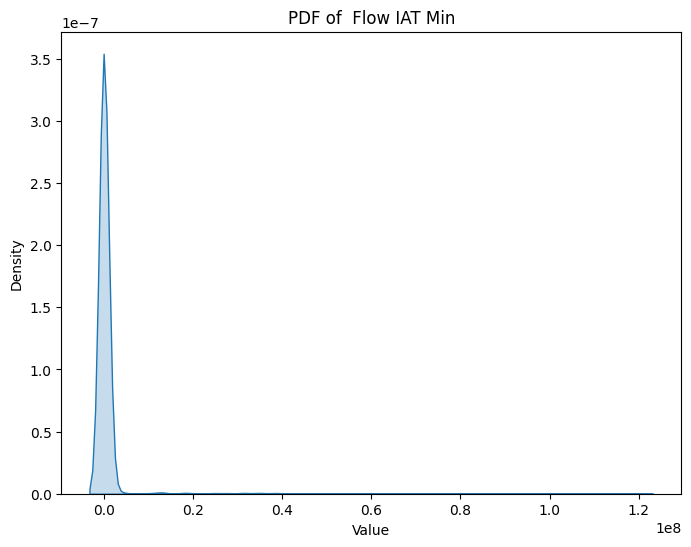

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


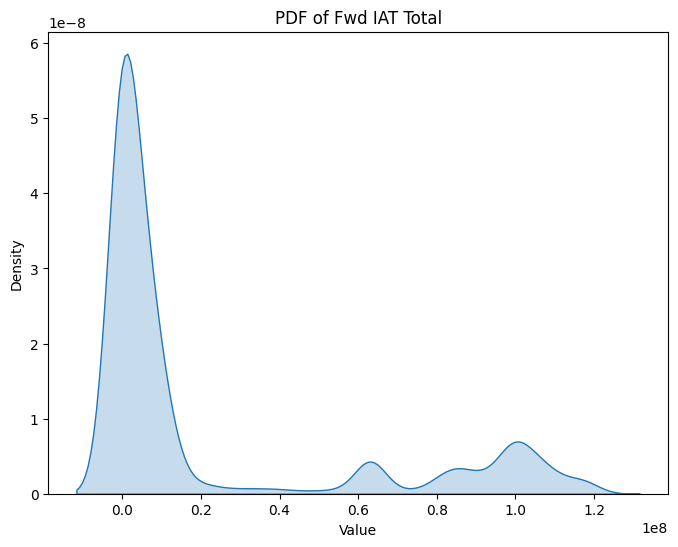

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


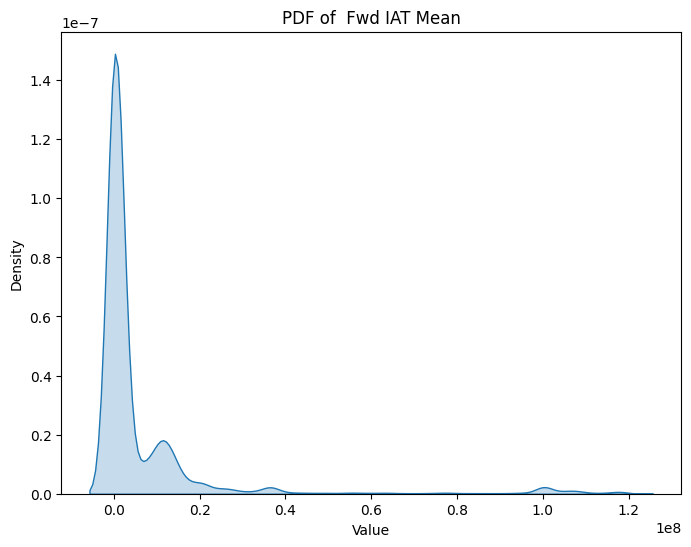

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


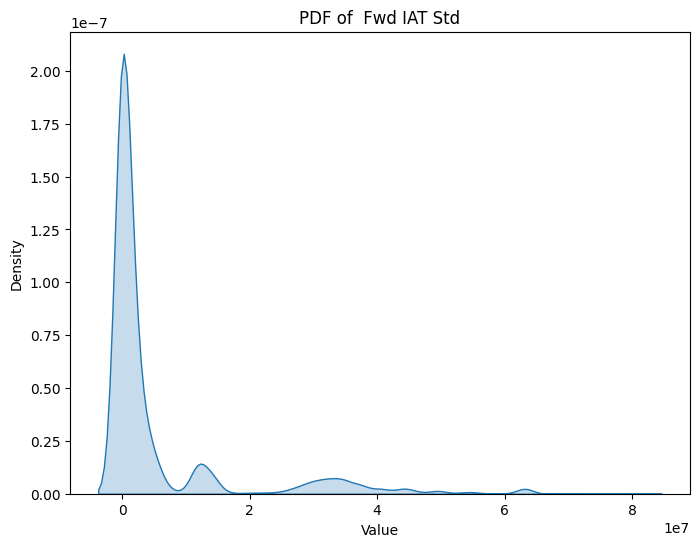

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


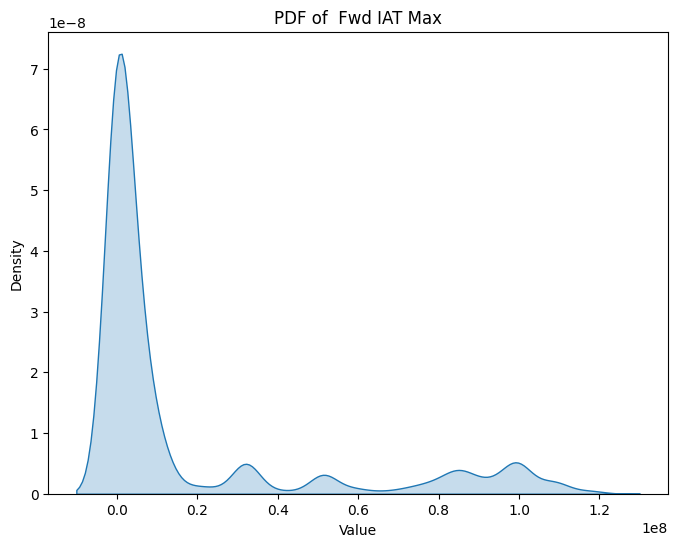

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


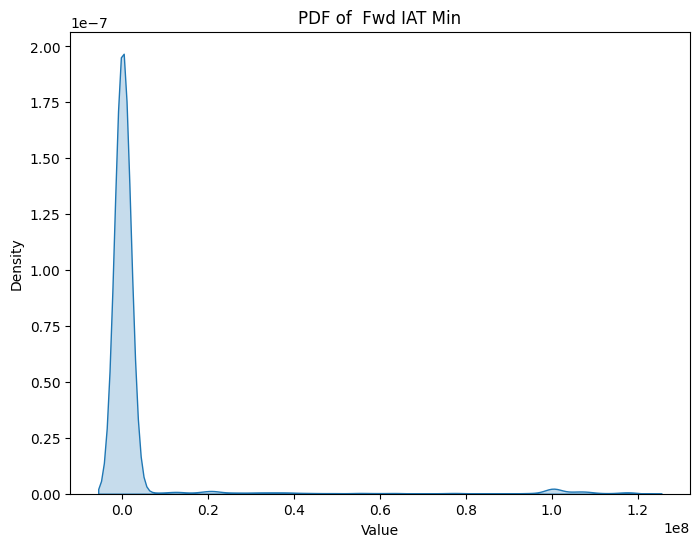

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


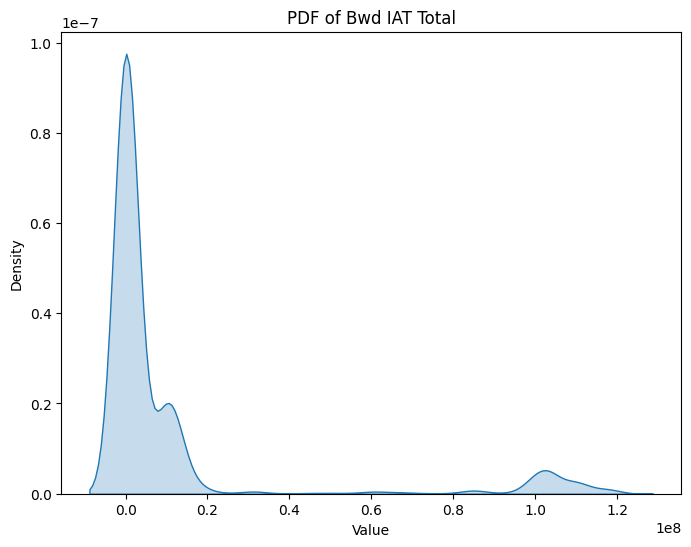

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


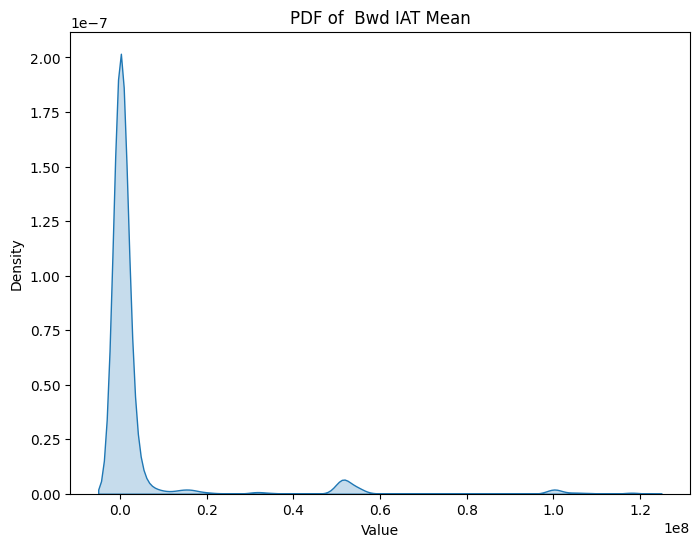

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


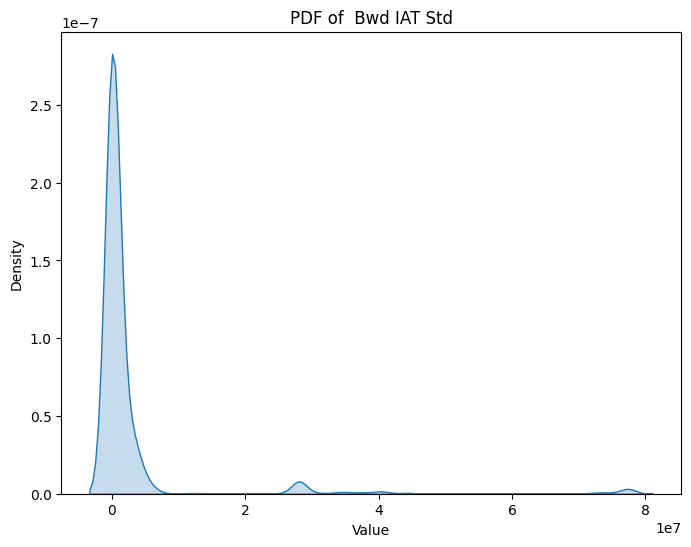

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


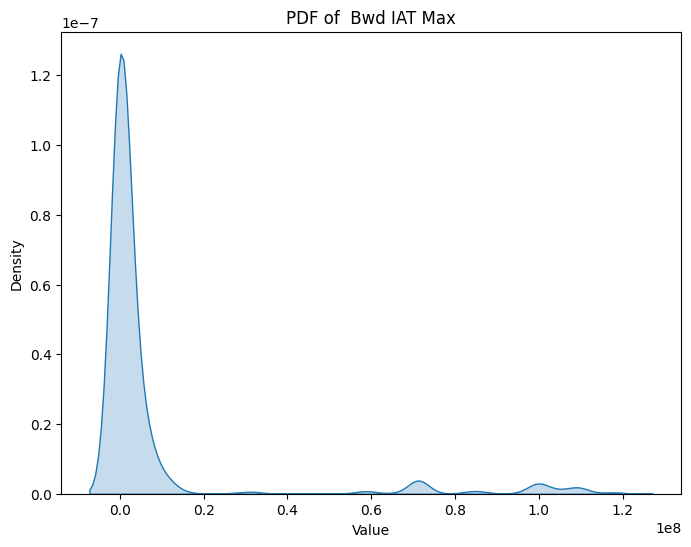

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


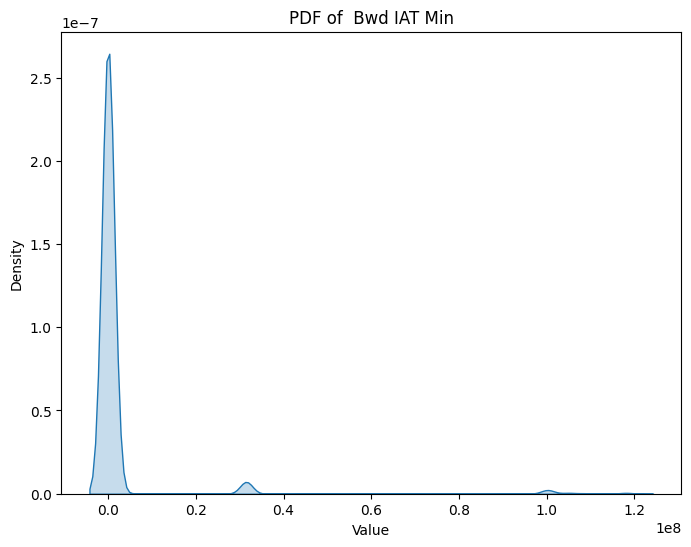

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


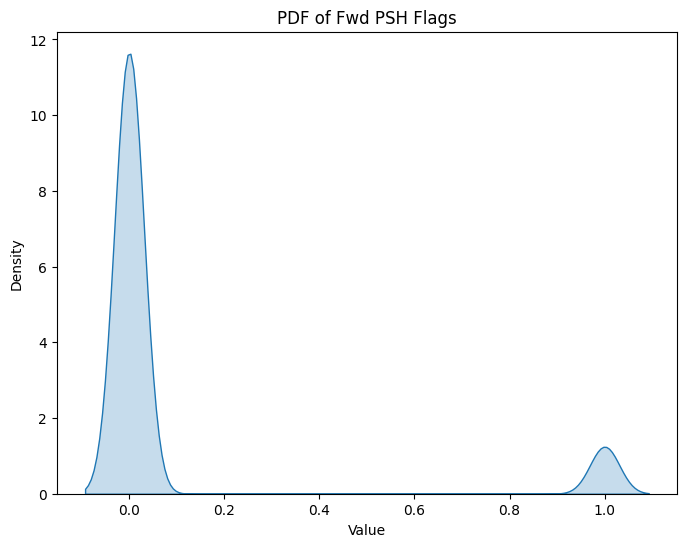

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


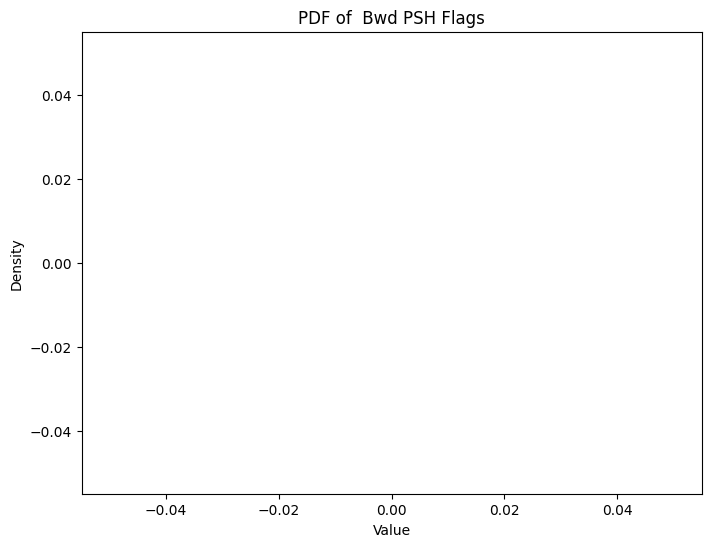

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


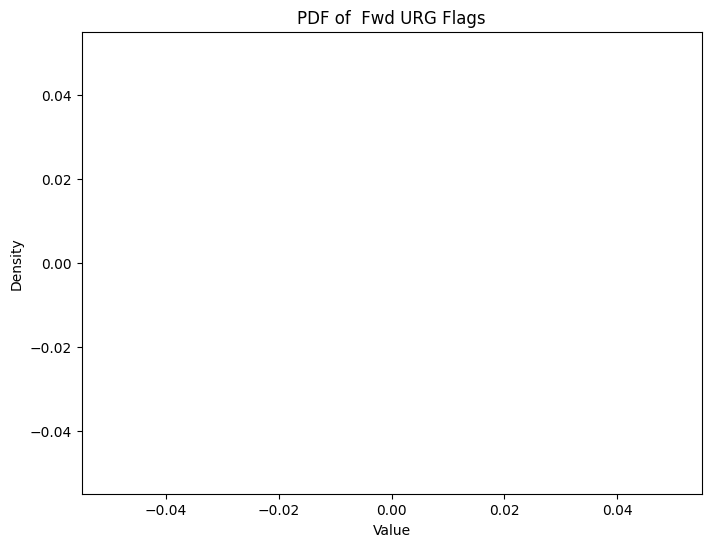

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


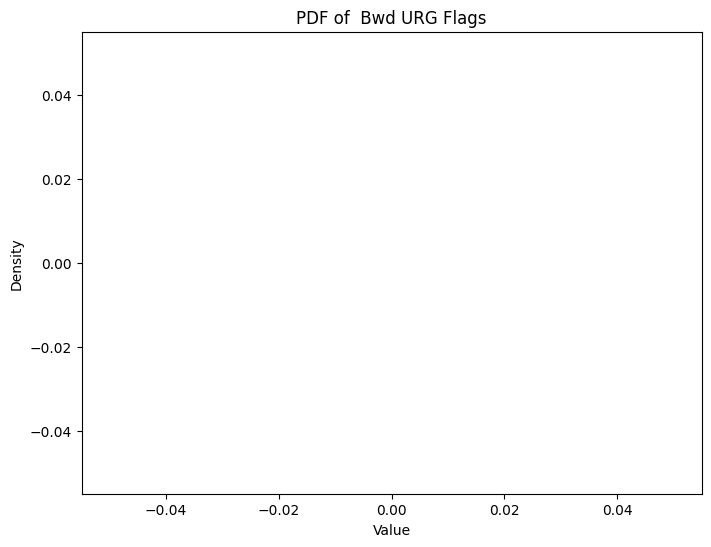

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


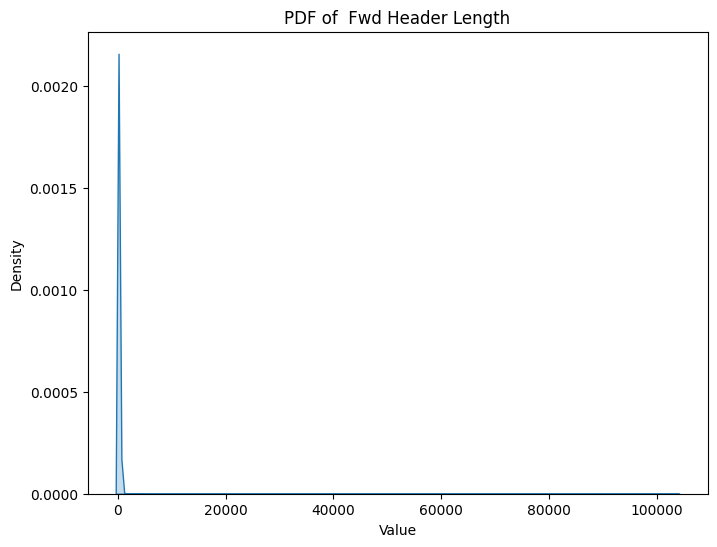

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


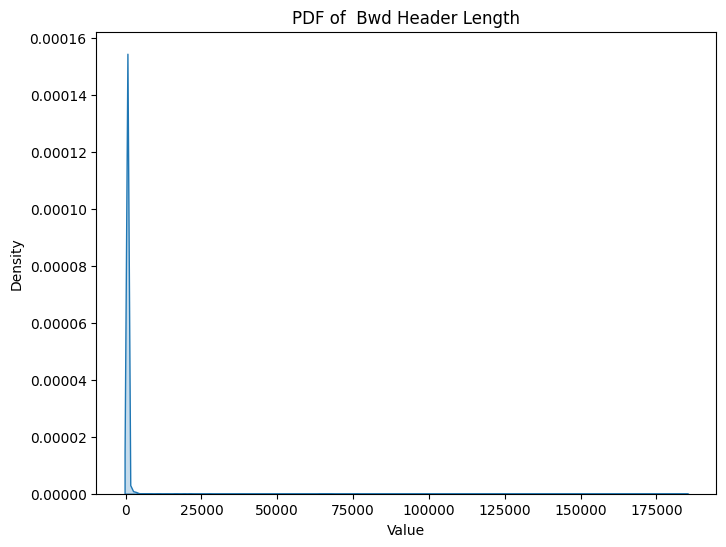

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


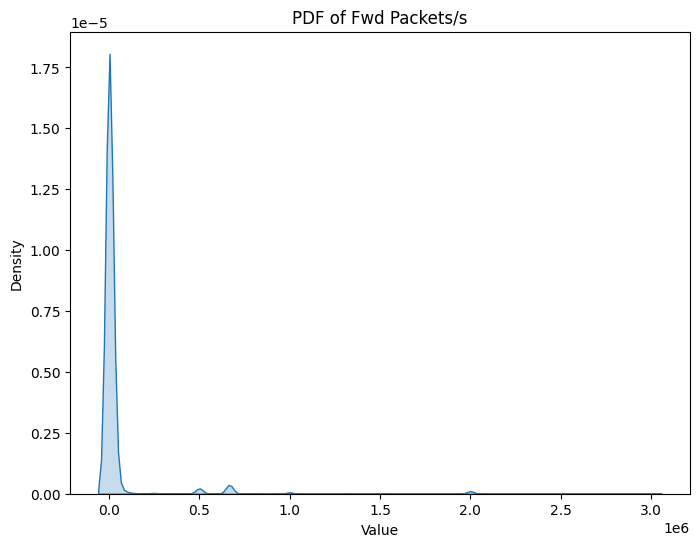

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


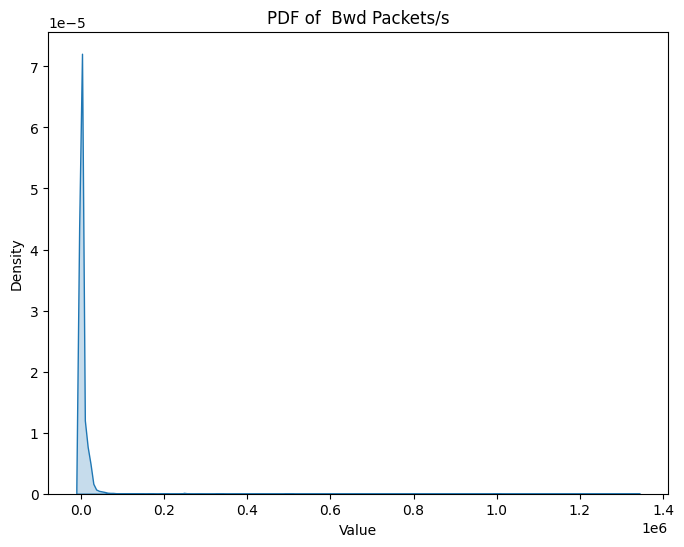

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


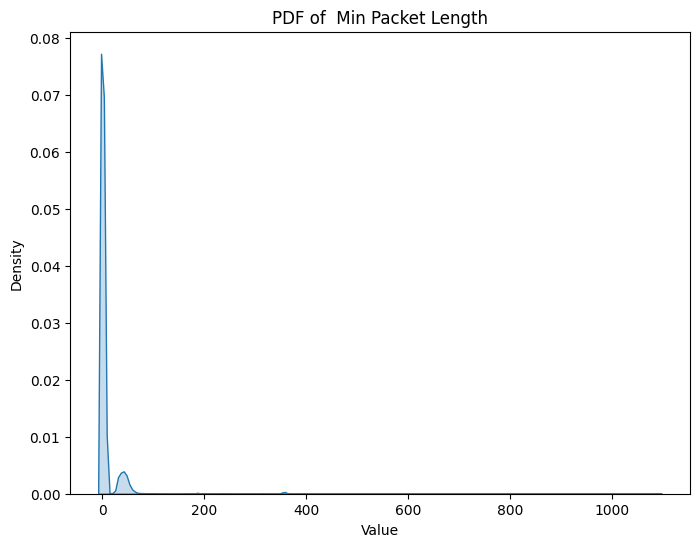

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


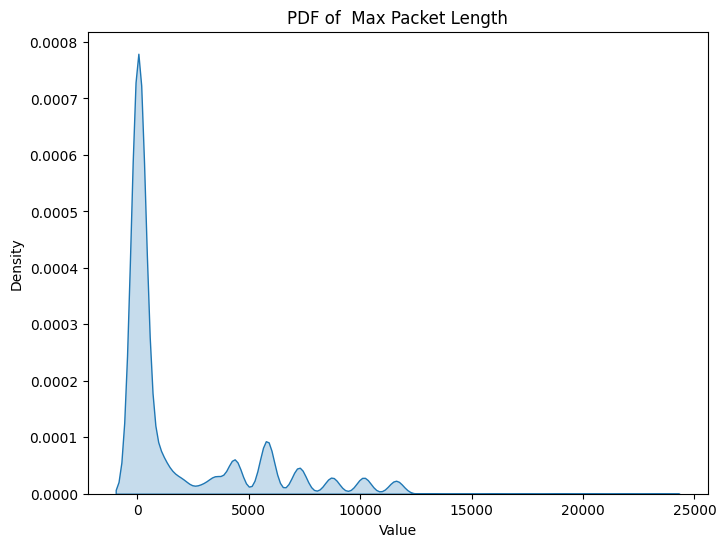

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


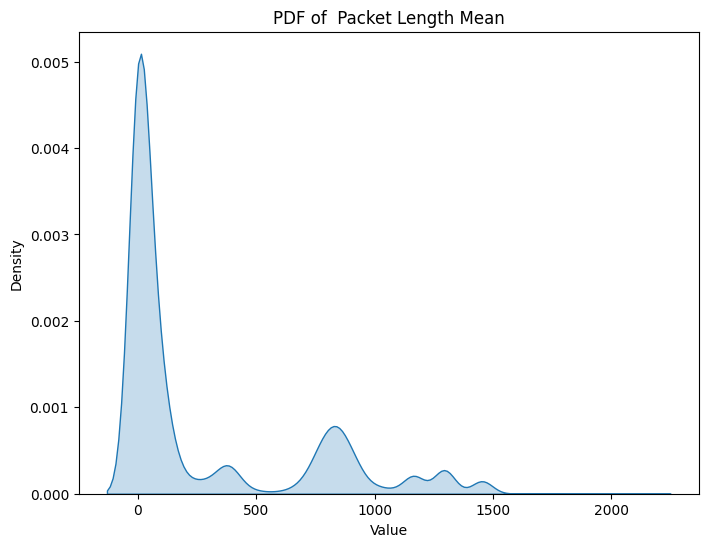

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


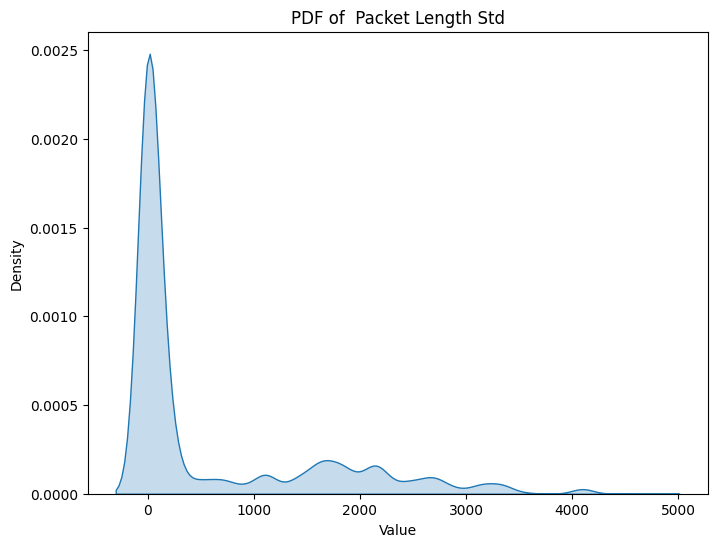

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


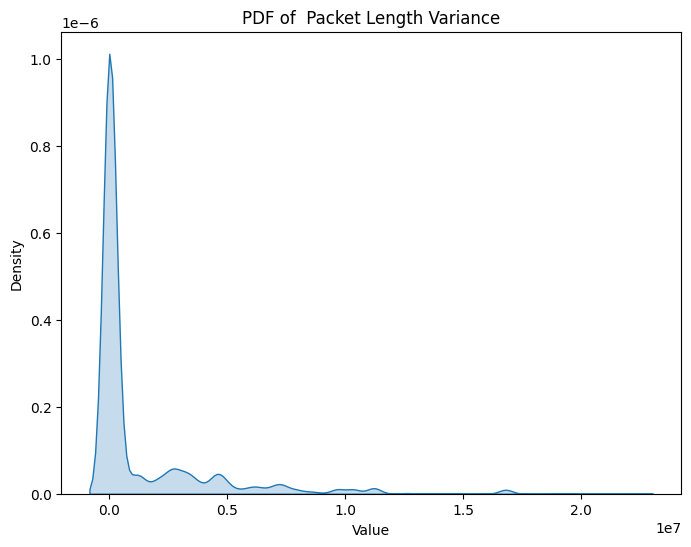

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


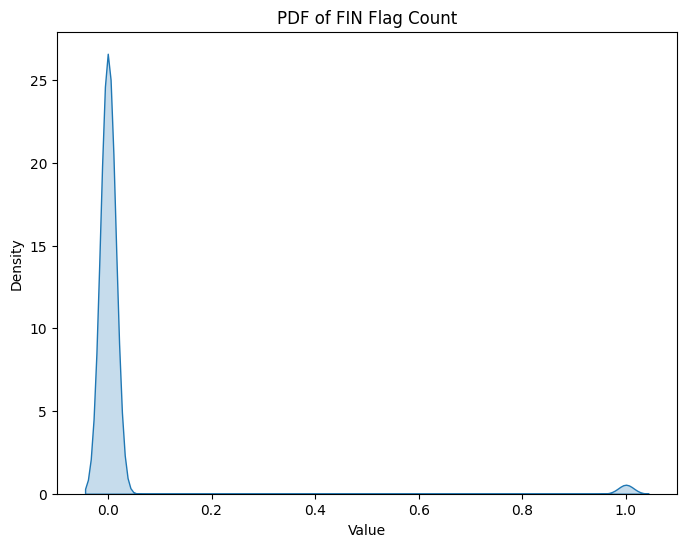

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


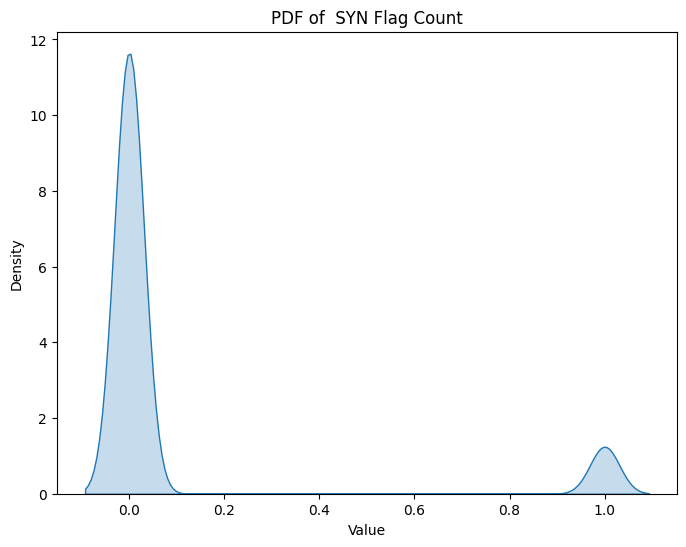

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


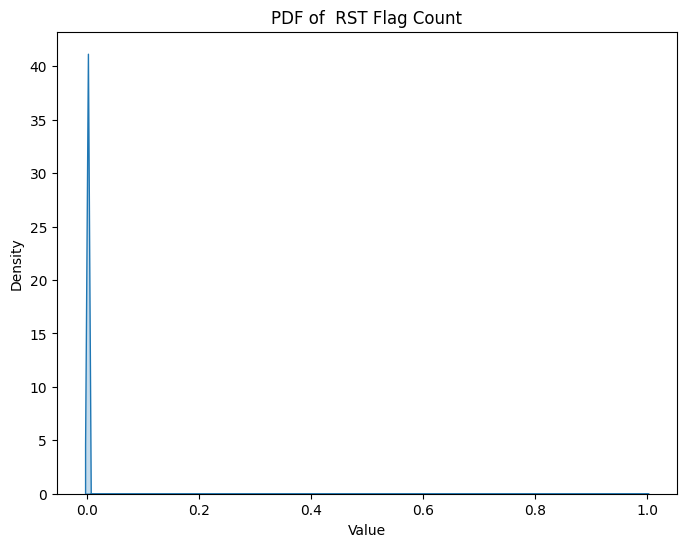

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


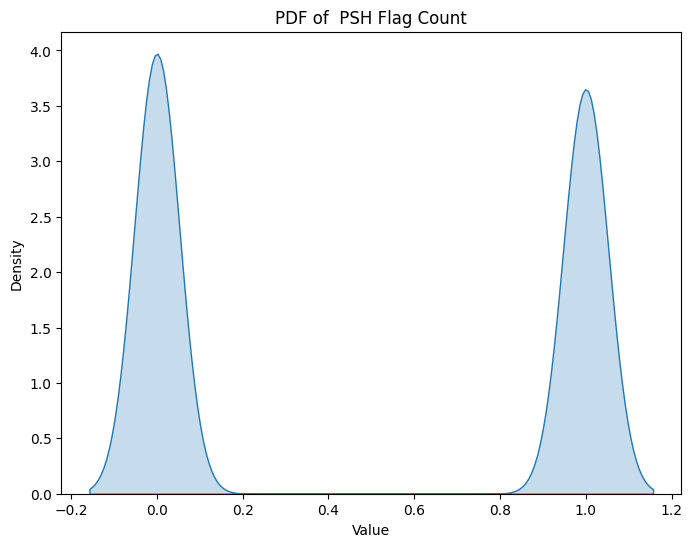

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


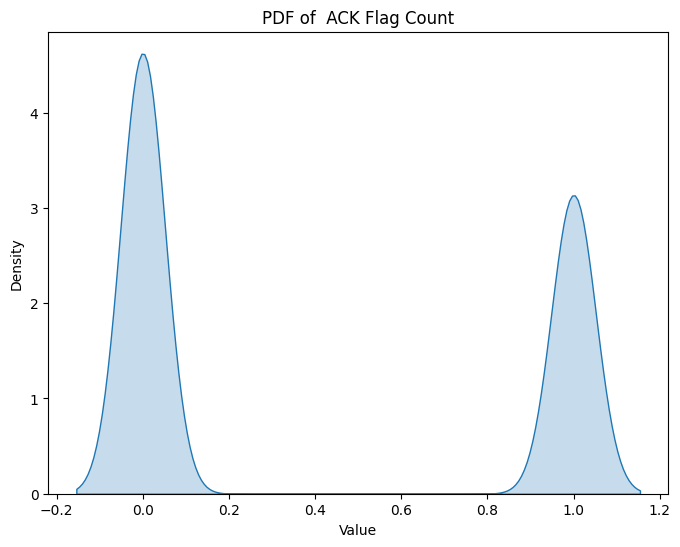

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


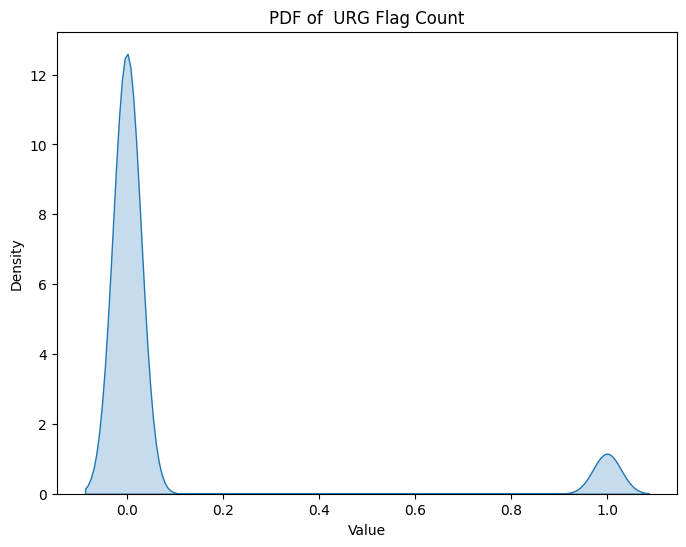

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


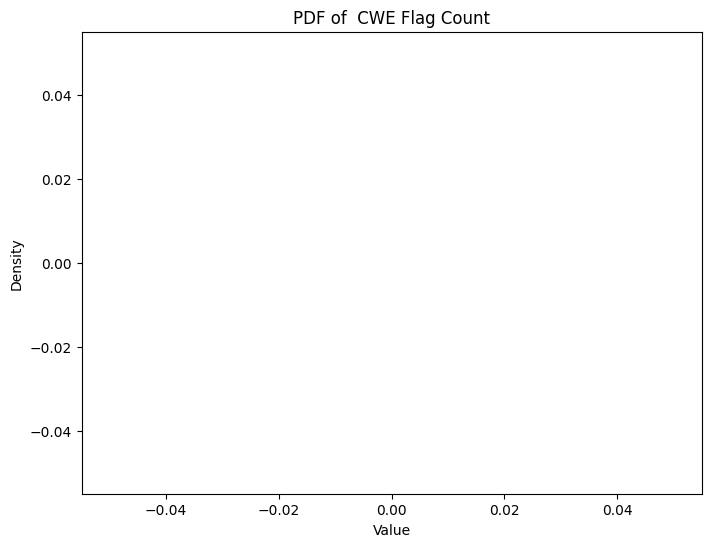

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


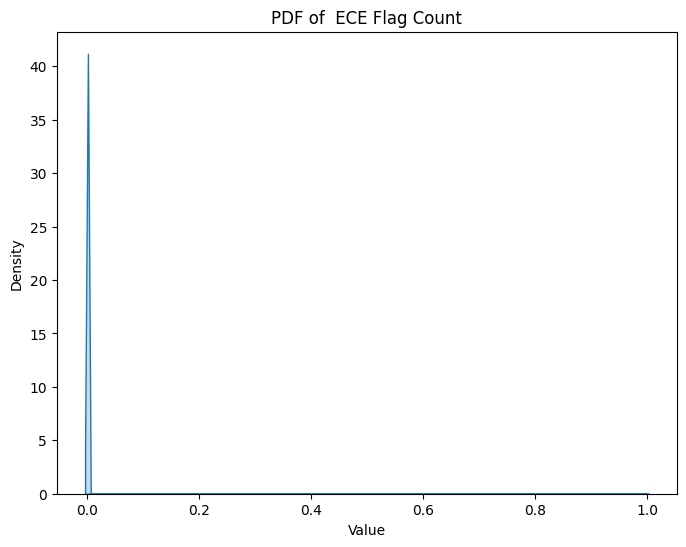

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


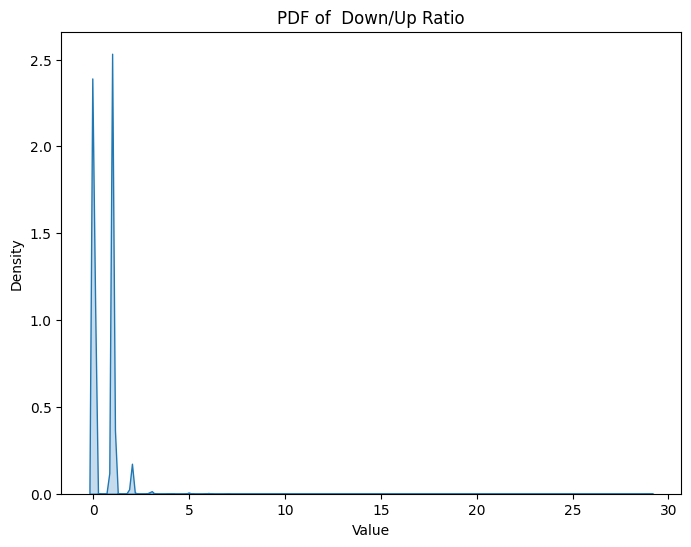

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


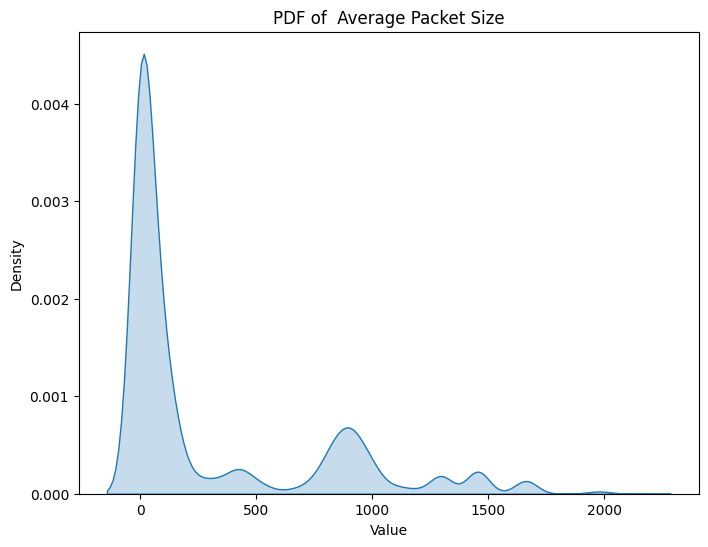

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


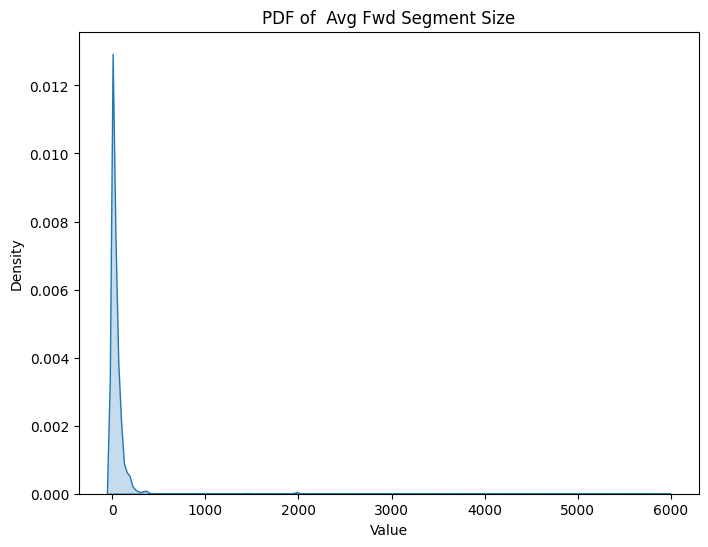

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


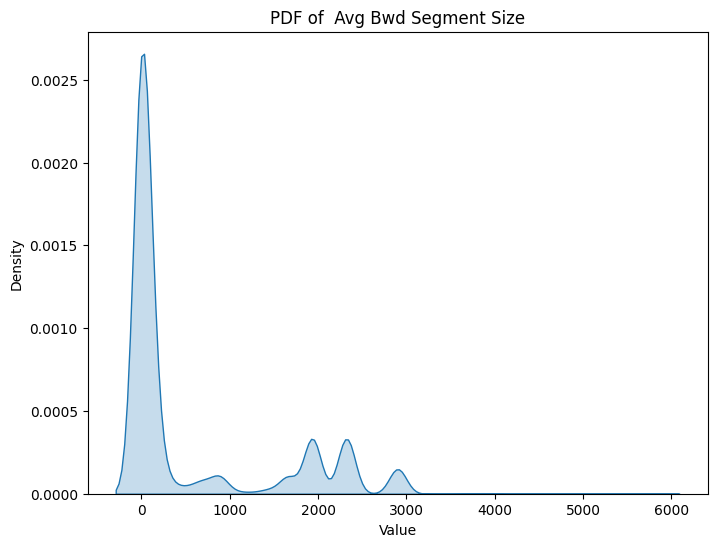

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


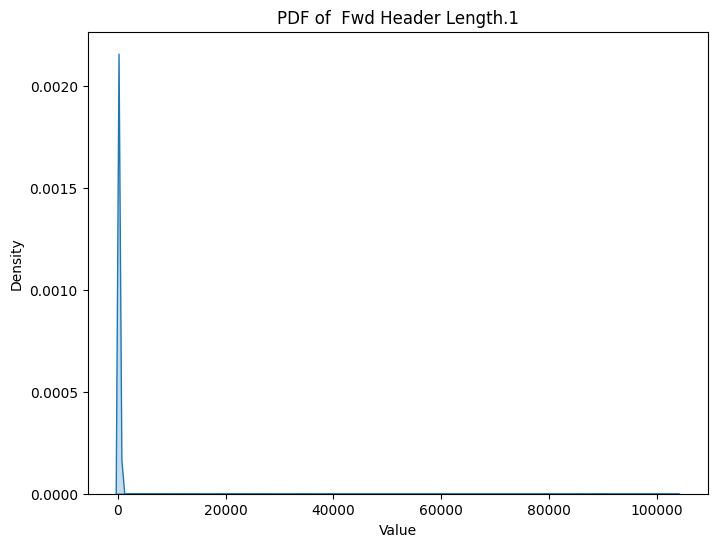

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


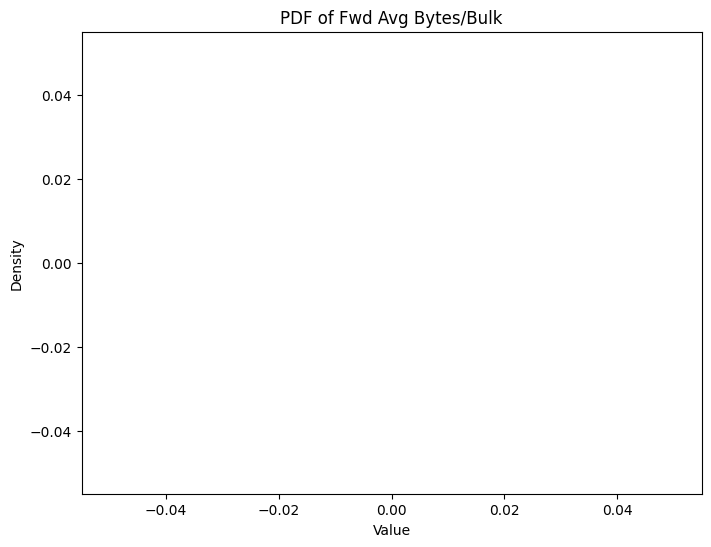

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


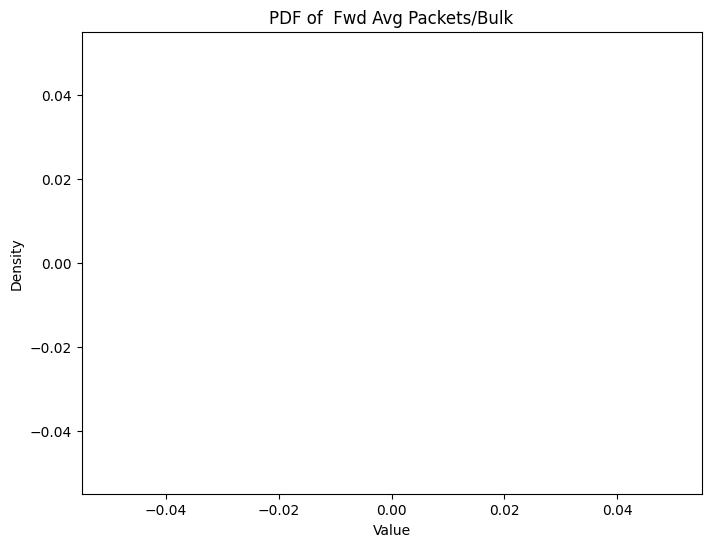

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


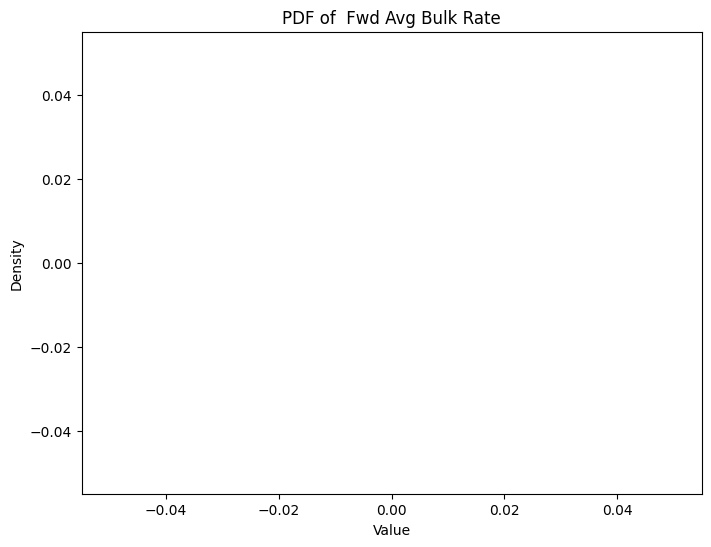

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


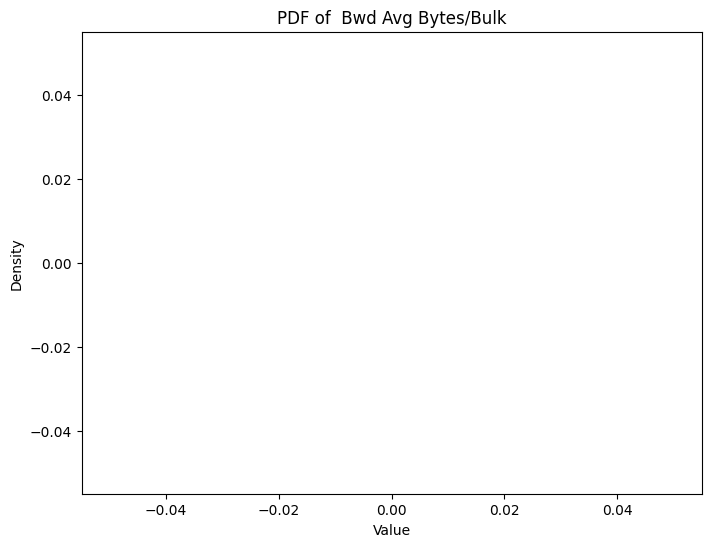

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


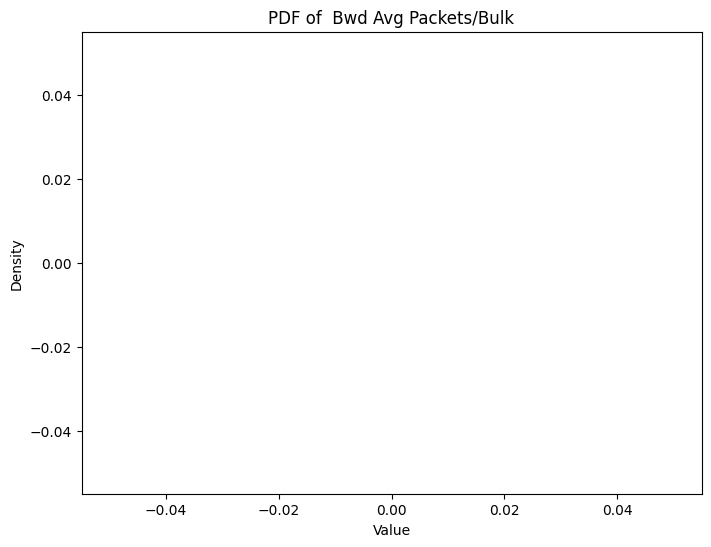

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
<ipython-input-172-c5408edbd05f>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


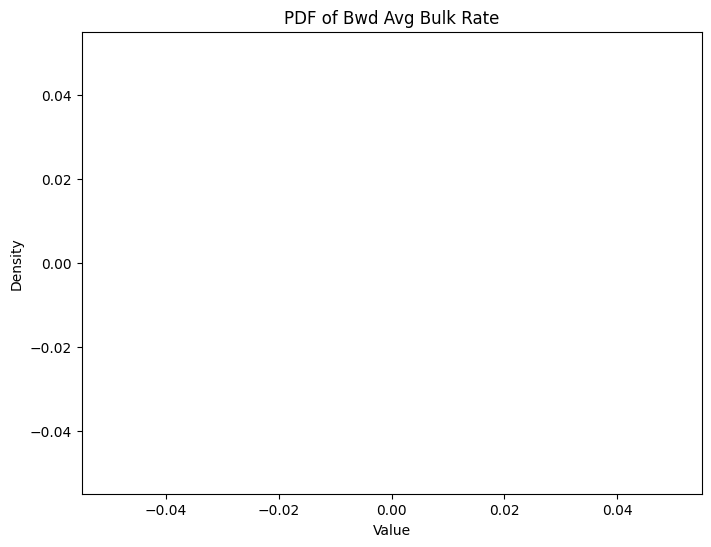

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


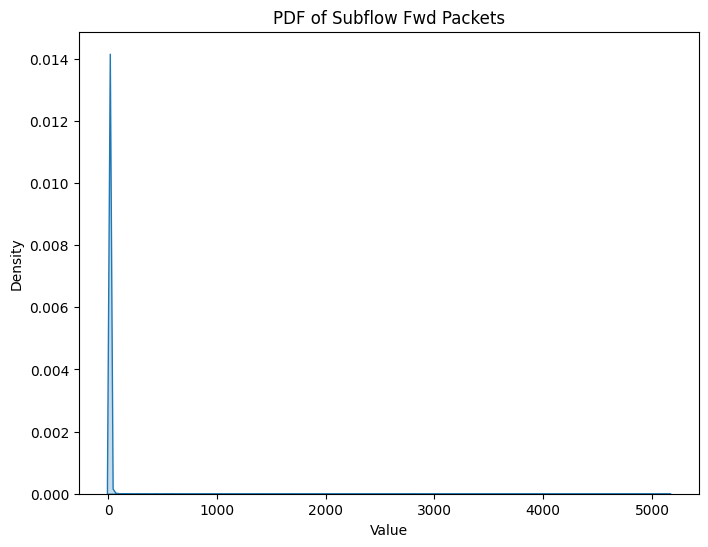

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


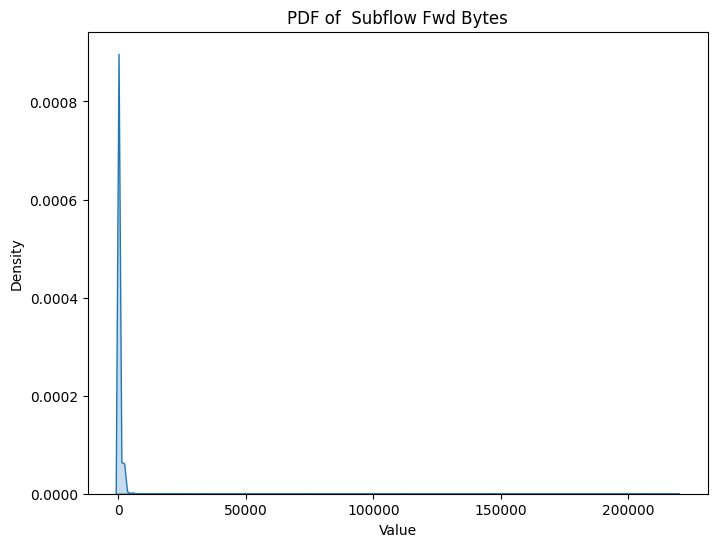

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


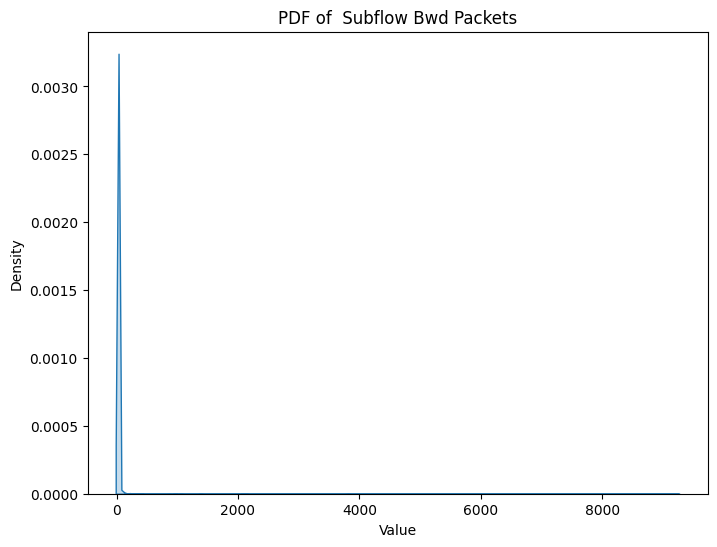

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


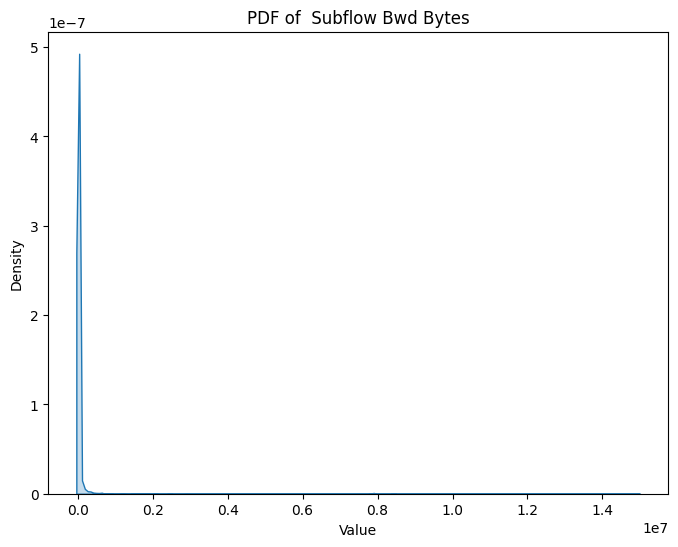

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


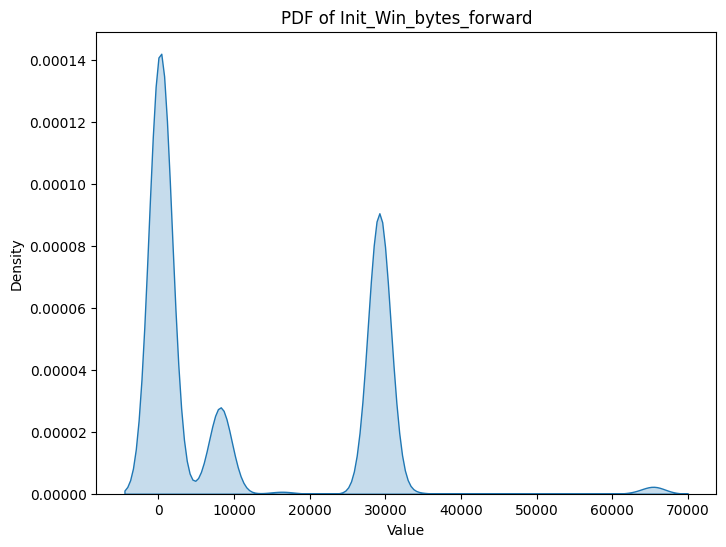

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


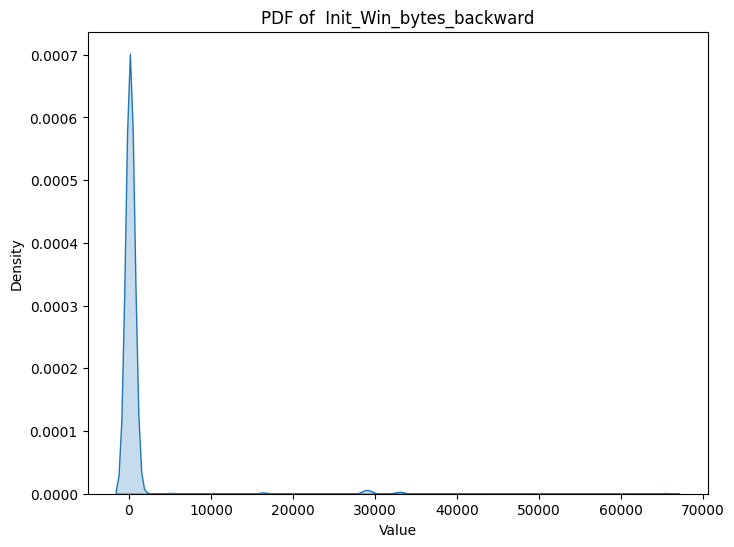

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


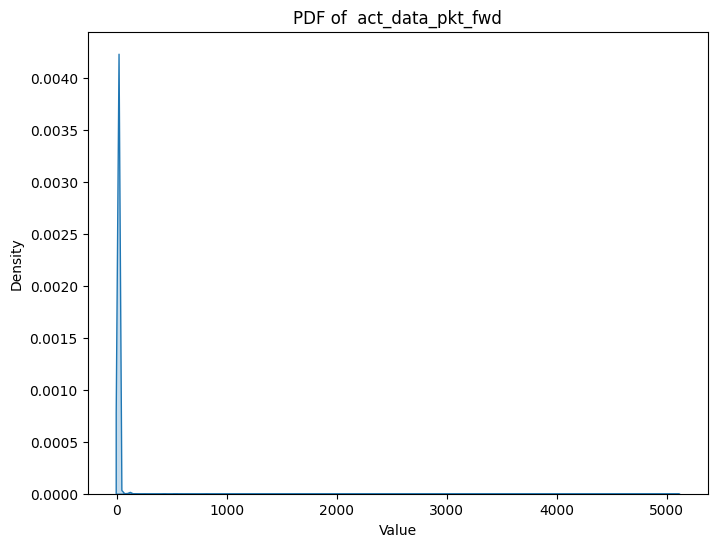

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


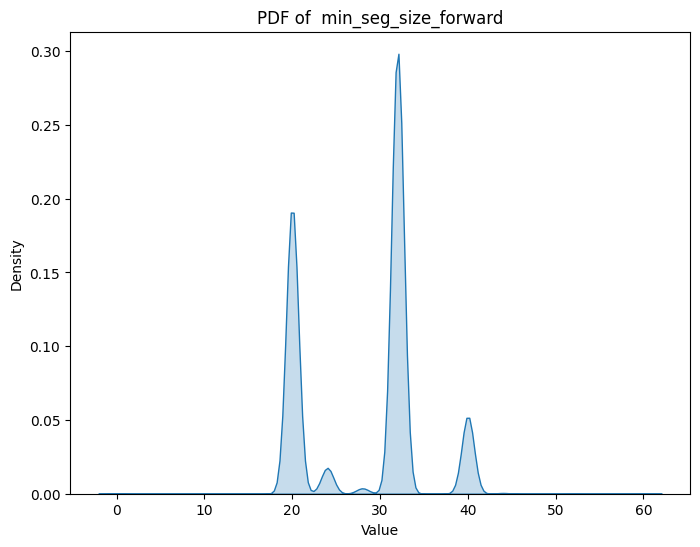

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


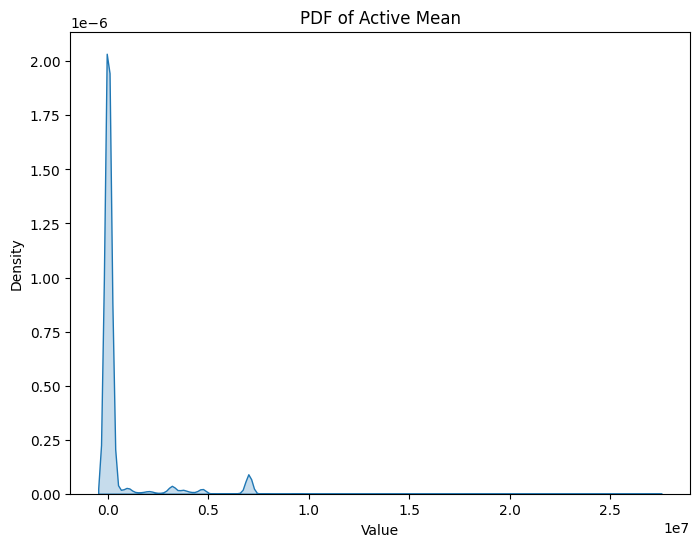

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


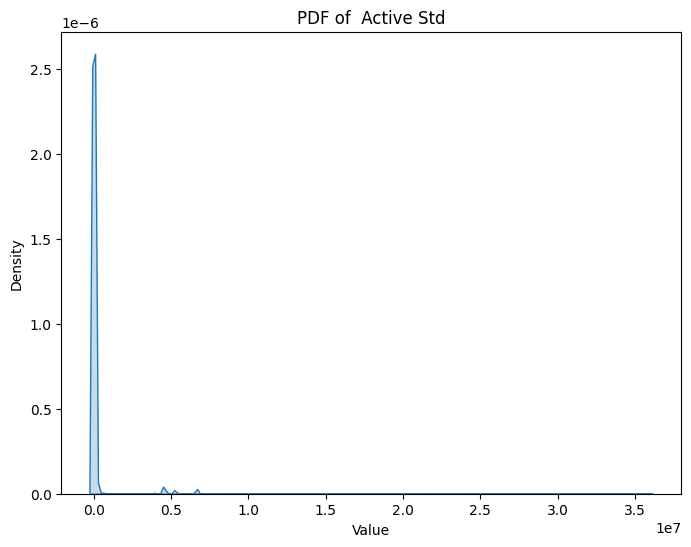

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


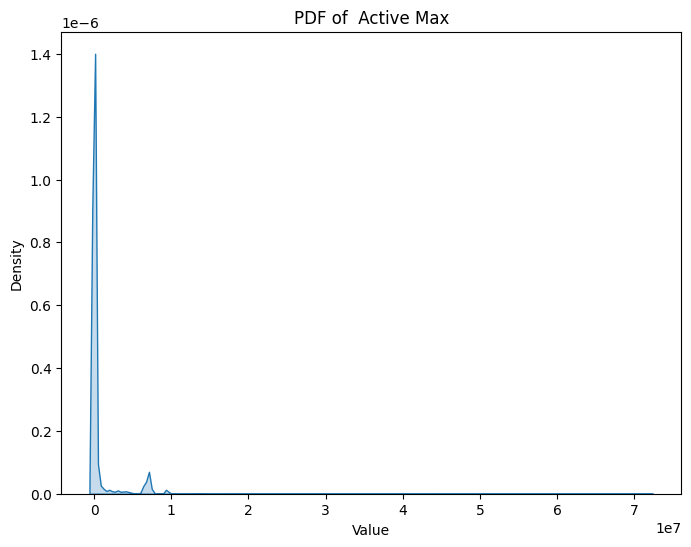

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


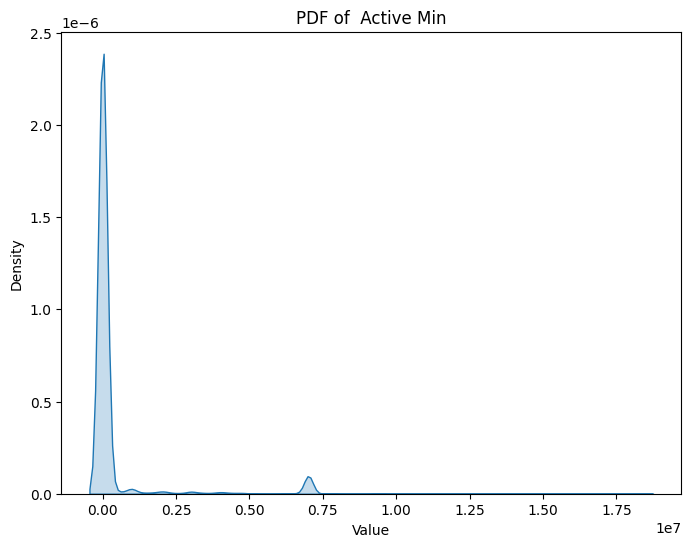

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


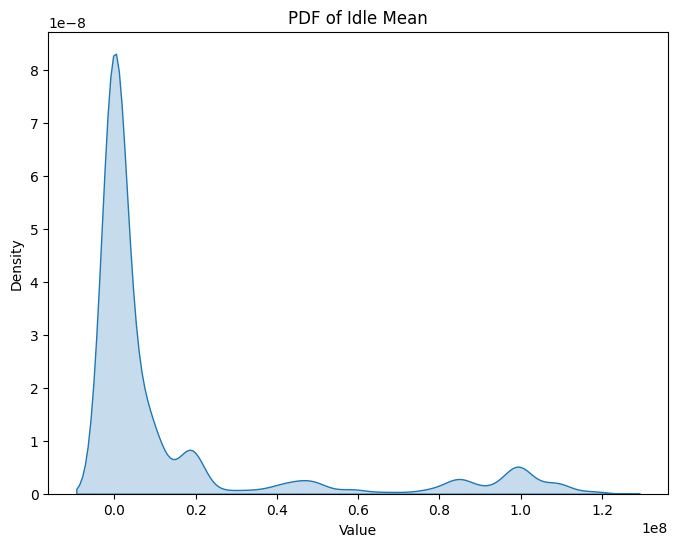

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


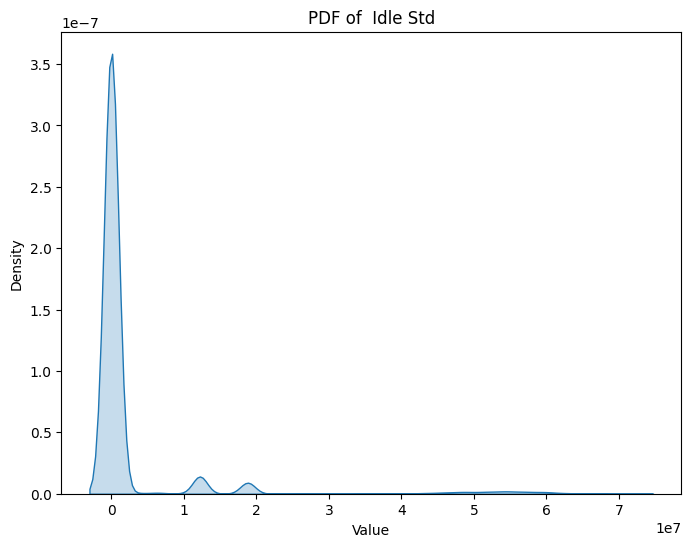

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


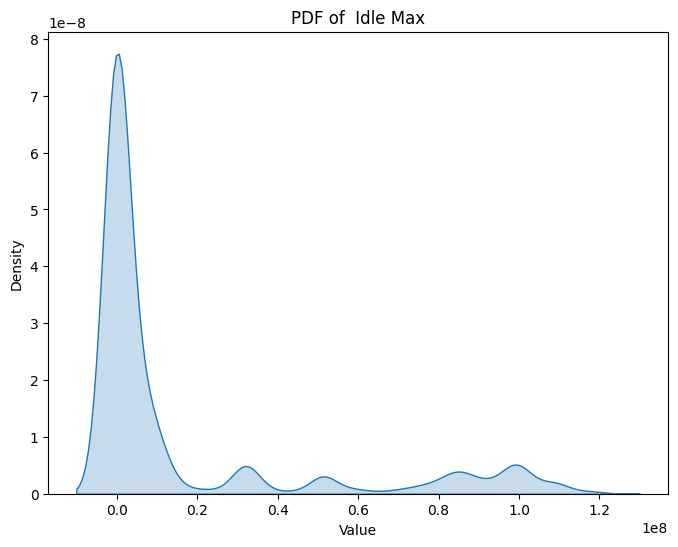

<ipython-input-172-c5408edbd05f>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF


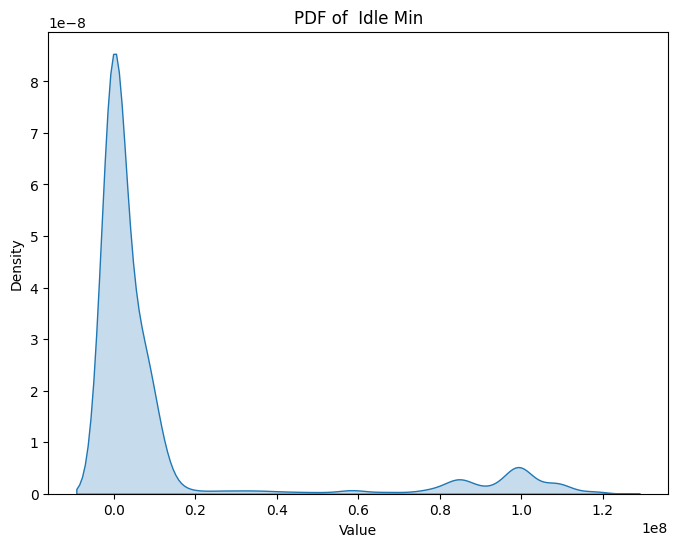

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_pdfs(df):
    for col in df.columns:
        # Check if the column is numeric before plotting
        if pd.api.types.is_numeric_dtype(df[col]):
            plt.figure(figsize=(8, 6))
            sns.kdeplot(df[col], shade=True)  # Use kdeplot for PDF
            plt.xlabel('Value')
            plt.ylabel('Density')
            plt.title(f'PDF of {col}')
            plt.show()

plot_pdfs(df)

**Apply log transformation to PDF**

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


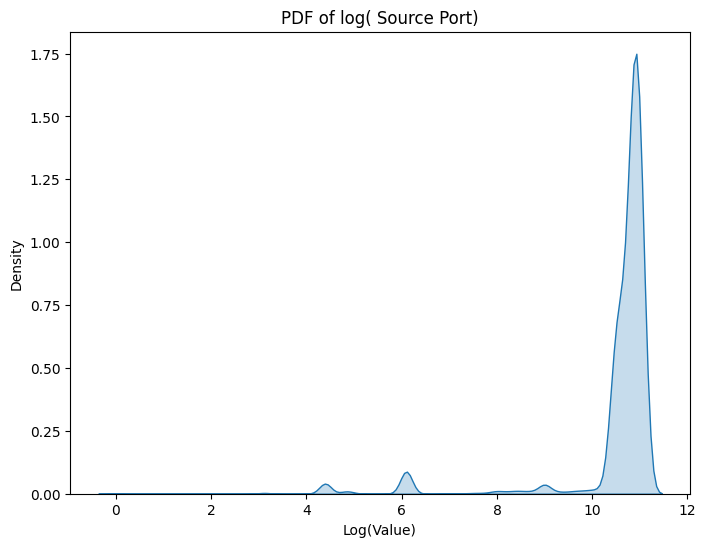

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


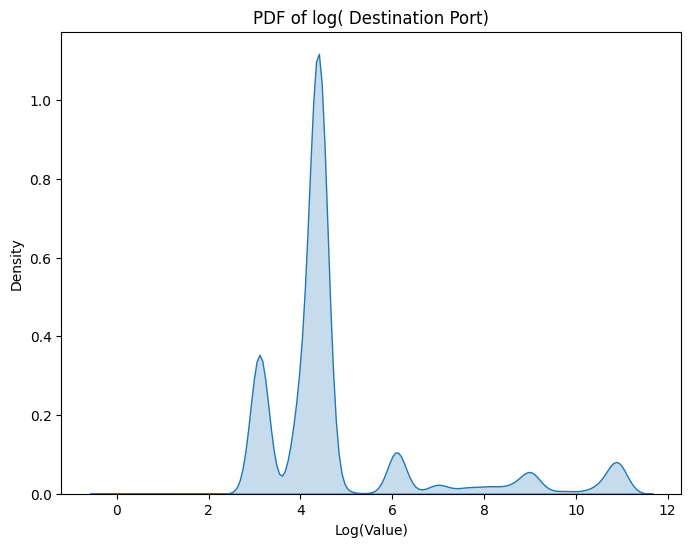

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


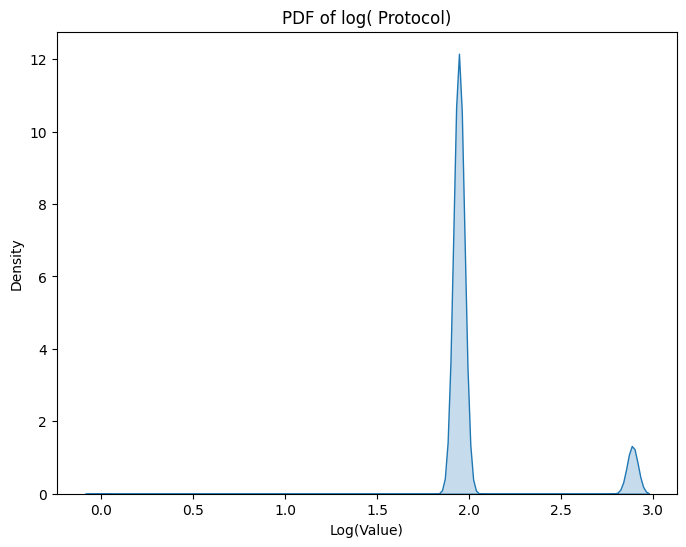

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


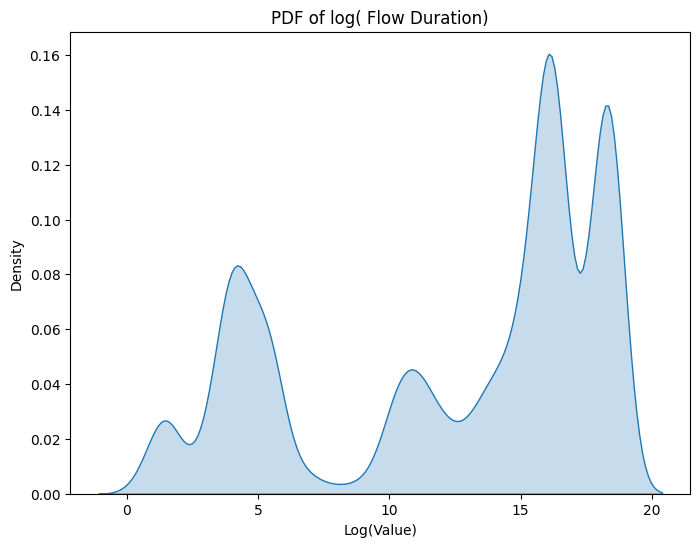

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


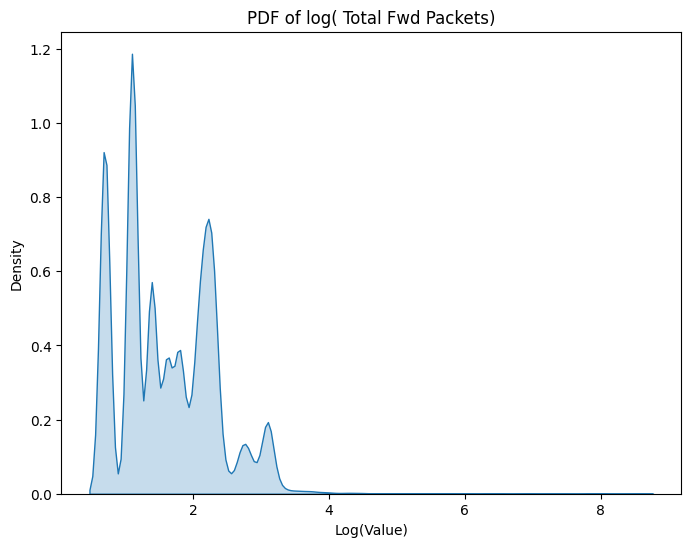

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


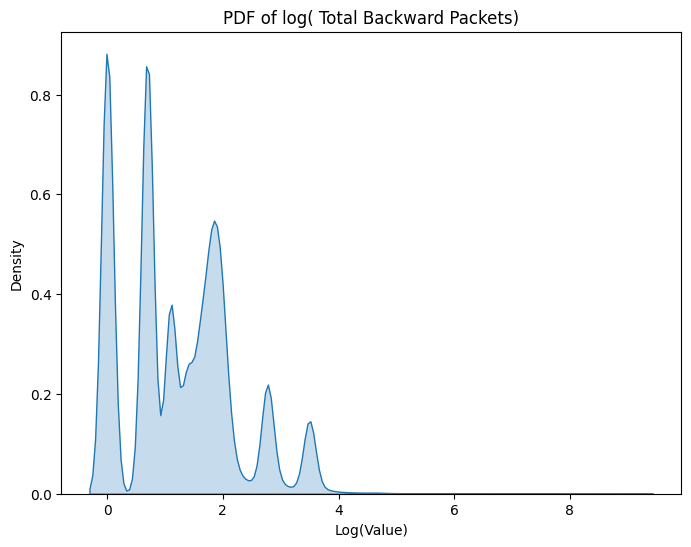

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


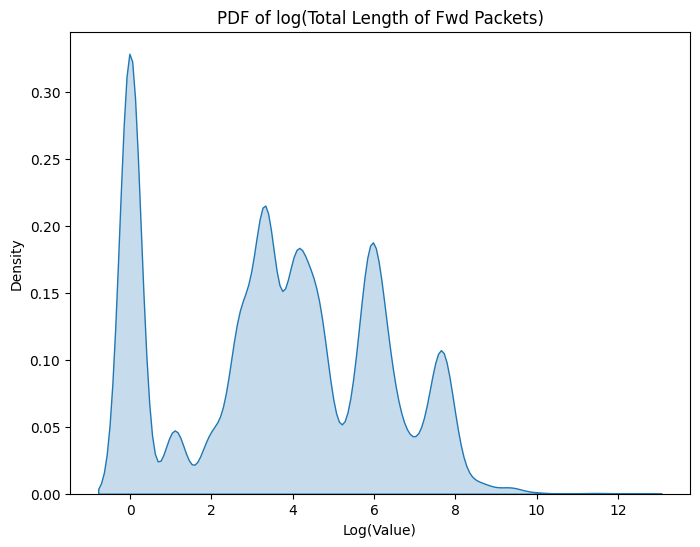

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


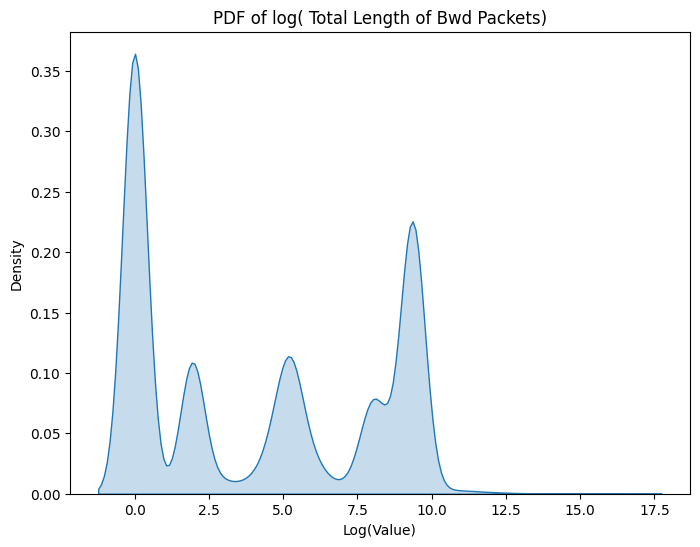

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


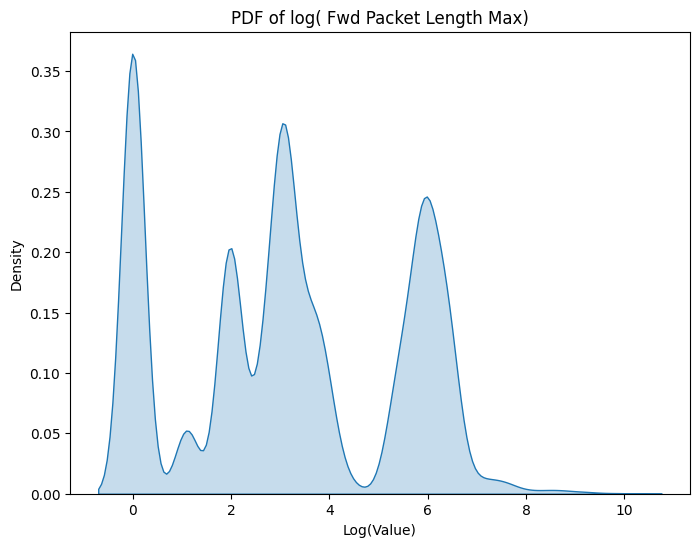

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


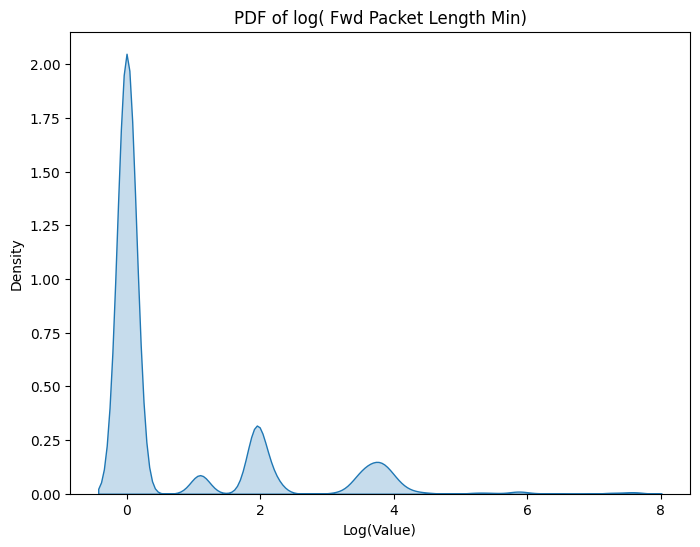

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


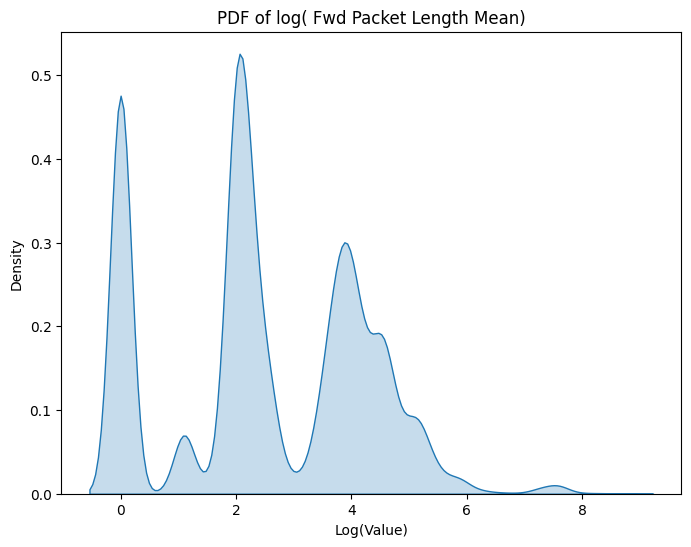

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


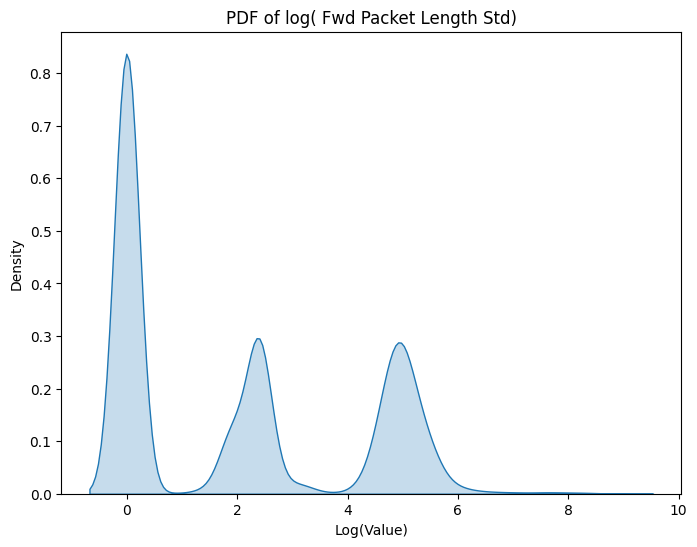

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


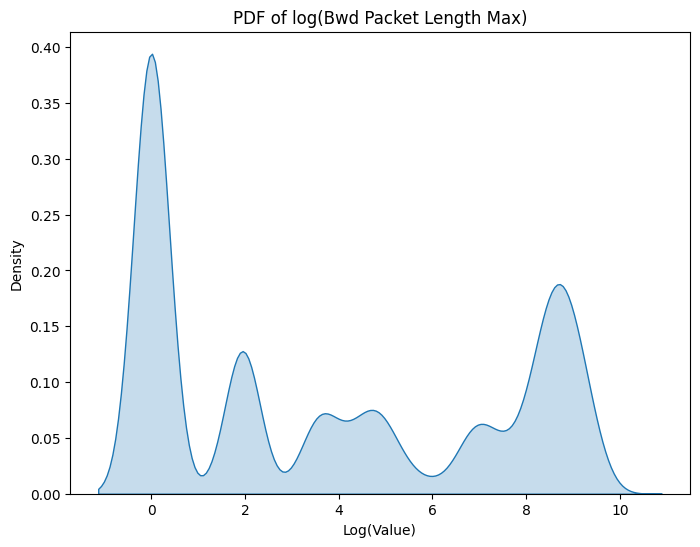

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


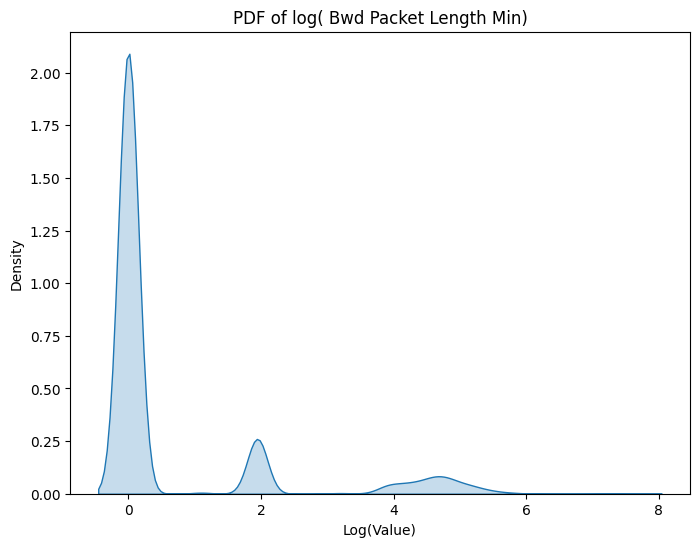

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


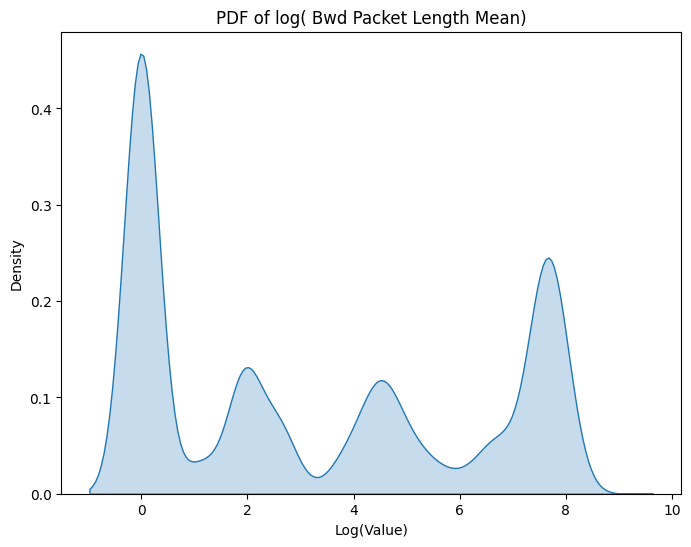

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


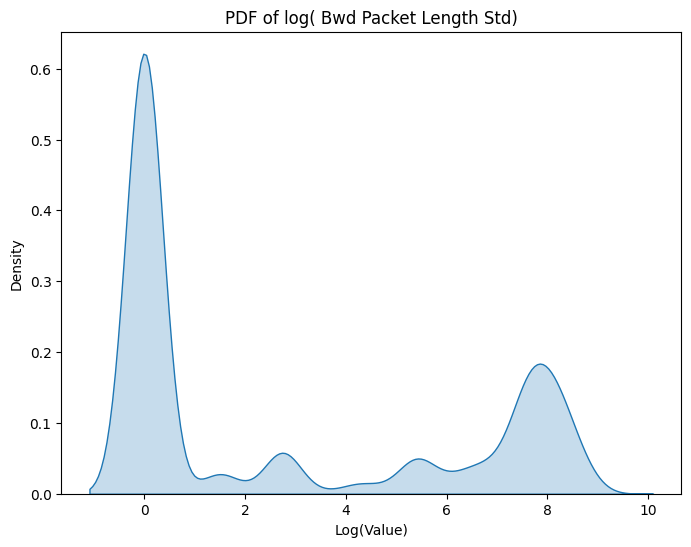

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


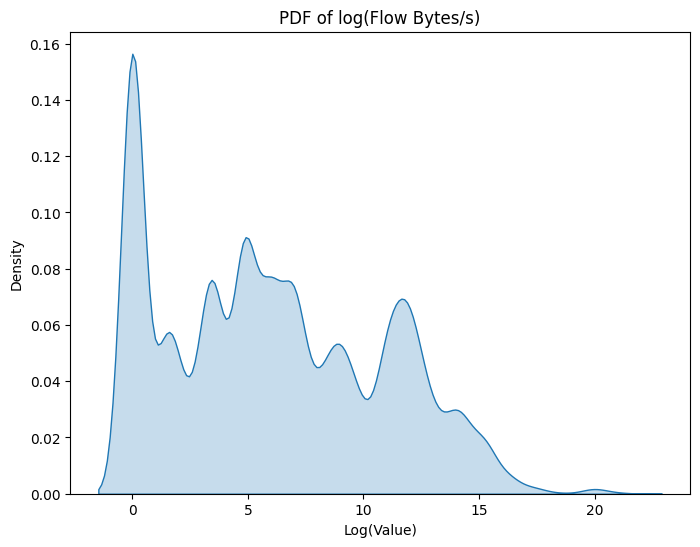

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


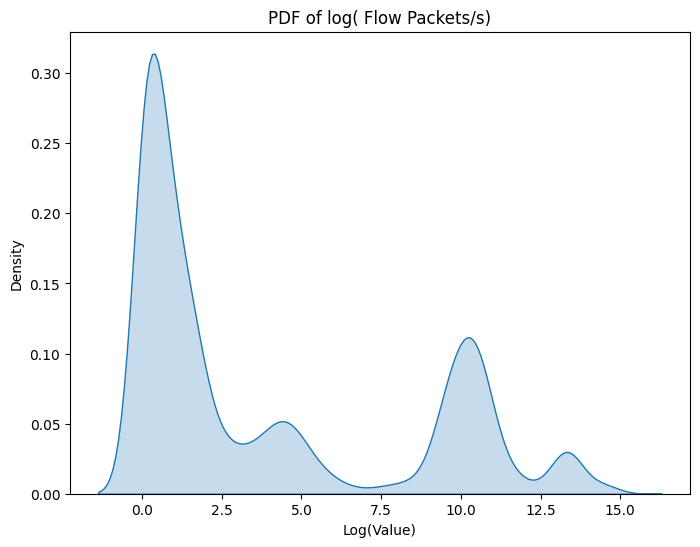

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


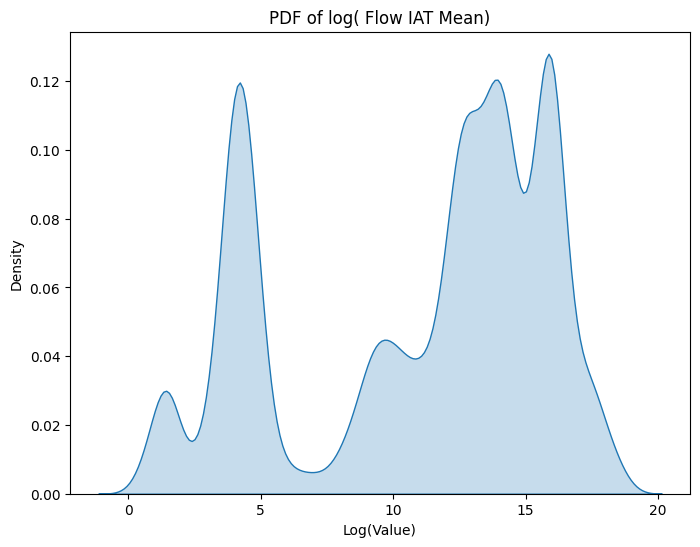

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


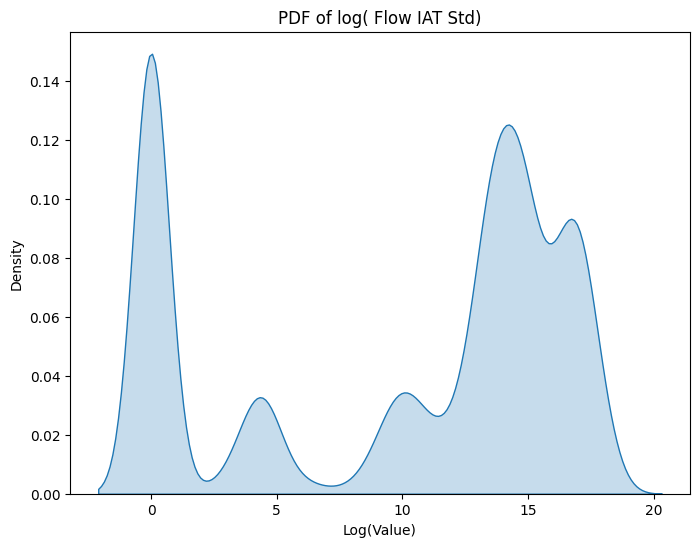

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


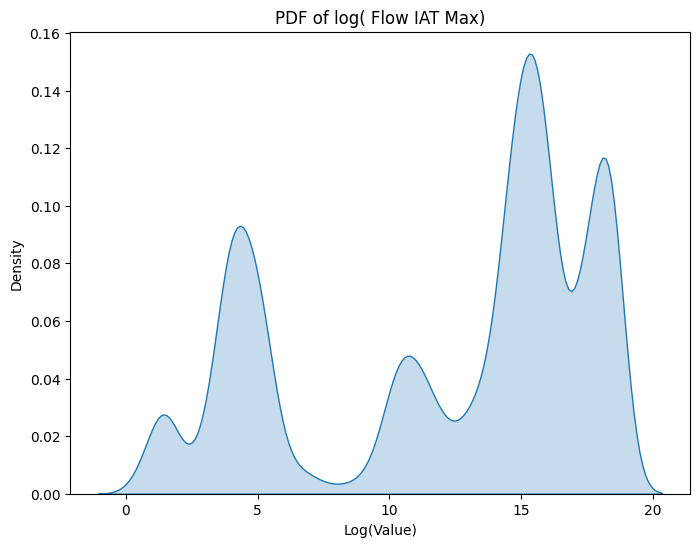

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


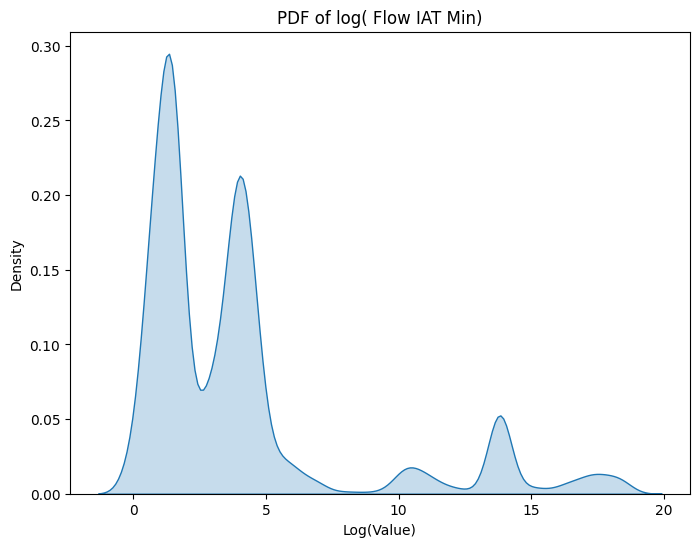

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


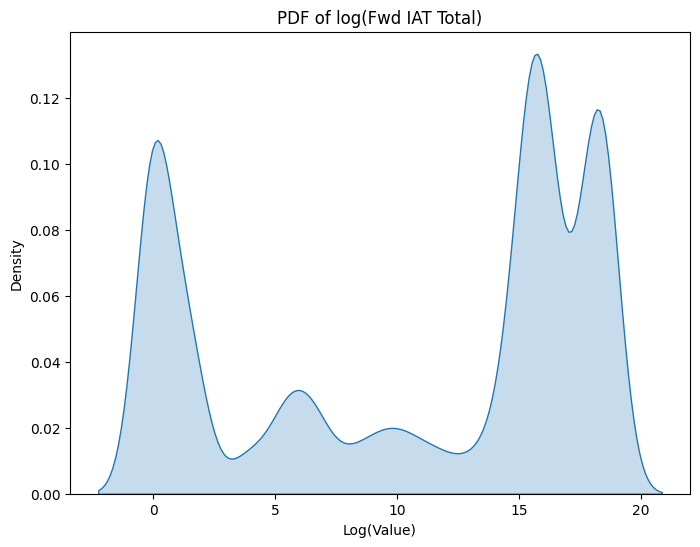

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


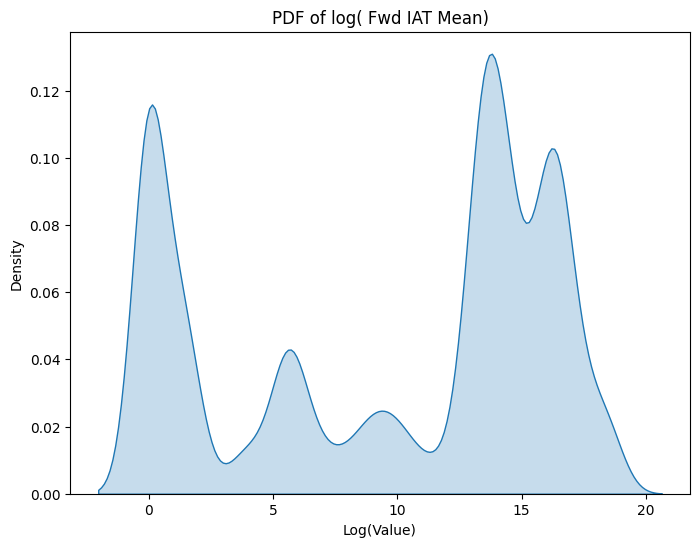

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


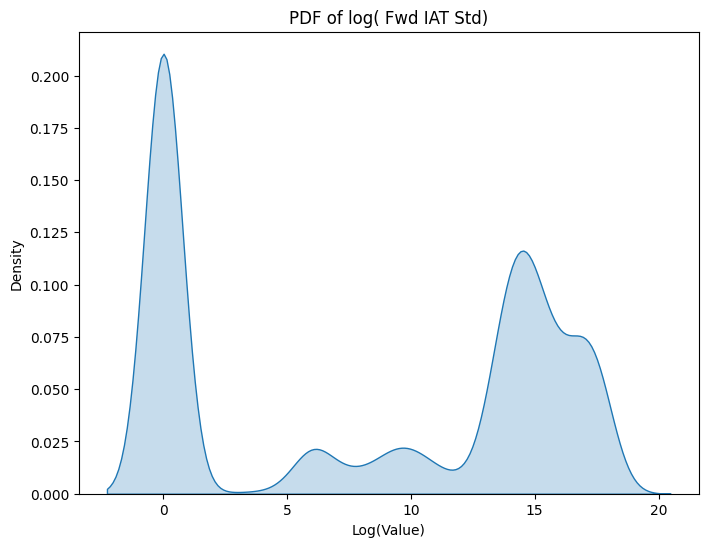

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


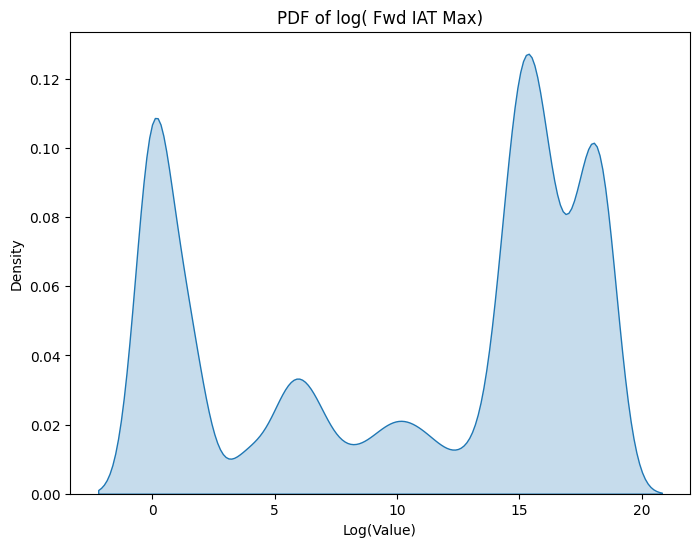

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


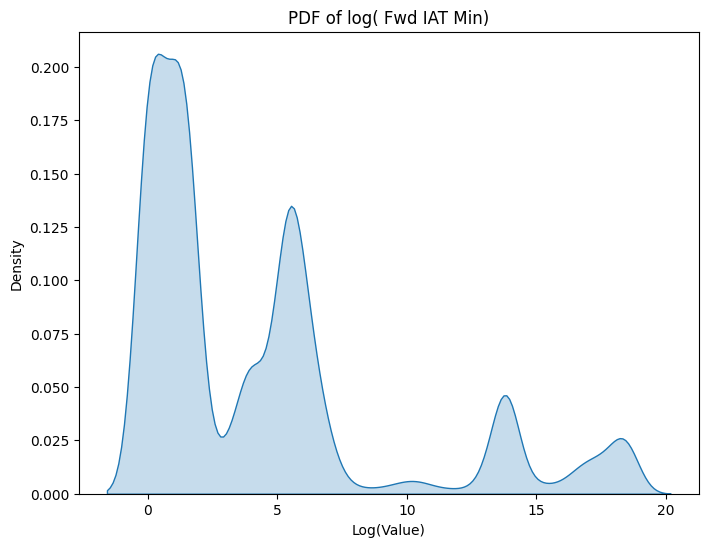

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


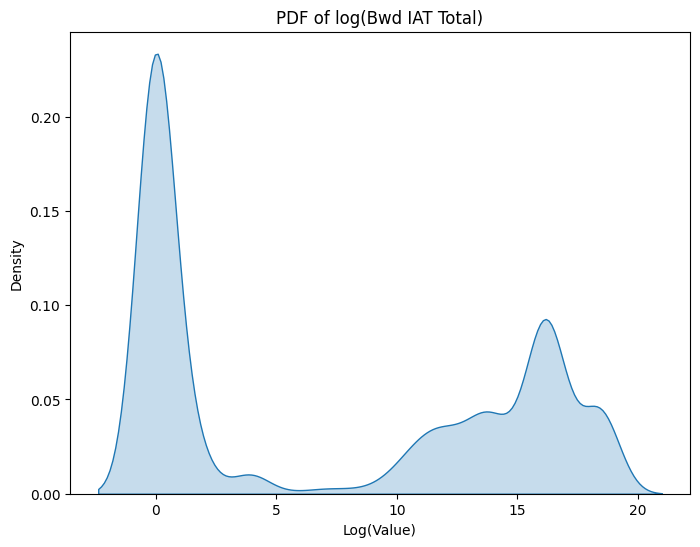

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


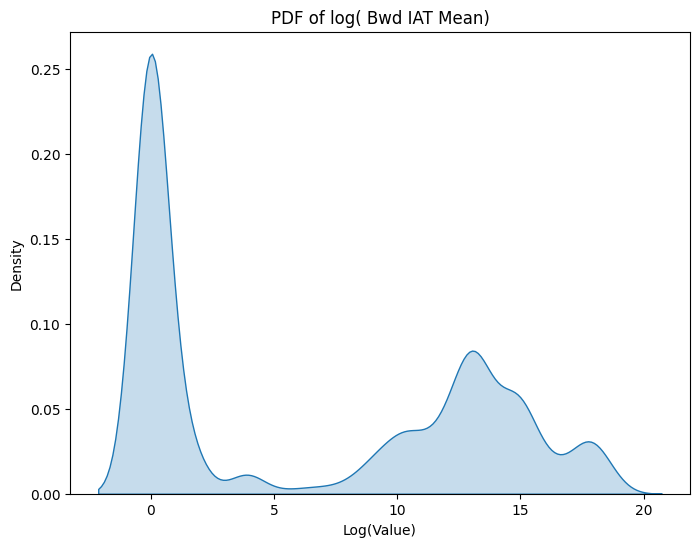

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


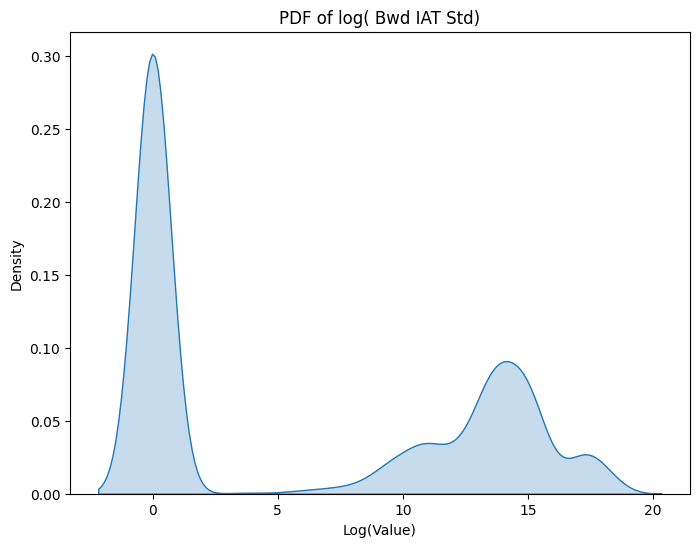

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


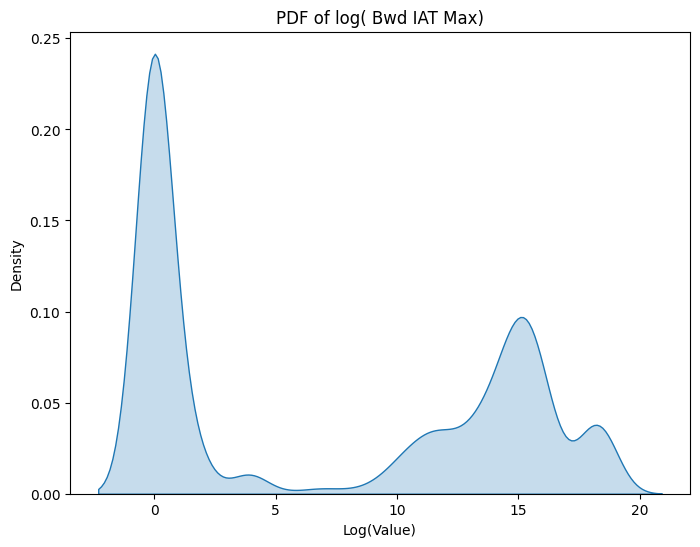

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


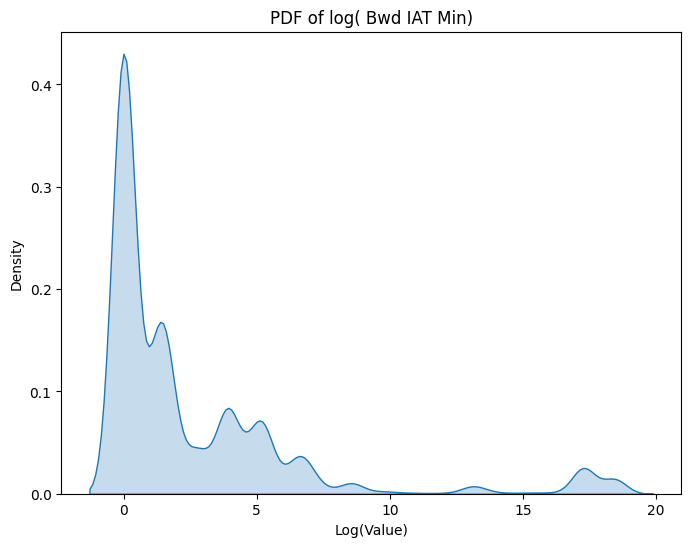

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


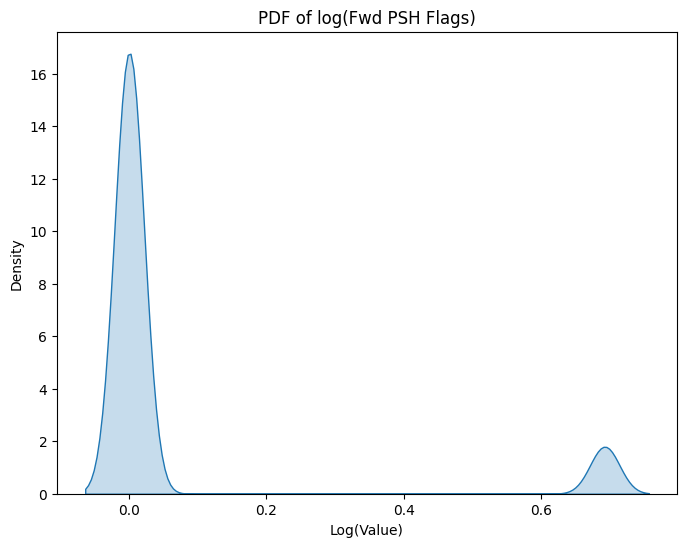

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


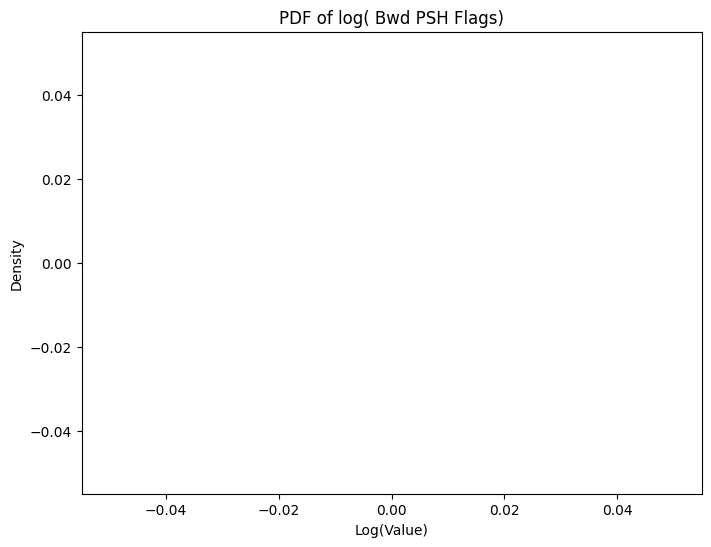

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


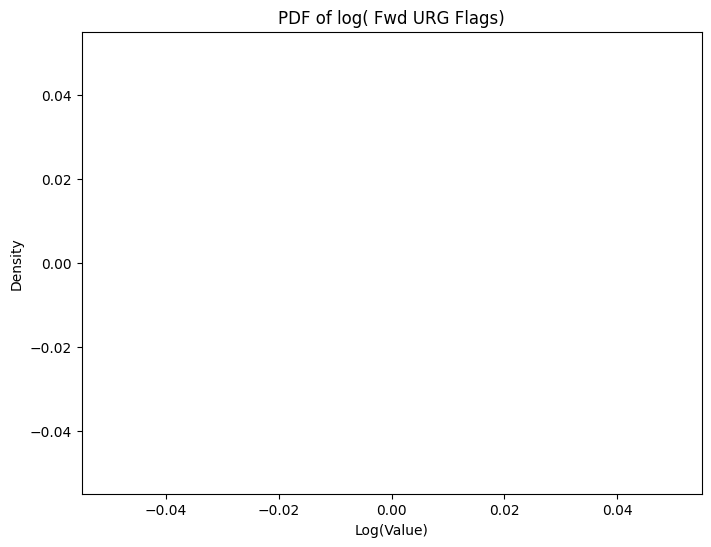

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


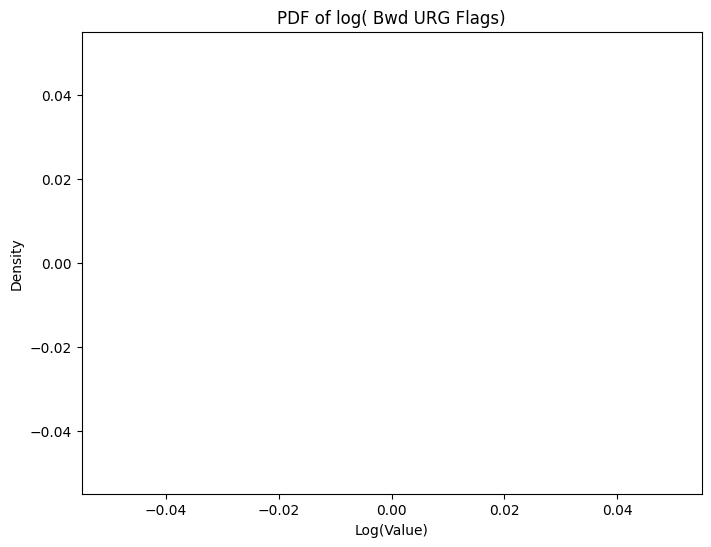

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


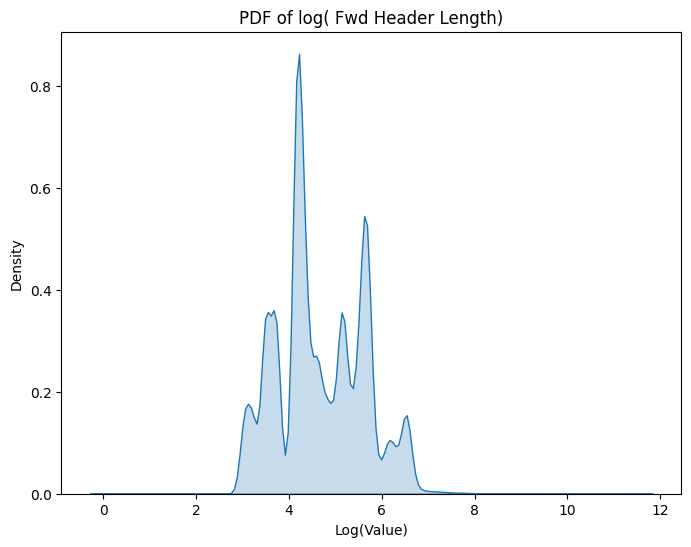

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


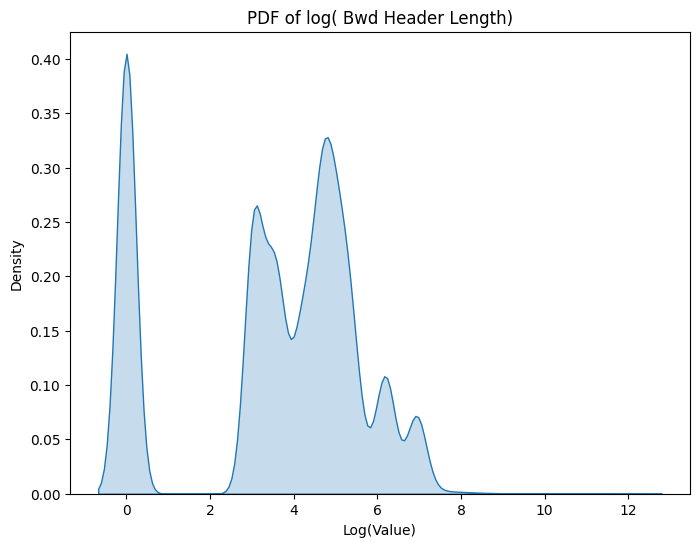

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


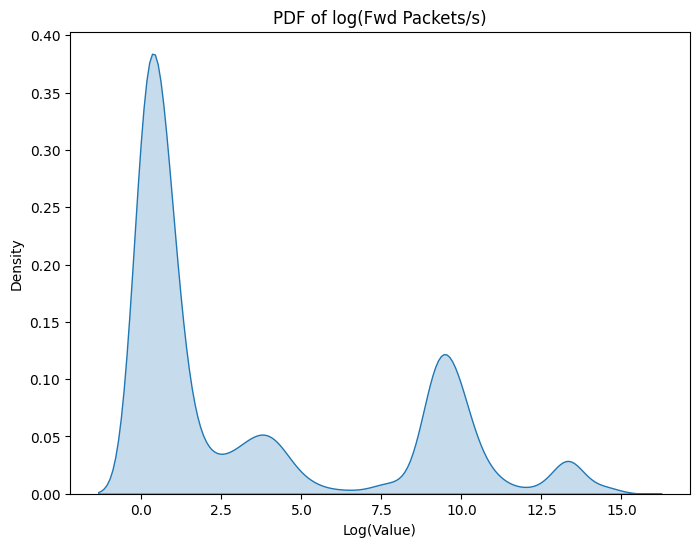

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


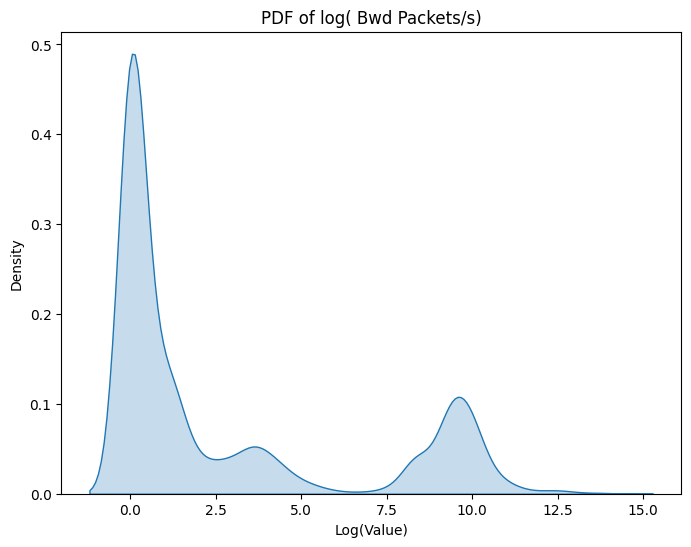

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


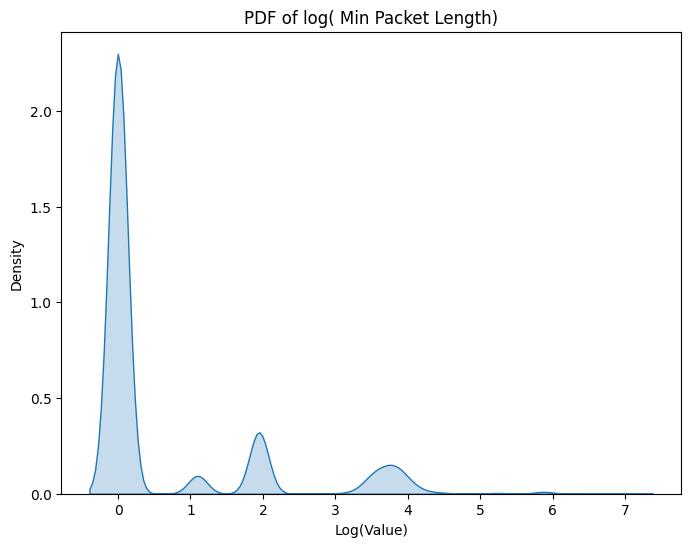

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


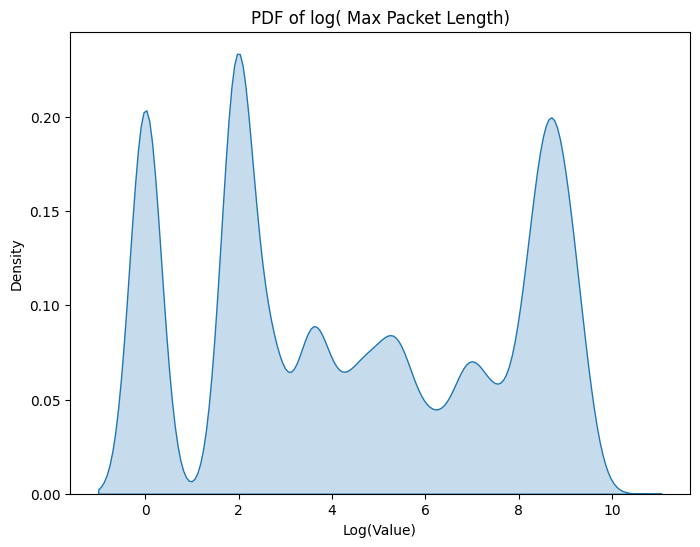

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


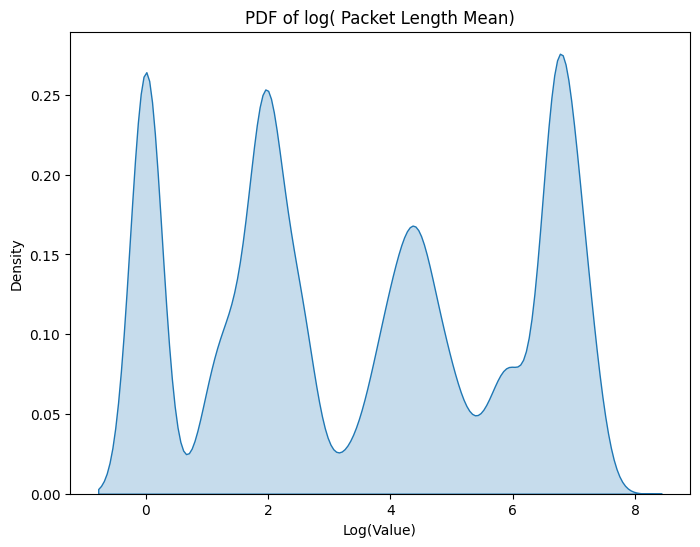

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


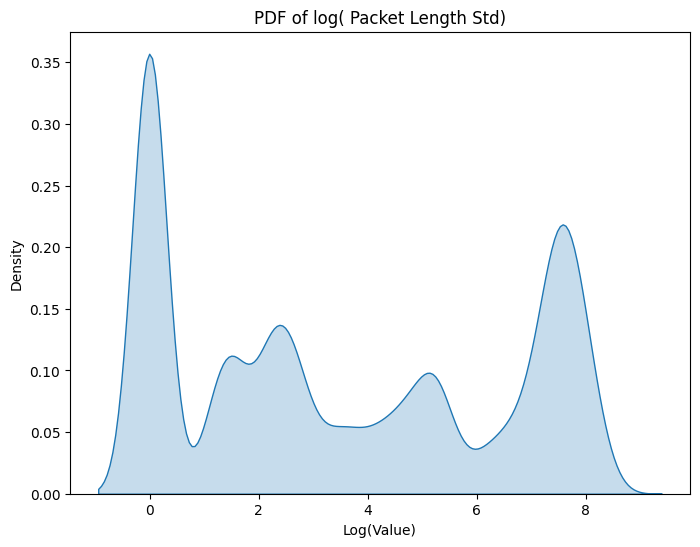

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


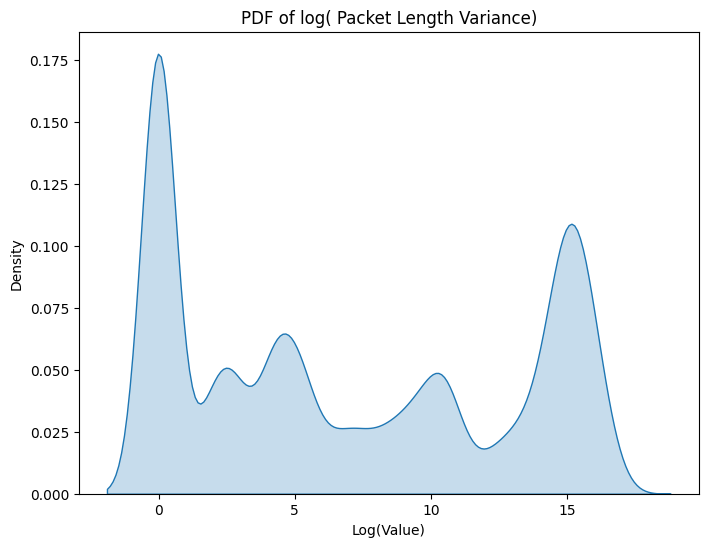

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


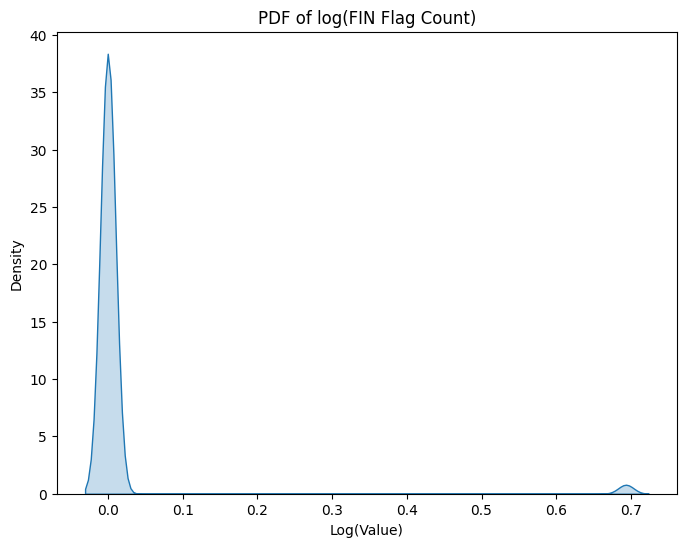

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


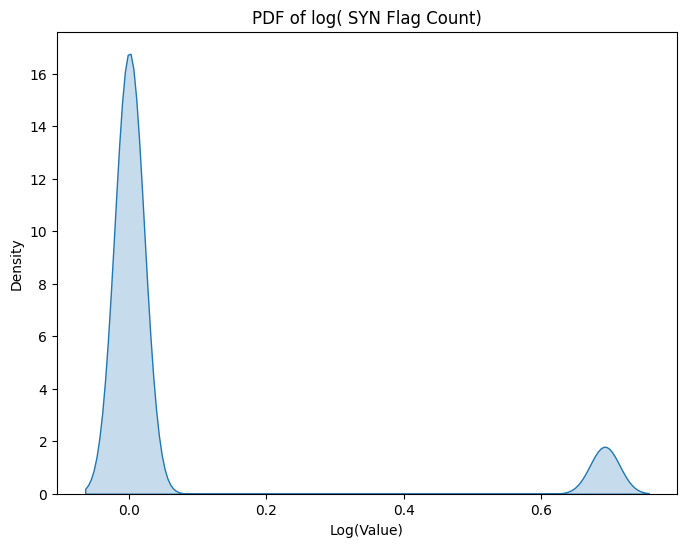

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


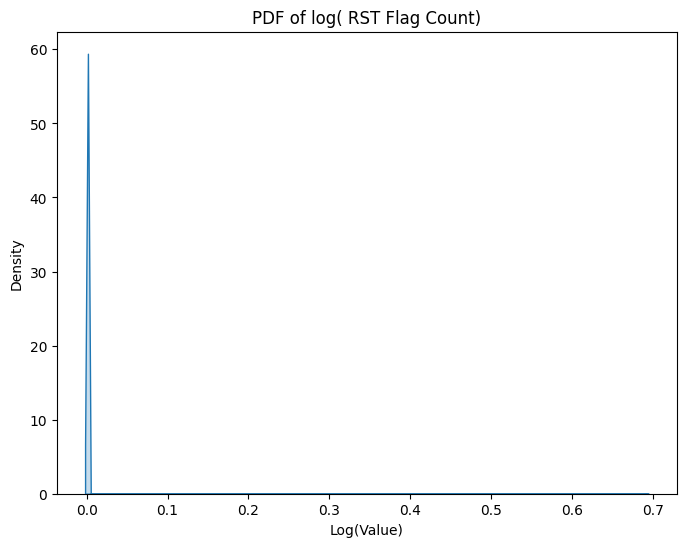

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


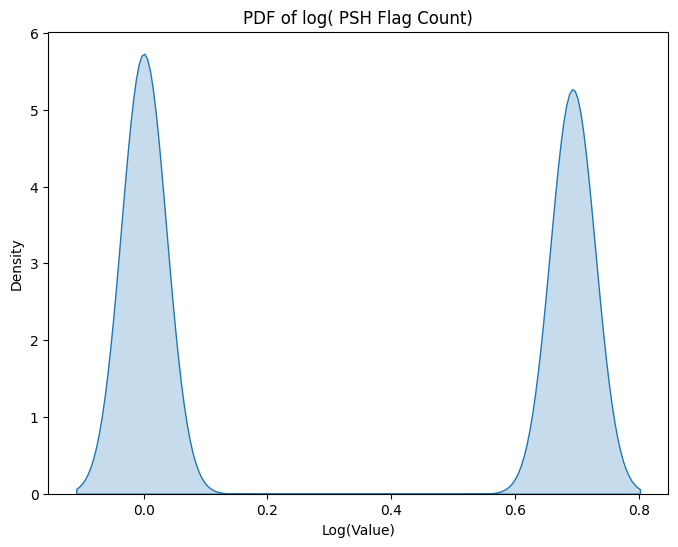

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


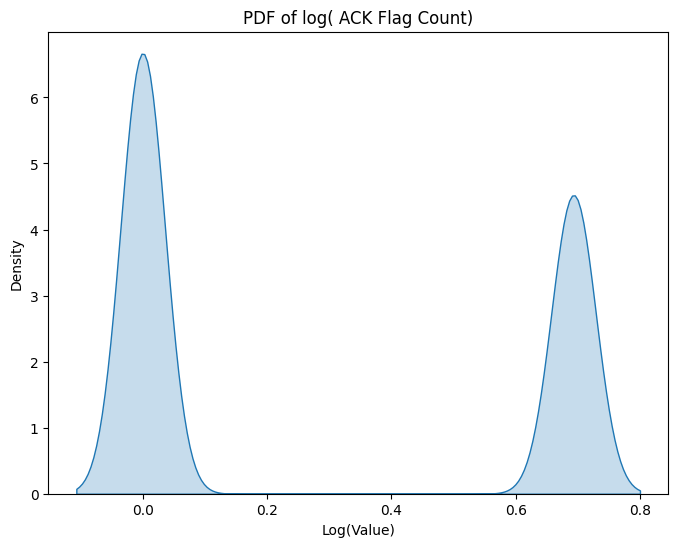

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


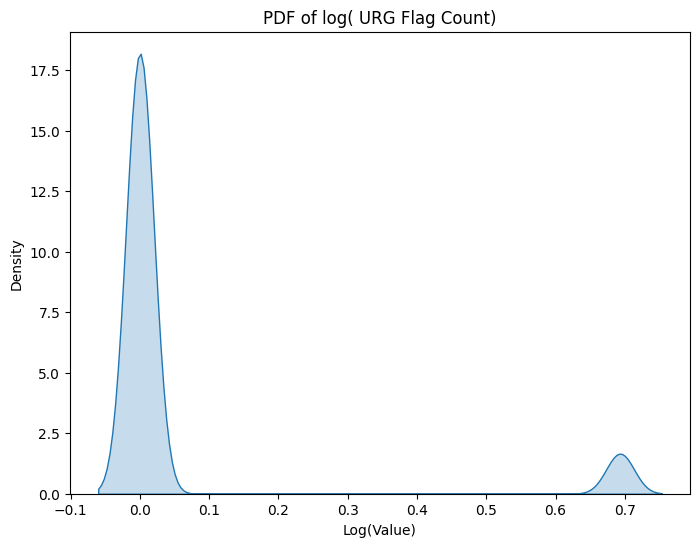

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


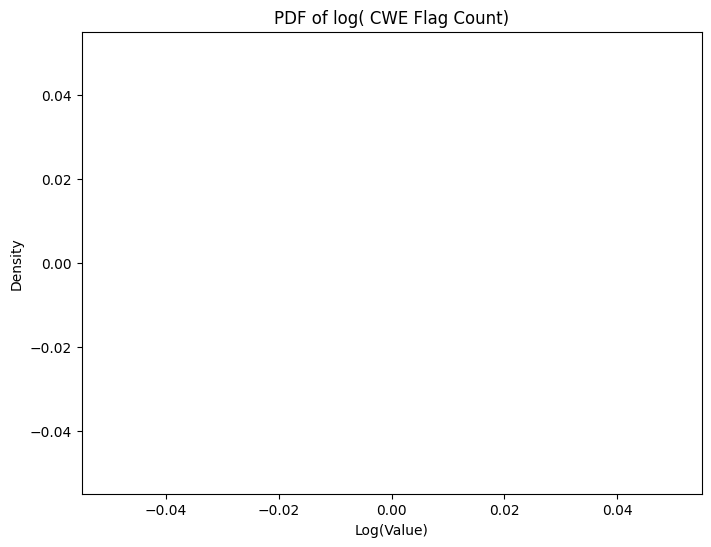

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


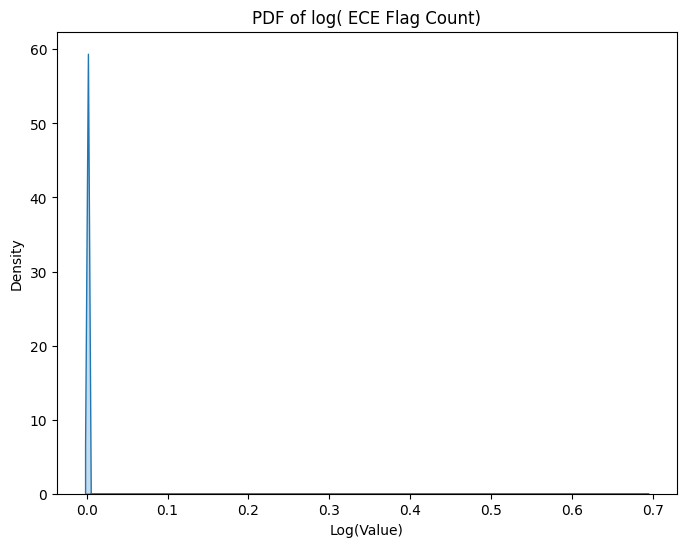

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


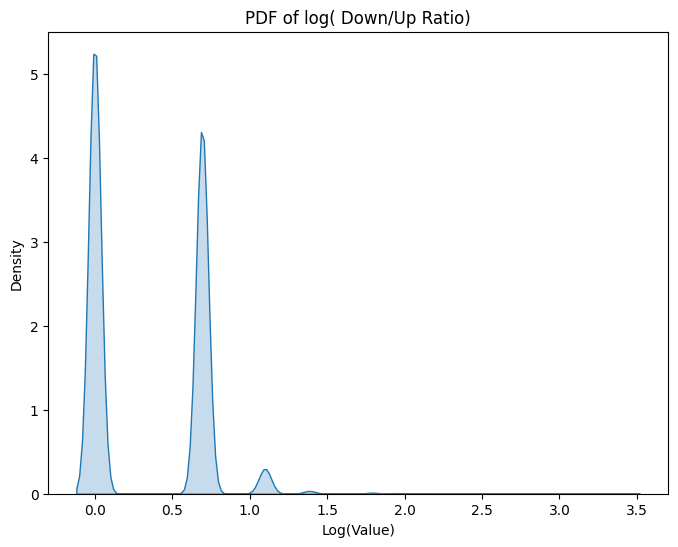

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


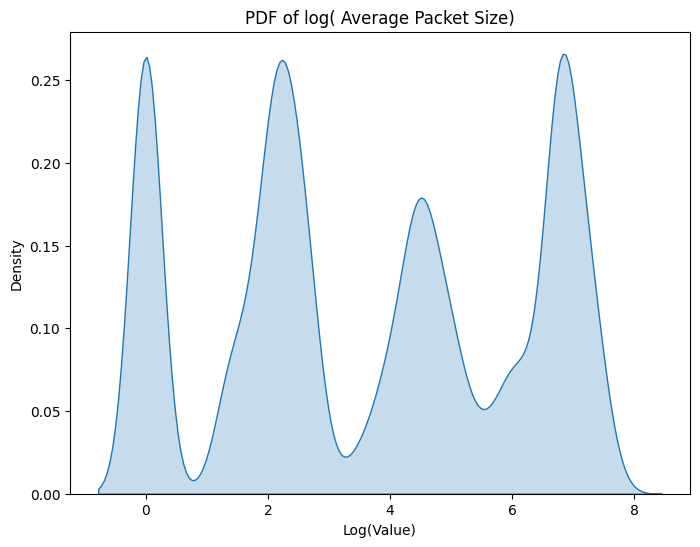

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


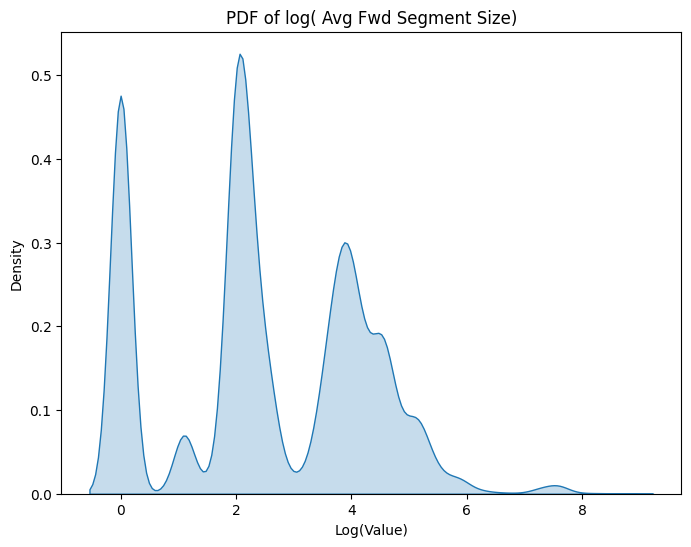

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


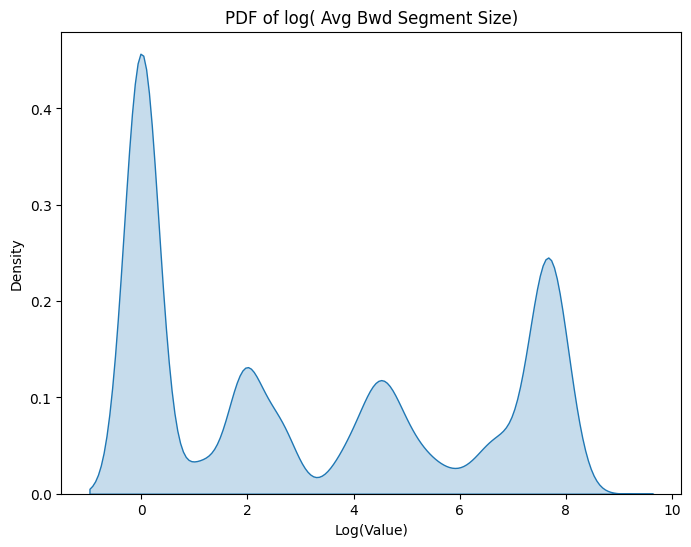

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


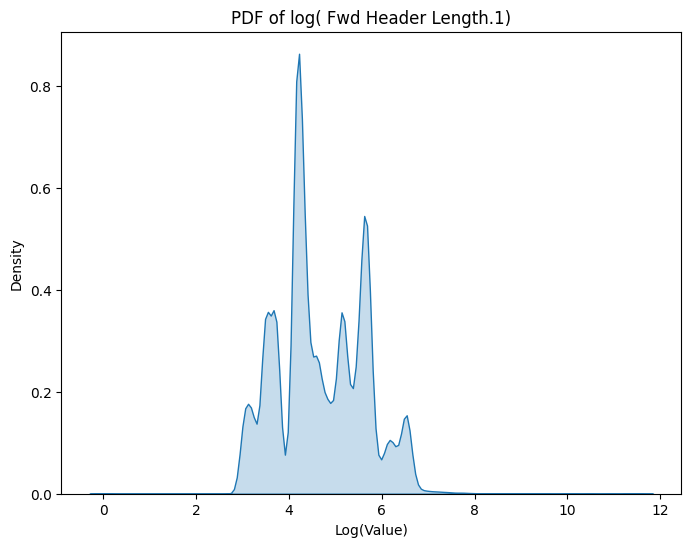

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


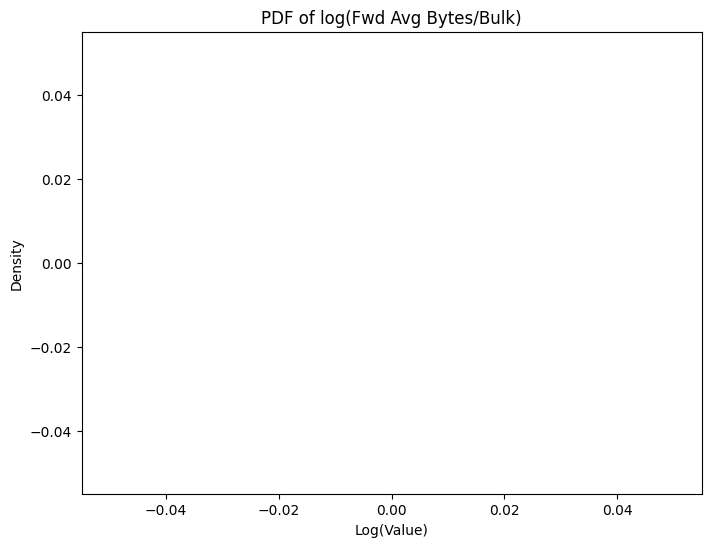

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


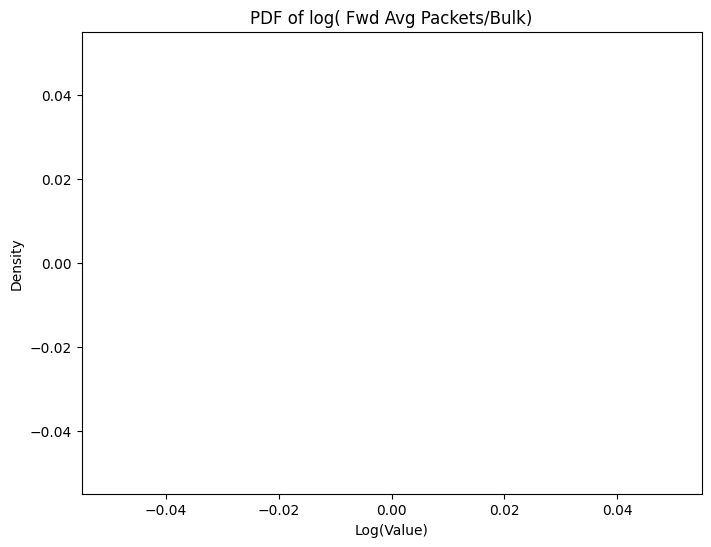

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


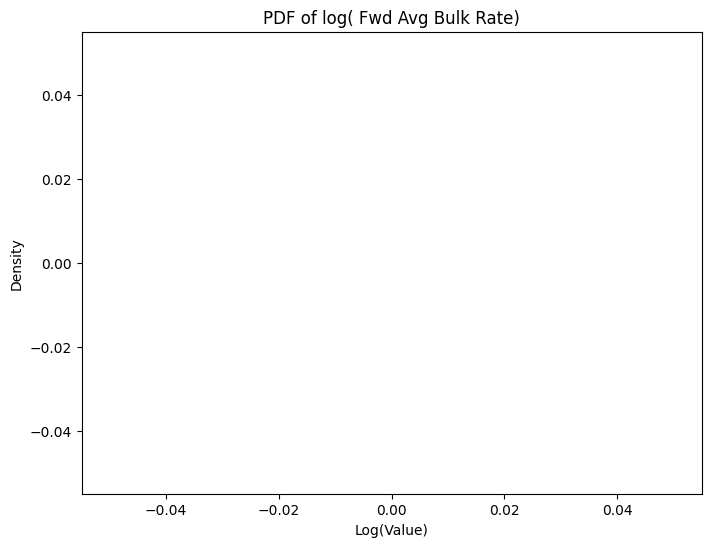

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


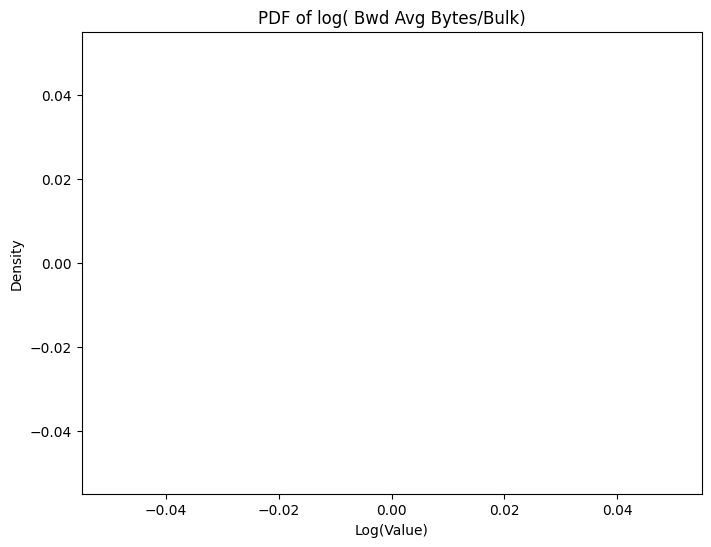

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


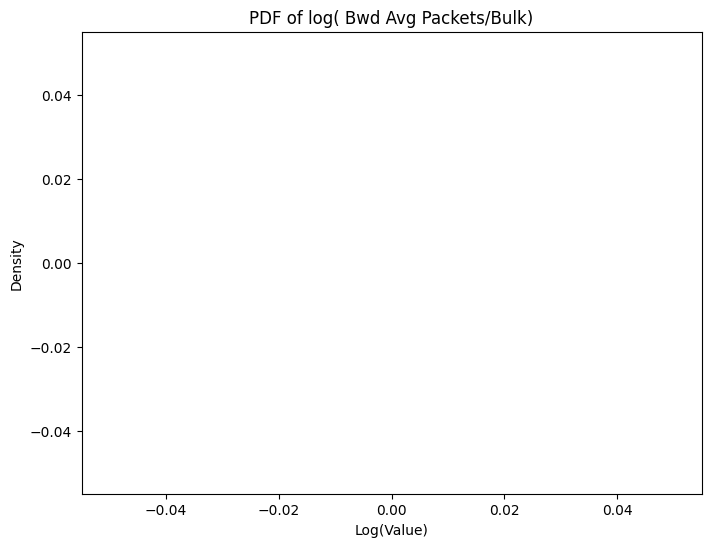

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)
<ipython-input-174-2a96501a0f35>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(log_transformed_data, shade=True)


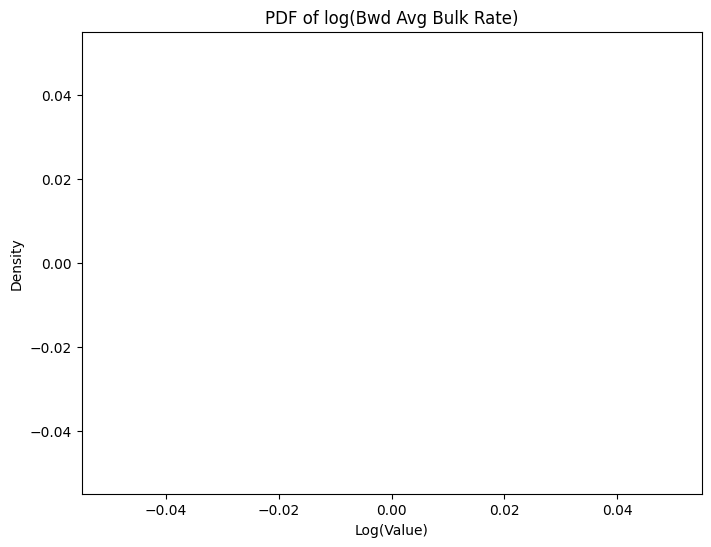

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


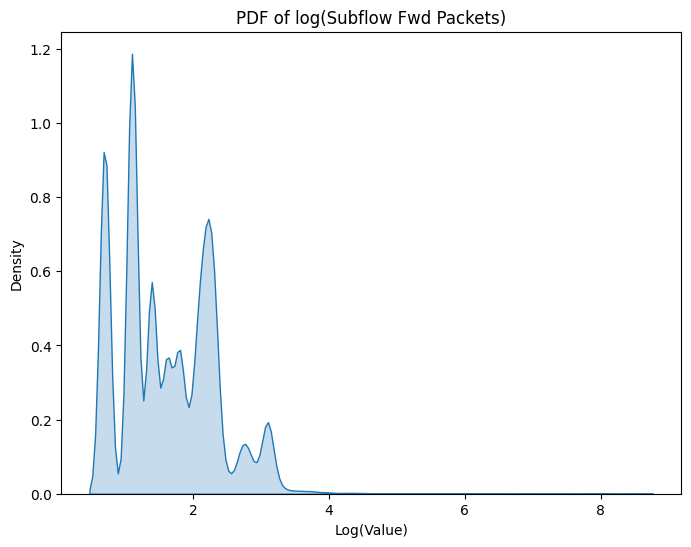

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


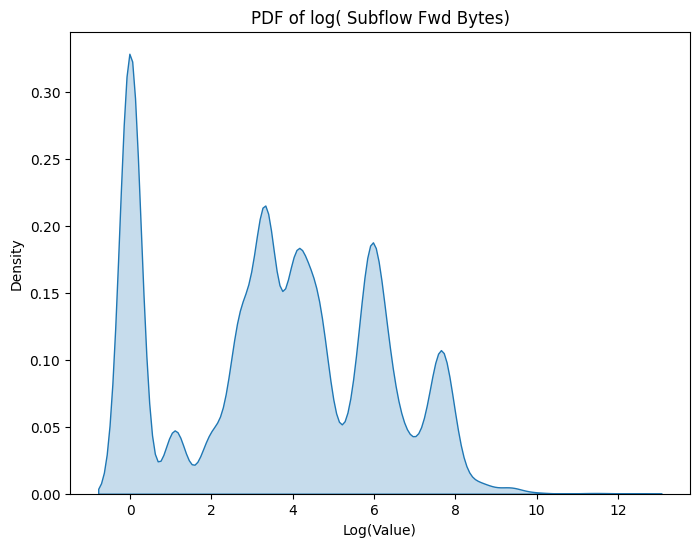

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


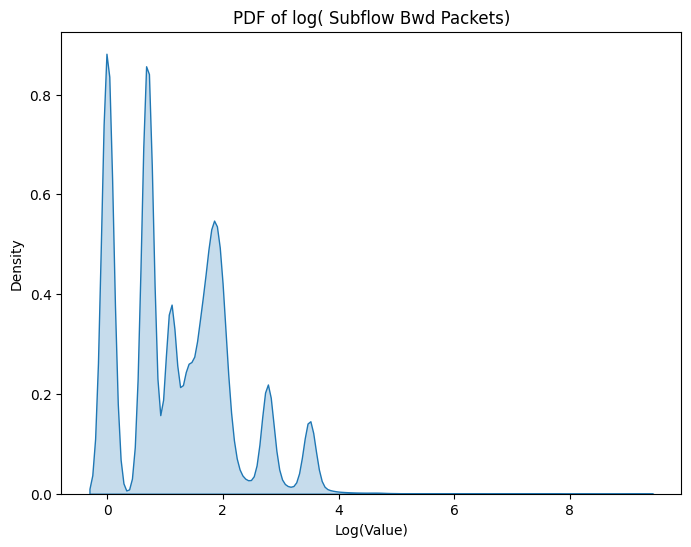

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


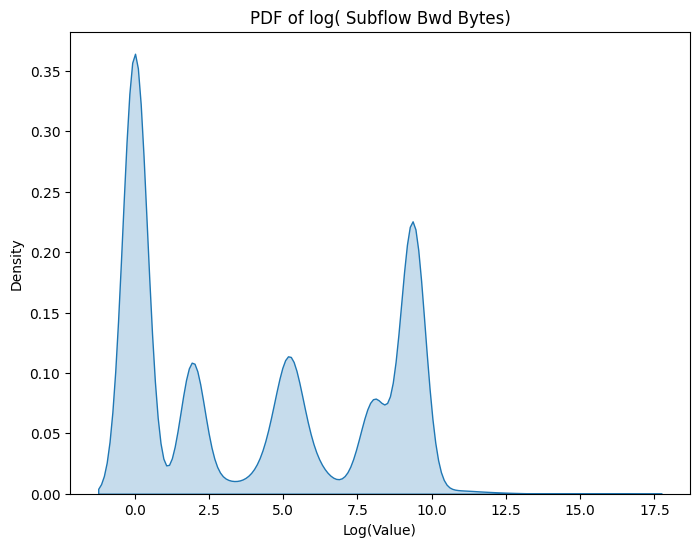

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


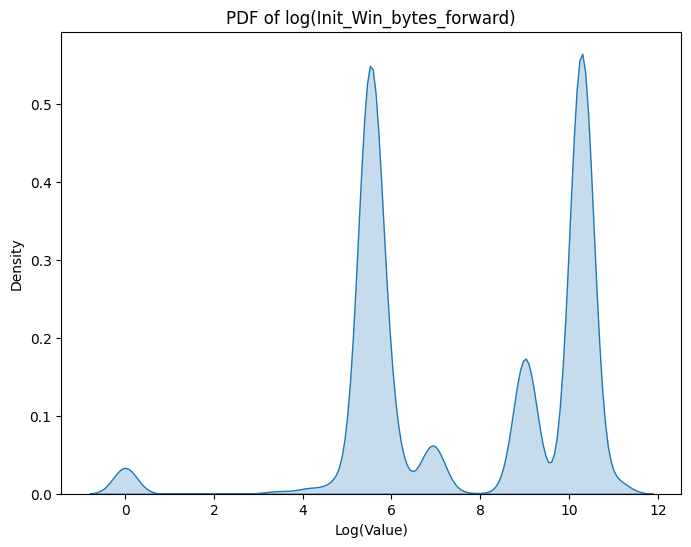

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


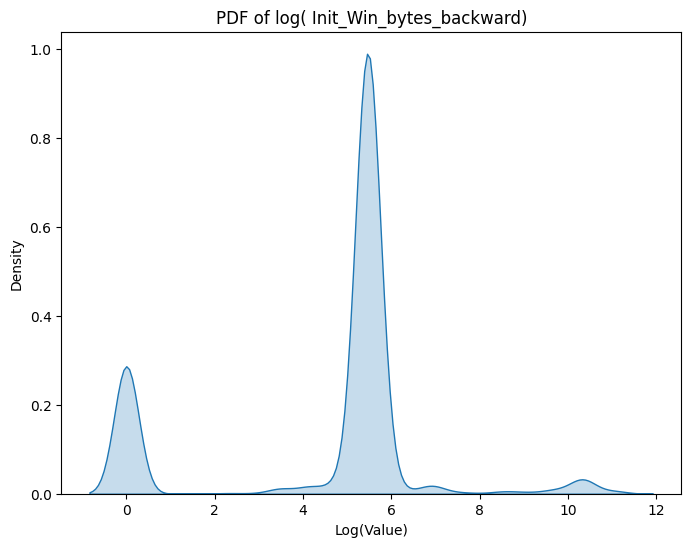

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


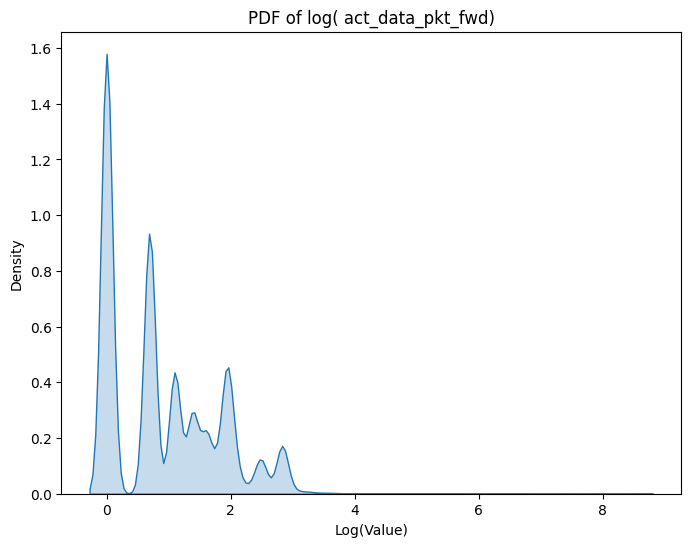

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


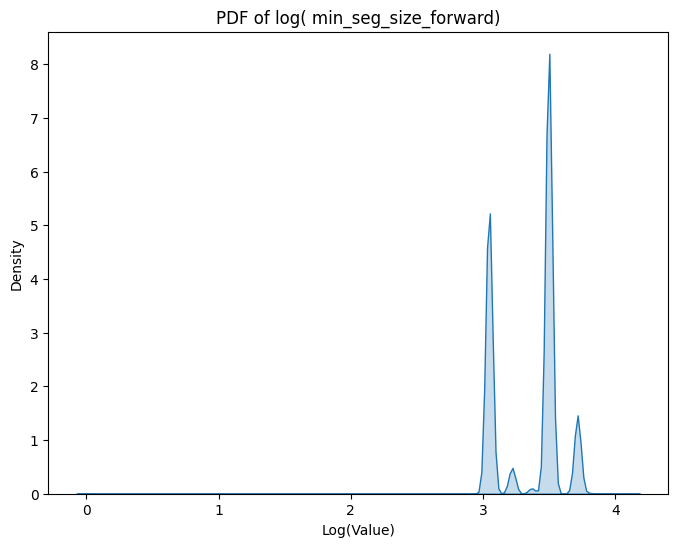

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


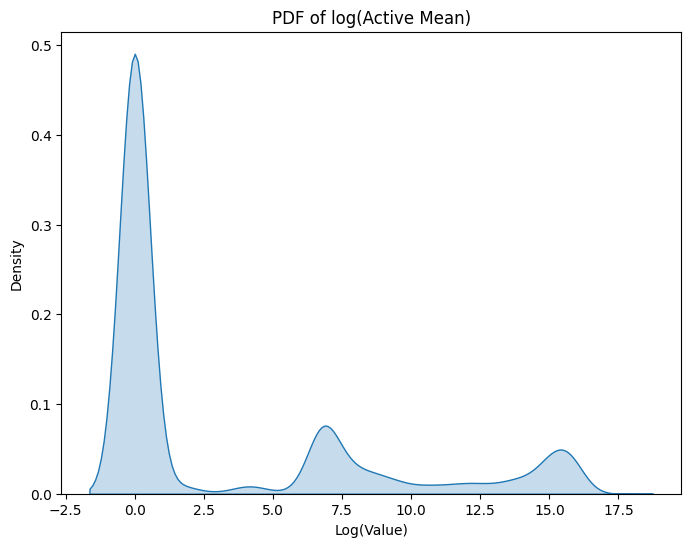

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


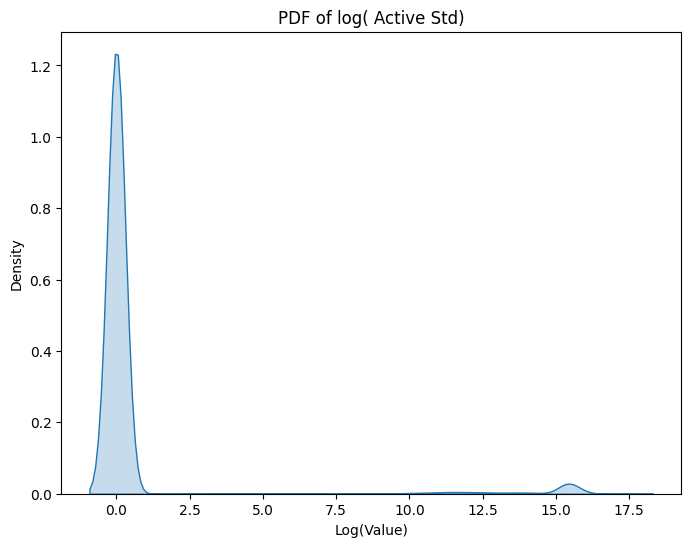

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


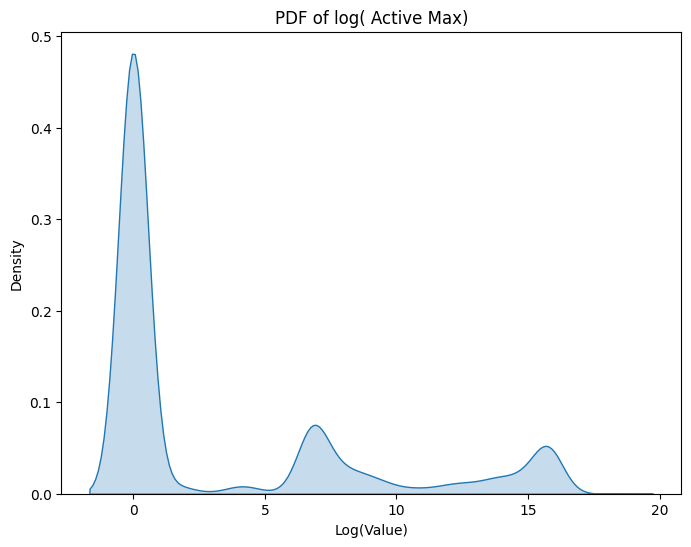

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


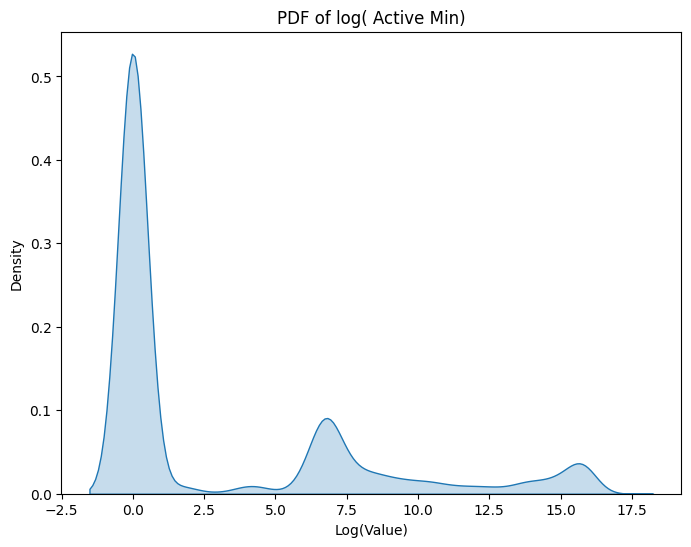

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


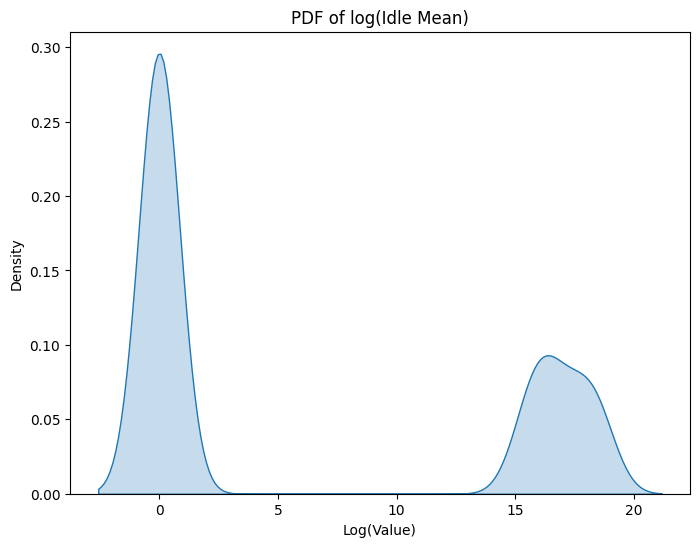

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


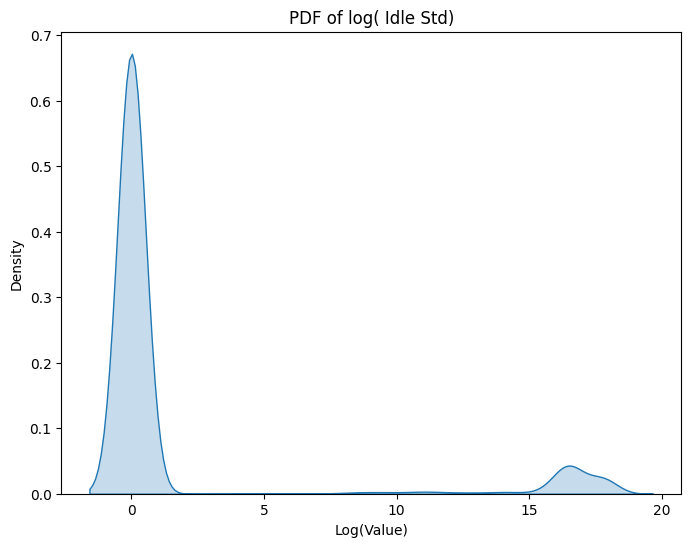

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


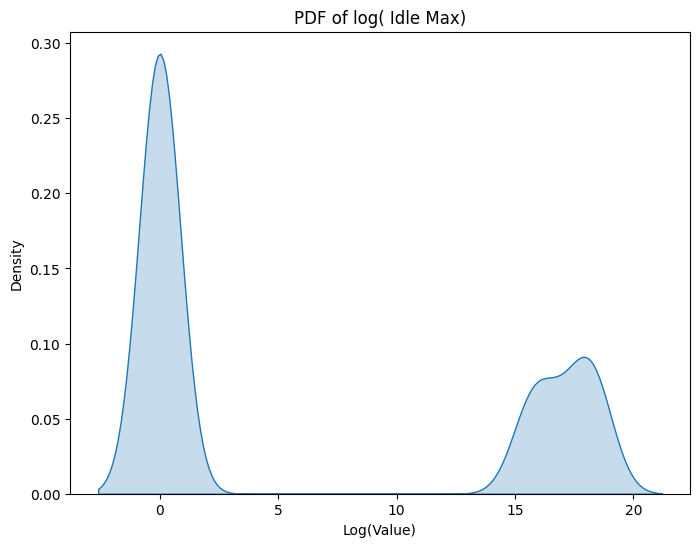

<ipython-input-174-2a96501a0f35>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(log_transformed_data, shade=True)


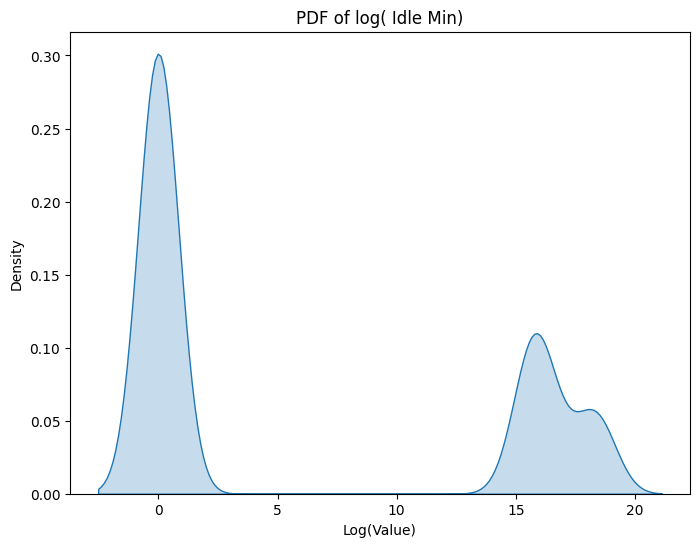

In [ ]:
import numpy as np

def plot_log_pdfs(df):
    for col in df.columns:
        # Check if the column is numeric before applying log transformation
        if pd.api.types.is_numeric_dtype(df[col]):
            # Apply log transformation, handling potential errors
            try:
                log_transformed_data = np.log1p(df[col])  # Use log1p to avoid log(0) errors
                plt.figure(figsize=(8, 6))
                sns.kdeplot(log_transformed_data, shade=True)
                plt.xlabel('Log(Value)')
                plt.ylabel('Density')
                plt.title(f'PDF of log({col})')
                plt.show()
            except ValueError as e:  # Handle negative values or zeros
                print(f"Could not apply log transformation to column '{col}': {e}")
                # Optionally, you could plot the original data here
                # plt.figure(figsize=(8, 6))
                # sns.kdeplot(dff[col], shade=True)
                # plt.xlabel('Value')
                # plt.ylabel('Density')
                # plt.title(f'PDF of {col}')
                # plt.show()

plot_log_pdfs(df) # Call the function

## **Check for Outliers**
Use boxplots to identify outliers in numeric columns.

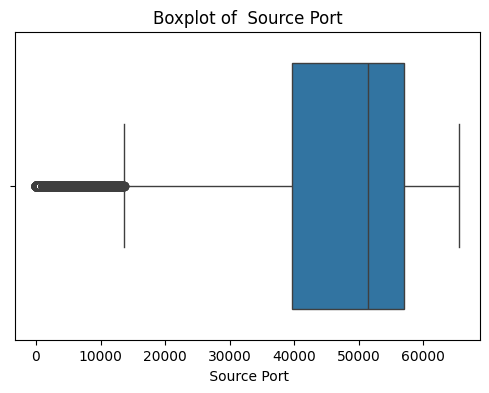

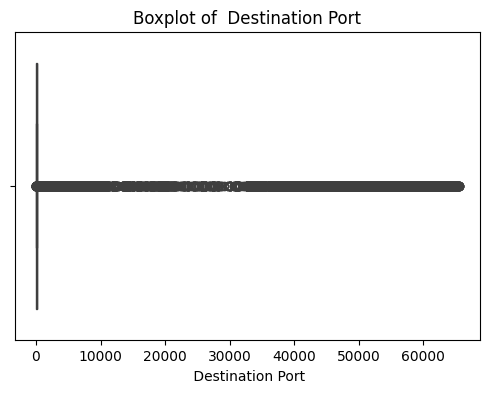

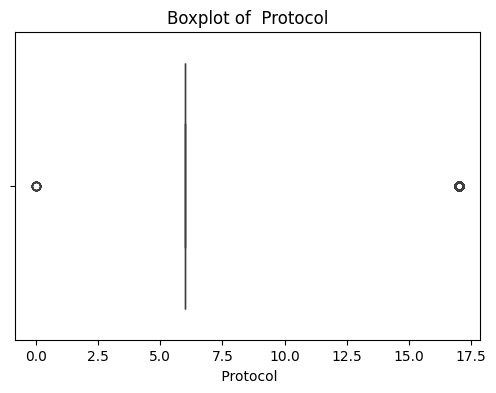

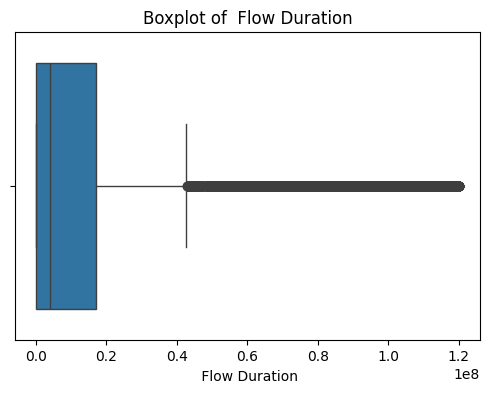

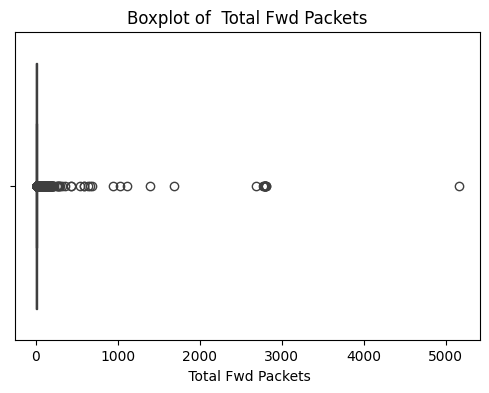

...

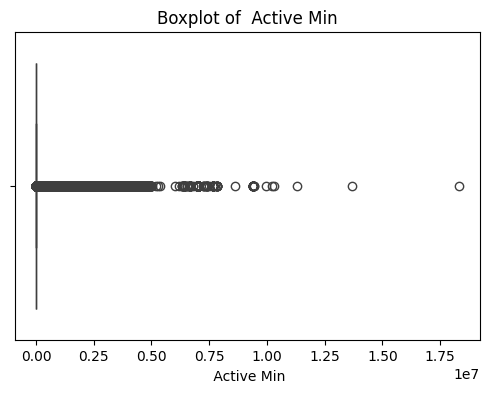

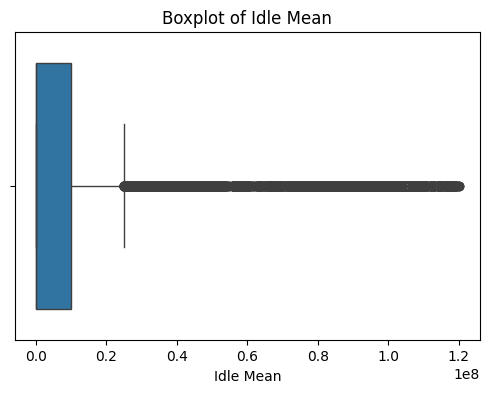

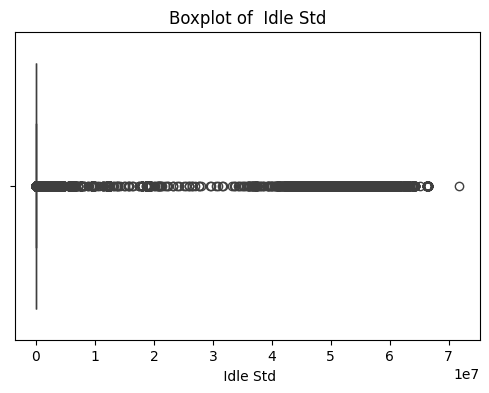

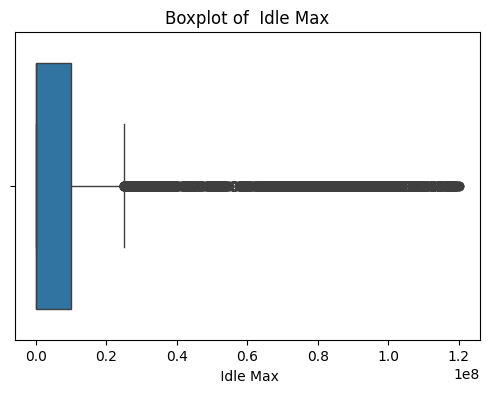

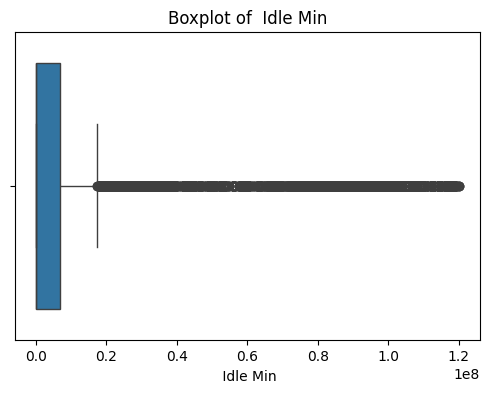

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_boxplots(df, numeric_features):
    """Plots boxplots for the specified numeric features of a DataFrame.

    Args:
        df: The input DataFrame.
        numeric_features: A list of numeric column names to plot.
    """

    for col in numeric_features:
        plt.figure(figsize=(6, 4))
        sns.boxplot(x=df[col])
        plt.title(f"Boxplot of {col}")
        plt.show()

# Extract numerical features
numeric_features = df.select_dtypes(include=np.number).columns.tolist()

# Call the function to plot boxplots
plot_boxplots(df, numeric_features)

# Reomve the outliers

In [ ]:
# prompt: print unique value in label feature

print(df[' Label'].unique())


['BENIGN' 'SSH-Patator' 'DDoS' 'DoS Slowhttptest' 'FTP-Patator'
 'DoS GoldenEye' 'DoS slowloris' 'PortScan' 'DoS Hulk' 'Bot' 'Heartbleed']


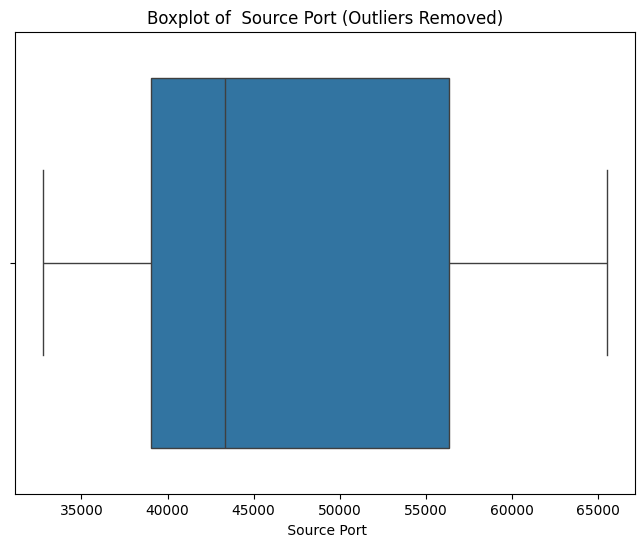

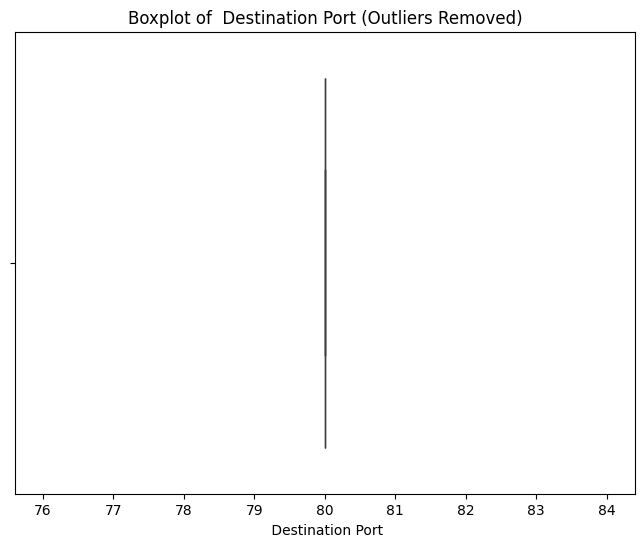

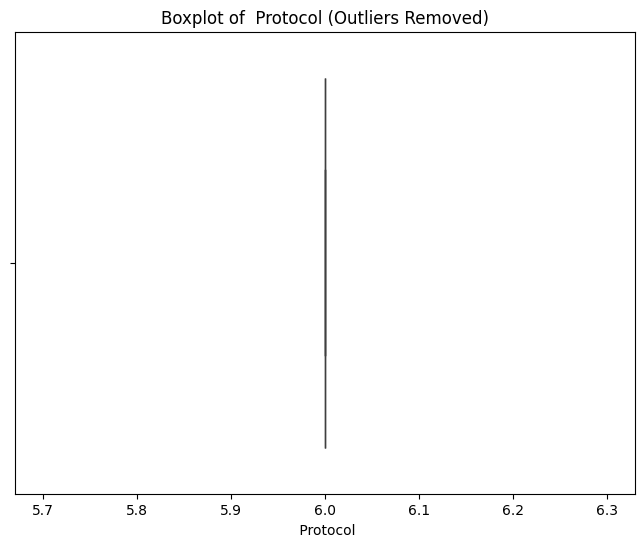

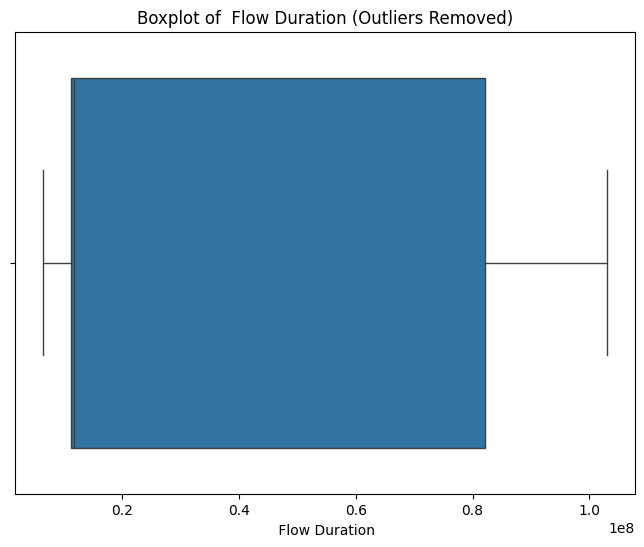

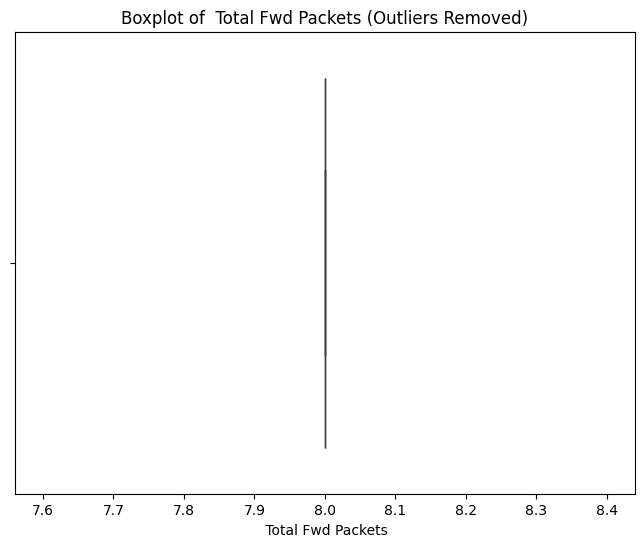

...

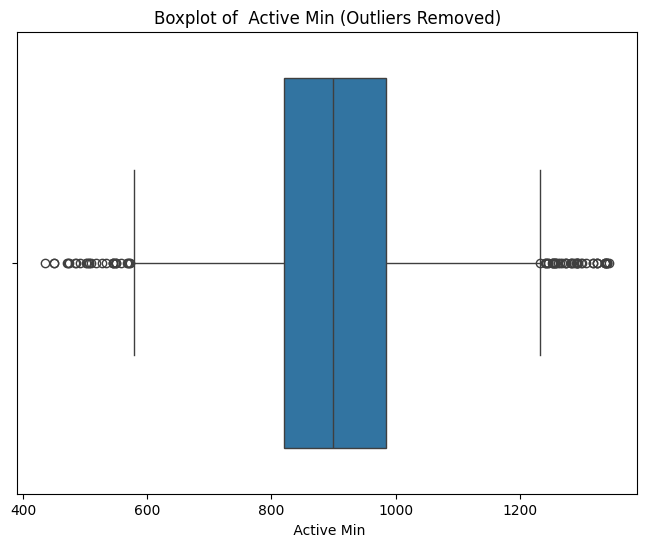

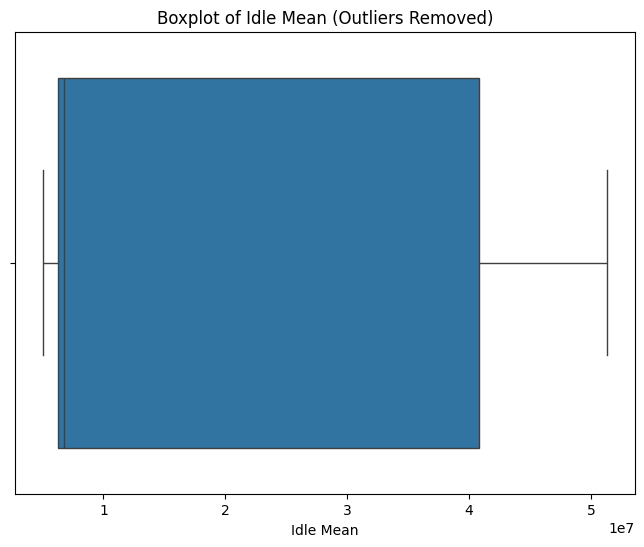

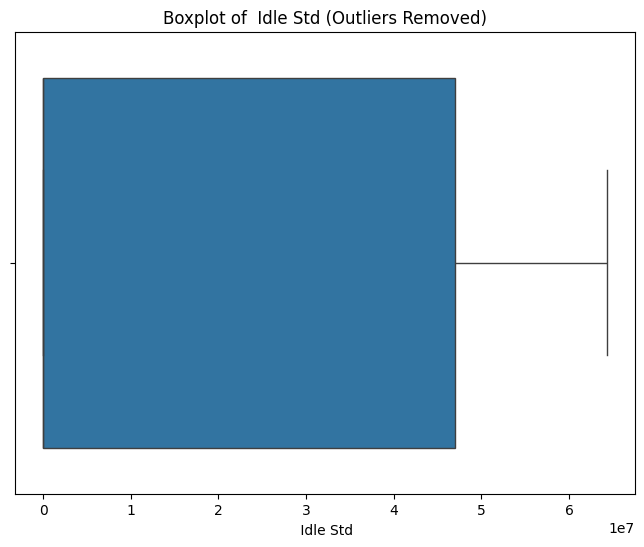

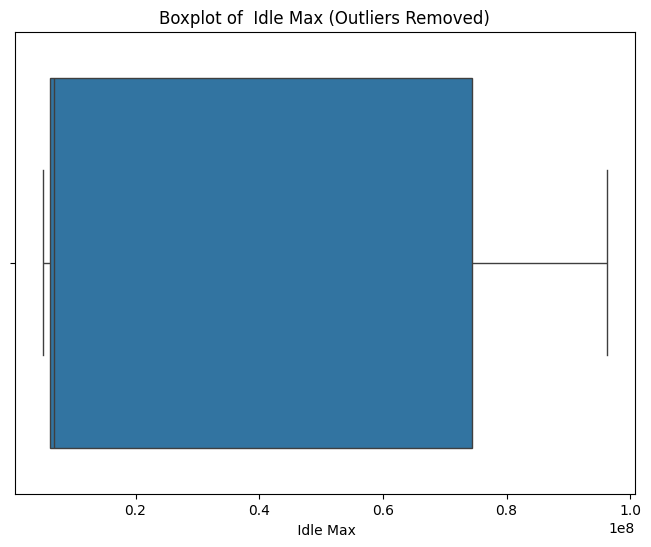

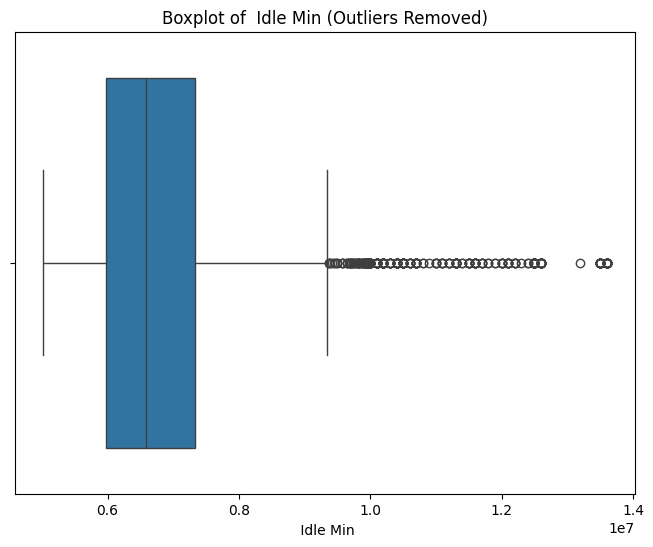

In [ ]:
# prompt: Write a function that remove the outlier from all above boxplot

def remove_outliers_iqr(df, column):
    """Removes outliers from a DataFrame column using the IQR method.

    Args:
        df: The input DataFrame.
        column: The name of the column to process.

    Returns:
        A new DataFrame with outliers removed from the specified column.
    """
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out rows where the column value is outside the bounds
    df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

    return df_filtered

# Example usage (assuming 'df' is your DataFrame and 'numeric_features' is a list of numeric column names):
numeric_features = df.select_dtypes(include=np.number).columns.tolist()
for col in numeric_features:
    df = remove_outliers_iqr(df, col)


# Loop through numerical features and create boxplots
for feature in numeric_features:
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    sns.boxplot(x=df[feature])  # Create the boxplot for the current feature
    plt.title(f"Boxplot of {feature} (Outliers Removed)")  # Set the title
    plt.xlabel(feature)  # Label the x-axis
    plt.show()

In [ ]:
df.shape

(2026, 84)

In [ ]:
# prompt: print unique value in label feature

print(df[' Label'].unique())


['DDoS' 'DoS GoldenEye' 'BENIGN']


In [ ]:
df.columns


Index(['Flow ID', ' Source IP', ' Source Port', ' Destination IP',
       ' Destination Port', ' Protocol', ' Flow Duration',
       ' Total Fwd Packets', ' Total Backward Packets',
       'Total Length of Fwd Packets', ' Total Length of Bwd Packets',
       ' Fwd Packet Length Max', ' Fwd Packet Length Min',
       ' Fwd Packet Length Mean', ' Fwd Packet Length Std',
       'Bwd Packet Length Max', ' Bwd Packet Length Min',
       ' Bwd Packet Length Mean', ' Bwd Packet Length Std', 'Flow Bytes/s',
       ' Flow Packets/s', ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max',
       ' Flow IAT Min', 'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std',
       ' Fwd IAT Max', ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean',
       ' Bwd IAT Std', ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags',
       ' Bwd PSH Flags', ' Fwd URG Flags', ' Bwd URG Flags',
       ' Fwd Header Length', ' Bwd Header Length', 'Fwd Packets/s',
       ' Bwd Packets/s', ' Min Packet Length', ' Max Packet Length',


# **Encoding Categorical Variables**
1) Label Encoding for ordered data.

2) One-Hot Encoding for nominal data.

In [ ]:
# prompt: show the values of label featues

print(df[' Label'].unique())

['BENIGN' 'SSH-Patator' 'DDoS' 'DoS Slowhttptest' 'FTP-Patator'
 'DoS GoldenEye' 'DoS slowloris' 'PortScan' 'DoS Hulk' 'Bot' 'Heartbleed']


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

def convert_to_numeric(df, ordinal_cols, nominal_cols):
    """Converts object data to numeric data using label encoding and one-hot encoding.

    Args:
        df: The input DataFrame.
        ordinal_cols: A list of column names representing ordinal data.
        nominal_cols: A list of column names representing nominal data.

    Returns:
        A new DataFrame with the specified columns converted to numeric types.
    """

    df_numeric = df.copy()  # Create a copy to avoid modifying the original DataFrame

    # Label encoding for ordinal features
    for col in ordinal_cols:
        if col in df_numeric.columns:  # Check if the column exists in the DataFrame
            le = LabelEncoder()  # Create a new LabelEncoder for each column
            df_numeric[col] = le.fit_transform(df_numeric[col])
        else:
            print(f"Warning: Column '{col}' not found in the DataFrame.")

    # One-hot encoding for nominal features
    if nominal_cols:  # Only proceed if nominal columns exist
        for col in nominal_cols:
            if col in df_numeric.columns:
                # Create OneHotEncoder with sparse=False and handle_unknown='ignore'
                ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

                # Fit on all unique values in the original DataFrame
                ohe.fit(df[[col]])

                # Transform the current DataFrame
                encoded_features = ohe.transform(df_numeric[[col]])

                # Create column names for the encoded features
                feature_names = [f"{col}_{category}" for category in ohe.categories_[0]]

                # Create a DataFrame for the encoded features
                encoded_df = pd.DataFrame(encoded_features, columns=feature_names, index=df_numeric.index)

                # Concatenate the encoded features with the original DataFrame
                df_numeric = pd.concat([df_numeric, encoded_df], axis=1)

                # Drop the original nominal column
                df_numeric = df_numeric.drop(columns=[col])
            else:
                print(f"Warning: Column '{col}' not found in the DataFrame.")

    return df_numeric

# Example usage (replace with your actual column names):
ordinal_cols = [' Source IP', ' Destination IP']
nominal_cols = [' Label']
df_converted = convert_to_numeric(df, ordinal_cols, nominal_cols)
df_converted.head(5)

,Flow ID,Source IP,Source Port,Destination IP,Destination Port,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,...,Label_Bot,Label_DDoS,Label_DoS GoldenEye,Label_DoS Hulk,Label_DoS Slowhttptest,Label_DoS slowloris,Label_FTP-Patator,Label_Heartbleed,Label_PortScan,Label_SSH-Patator
0,192.168.10.3-192.168.10.8-53-50958-17,572,50958,1038,53,17,30613,2,2,94,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,172.16.0.1-192.168.10.50-46952-22-6,336,46952,1040,22,6,79,1,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,172.16.0.1-192.168.10.50-64441-80-6,336,64441,1040,80,6,1351997,4,0,24,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,172.16.0.1-192.168.10.50-38998-80-6,336,38998,1040,80,6,63133461,7,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,172.16.0.1-192.168.10.50-50606-80-6,336,50606,1040,80,6,63131320,7,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# prompt: write a code that generate the reportfile
#  of all above actvities in EDA

import pandas as pd

def generate_eda_report(df, report_filename="eda_report.txt"):
    """Generates an EDA report file summarizing key findings."""

    with open(report_filename, "w") as report_file:
        # --- Basic Information ---
        report_file.write("## Exploratory Data Analysis Report\n\n")
        report_file.write("**1. Data Overview:**\n")
        report_file.write(f"Number of rows: {df.shape[0]}\n")
        report_file.write(f"Number of columns: {df.shape[1]}\n\n")

        report_file.write("**2. Data Types:**\n")
        report_file.write(str(df.dtypes) + "\n\n")

        report_file.write("**3. Missing Values:**\n")
        missing_values = df.isnull().sum()
        report_file.write(str(missing_values) + "\n\n")

        report_file.write("**4. Infinite Values:**\n")
        infinite_values = df.isin([np.inf, -np.inf]).sum()
        report_file.write(str(infinite_values) + "\n\n")


        # --- Numeric Features ---
        numeric_features = df.select_dtypes(include=np.number).columns
        report_file.write("**5. Numeric Features Summary Statistics:**\n")
        report_file.write(str(df[numeric_features].describe()) + "\n\n")


        # --- Categorical Features ---
        categorical_features = df.select_dtypes(exclude=np.number).columns
        report_file.write("**6. Categorical Features Value Counts:**\n")
        for col in categorical_features:
            report_file.write(f"--- {col}:\n")
            report_file.write(str(df[col].value_counts()) + "\n\n")

        # Add more sections as needed (e.g., outlier detection, visualizations, etc.)


# Example usage (assuming 'df' is your DataFrame)
generate_eda_report(df)

In [ ]:
# prompt: write a code that generate the report in pdf file
#  of all above actvities in EDA

!pip install fpdf

from fpdf import FPDF

def generate_pdf_report(df, report_filename="eda_report.pdf"):
    pdf = FPDF()
    pdf.add_page()
    pdf.set_font("Arial", size=12)

    pdf.cell(200, 10, txt="Exploratory Data Analysis Report", ln=True, align="C")

    pdf.cell(200, 10, txt="1. Data Overview", ln=True)
    pdf.cell(200, 10, txt=f"Number of rows: {df.shape[0]}", ln=True)
    pdf.cell(200, 10, txt=f"Number of columns: {df.shape[1]}", ln=True)

    # Add other sections (data types, missing values, etc.) in a similar way.
    # Example:
    pdf.cell(200, 10, txt="2. Data Types", ln=True)
    pdf.multi_cell(0, 10, str(df.dtypes))

    pdf.cell(200, 10, txt="3. Missing Values", ln=True)
    missing_values = df.isnull().sum()
    pdf.multi_cell(0, 10, str(missing_values))


    # Save the PDF
    pdf.output(report_filename)
    print(f"EDA report saved to {report_filename}")

generate_pdf_report(df)

  Preparing metadata (setup.py) ... done
  Created wheel for fpdf: filename=fpdf-1.7.2-py2.py3-none-any.whl size=40704 sha256=551aa6e5d1e517572a04c88970d7d8870c57a70ad048069b17b027f848abe672
  Stored in directory: /root/.cache/pip/wheels/f9/95/ba/f418094659025eb9611f17cbcaf2334236bf39a0c3453ea455
Successfully built fpdf
EDA report saved to eda_report.pdf


In [ ]:
# prompt: write a code that generate the report html file
#  of all above actvities in EDA

import pandas as pd
from IPython.display import HTML

def generate_eda_report(df):
    """Generates an HTML report summarizing EDA activities."""

    report = """
    <html>
    <head>
        <title>EDA Report</title>
    </head>
    <body>
    <h1>Exploratory Data Analysis Report</h1>
    """

    # Add sections for each EDA step
    report += "<h2>Data Overview</h2>"
    report += f"<p>Shape: {df.shape}</p>"  # Add shape
    report += f"<pre>{df.head().to_html()}</pre>"  # Add head
    report += f"<pre>{df.info()}</pre>"  # Add info
    report += f"<pre>{df.describe().to_html()}</pre>"  # Add describe


    report += "<h2>Missing Values</h2>"
    report += f"<pre>{pd.DataFrame(df.isnull().sum(), columns=['Missing Values']).to_html()}</pre>"


    report += "<h2>Infinite Values</h2>"
    infinite_values = df.isin([np.inf, -np.inf])
    num_infinite = infinite_values.sum().sum()
    report += f"<p>Number of infinite values: {num_infinite}</p>"
    if num_infinite > 0:
        report += "<pre>"
        for col in df.columns:
          inf_rows = df[col][infinite_values[col]]
          if not inf_rows.empty:
            report += f"Column: {col}\n"
            report += f"Rows with infinite values:\n{inf_rows}\n"
        report += "</pre>"

    # ... (Add other sections for histograms, boxplots, etc.) ...


    report += "</body></html>"
    return report

# Generate the HTML report
html_report = generate_eda_report(df)

# Save to an HTML file
with open("eda_report.html", "w") as f:
    f.write(html_report)

# Display the report in the notebook
HTML(html_report)